In [11]:
import numpy as np

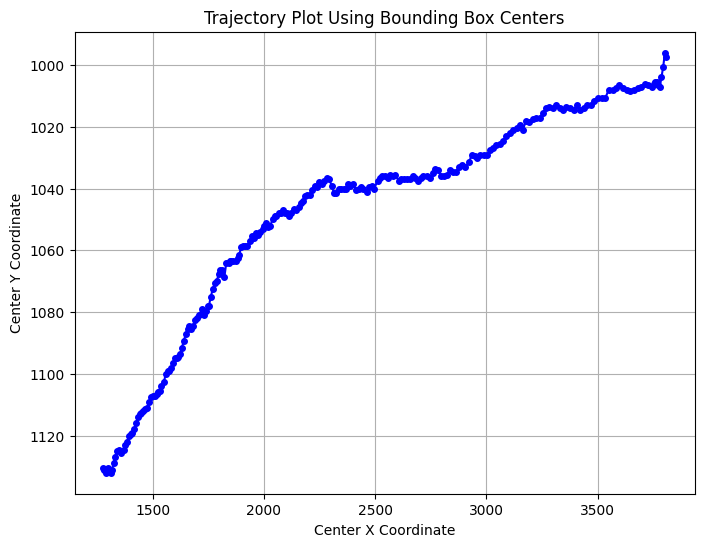

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = "10/1_.csv"  # Update with the correct path if needed
df = pd.read_csv(file_path)

# Compute the center of the bounding box
df["center_x"] = df["left"] + df["w"] / 2
df["center_y"] = df["top"] + df["h"] / 2

# Extract center coordinates
center_x = df["center_x"]
center_y = df["center_y"]

# Plot the trajectory using bbox centers
plt.figure(figsize=(8, 6))
plt.plot(center_x, center_y, marker='o', linestyle='-', color='b', markersize=4)
plt.title('Trajectory Plot Using Bounding Box Centers')
plt.xlabel('Center X Coordinate')
plt.ylabel('Center Y Coordinate')
plt.gca().invert_yaxis()  # Invert Y-axis for correct visualization (if needed)
plt.grid(True)
plt.show()


In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = "10/225_.csv"  # Update with the correct path if needed
df = pd.read_csv(file_path)

# Compute the center of the bounding box
df["center_x"] = df["left"] + df["w"] / 2
df["center_y"] = df["top"] + df["h"] / 2

In [14]:
df.head()

,frameNo,left,top,w,h,conf,lat,long,alt,center_x,center_y
0,564,4,1098,66,97,0.0,23.055951,72.506035,133.9,37.0,1146.5
1,565,6,1099,75,98,0.0,23.055951,72.506035,133.9,43.5,1148.0
2,566,6,1098,86,97,0.0,23.055951,72.506035,133.9,49.0,1146.5
3,567,7,1098,96,94,0.0,23.055951,72.506035,133.9,55.0,1145.0
4,568,7,1098,105,92,0.0,23.055951,72.506035,133.9,59.5,1144.0


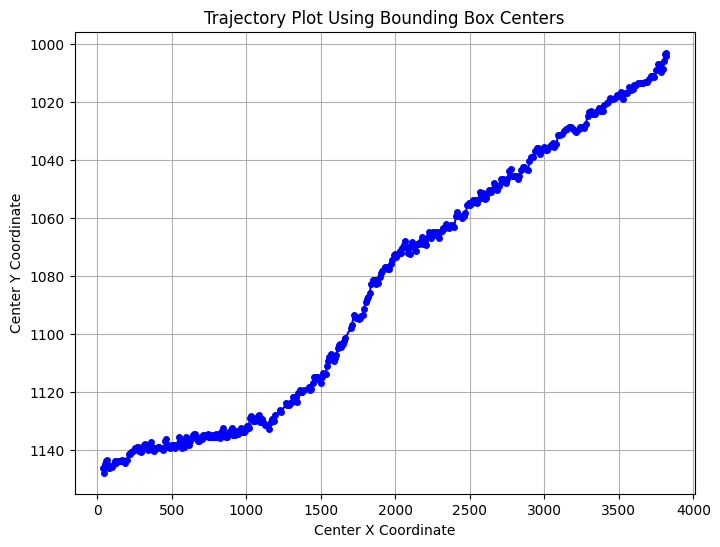

In [15]:
# Extract center coordinates
center_x = df["center_x"]
center_y = df["center_y"]

# Plot the trajectory using bbox centers
plt.figure(figsize=(8, 6))
plt.plot(center_x, center_y, marker='o', linestyle='-', color='b', markersize=4)
plt.title('Trajectory Plot Using Bounding Box Centers')
plt.xlabel('Center X Coordinate')
plt.ylabel('Center Y Coordinate')
plt.gca().invert_yaxis()  # Invert Y-axis for correct visualization (if needed)
plt.grid(True)
plt.show()

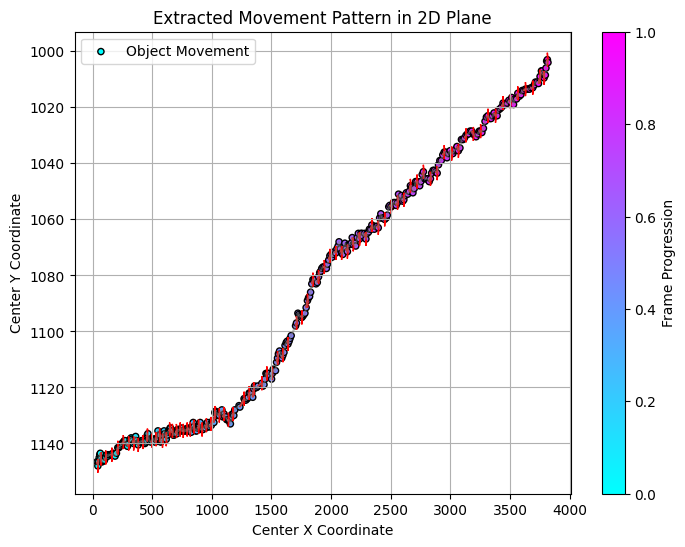

In [16]:
# Compute the center of the bounding box
df["center_x"] = df["left"] + df["w"] / 2
df["center_y"] = df["top"] + df["h"] / 2

# Extract center coordinates
center_x = df["center_x"].values
center_y = df["center_y"].values

# Create a color gradient based on time/frame number
frames = df["frameNo"].values
colors = np.linspace(0, 1, len(frames))  # Normalize values for color mapping

# Plot the trajectory with color gradient
plt.figure(figsize=(8, 6))
sc = plt.scatter(center_x, center_y, c=colors, cmap="cool", edgecolors='k', marker='o', s=20, label="Object Movement")

# Draw a line connecting the points for a clear pattern
plt.plot(center_x, center_y, linestyle='-', color='gray', alpha=0.5)

# Add arrows to indicate movement direction
for i in range(0, len(center_x) - 1, 5):  # Adjust step size to reduce clutter
    plt.arrow(center_x[i], center_y[i],
              center_x[i+1] - center_x[i], center_y[i+1] - center_y[i],
              head_width=5, head_length=5, fc='red', ec='red')

# Labels and title
plt.title("Extracted Movement Pattern in 2D Plane")
plt.xlabel("Center X Coordinate")
plt.ylabel("Center Y Coordinate")
plt.gca().invert_yaxis()  # Invert Y-axis for proper visualization
plt.colorbar(sc, label="Frame Progression")
plt.grid(True)
plt.legend()
plt.show()

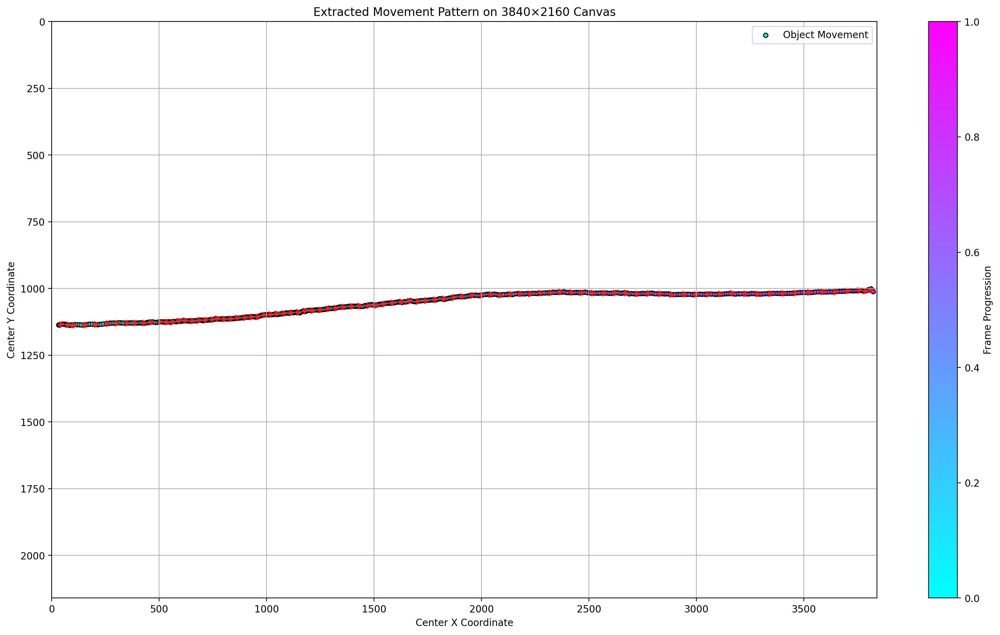

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV file
file_path = "10/436_.csv"  # Update this path as needed
df = pd.read_csv(file_path)

# Compute the center of the bounding box
df["center_x"] = df["left"] + df["w"] / 2
df["center_y"] = df["top"] + df["h"] / 2

# Extract center coordinates
center_x = df["center_x"].values
center_y = df["center_y"].values

# Normalize values to fit within the 3840x2160 resolution
img_width, img_height = 3840, 2160

# Ensure coordinates are within the image boundaries
center_x = np.clip(center_x, 0, img_width)
center_y = np.clip(center_y, 0, img_height)

# Create a color gradient based on time/frame number
frames = df["frameNo"].values
colors = np.linspace(0, 1, len(frames))  # Normalize values for color mapping

# Create the figure with 3840x2160 dimensions
plt.figure(figsize=(19.2, 10.8), dpi=200)  # Aspect ratio maintained

# Plot the trajectory with color gradient
sc = plt.scatter(center_x, center_y, c=colors, cmap="cool", edgecolors='k', marker='o', s=20, label="Object Movement")

# Draw a line connecting the points for a clear pattern
plt.plot(center_x, center_y, linestyle='-', color='gray', alpha=0.5)

# Add arrows to indicate movement direction
for i in range(0, len(center_x) - 1, 5):  # Adjust step size to reduce clutter
    plt.arrow(center_x[i], center_y[i],
              center_x[i+1] - center_x[i], center_y[i+1] - center_y[i],
              head_width=20, head_length=20, fc='red', ec='red')

# Labels and title
plt.title("Extracted Movement Pattern on 3840×2160 Canvas")
plt.xlabel("Center X Coordinate")
plt.ylabel("Center Y Coordinate")
plt.xlim(0, img_width)
plt.ylim(0, img_height)
plt.gca().invert_yaxis()  # Invert Y-axis for correct visualization (if needed)
plt.colorbar(sc, label="Frame Progression")
plt.grid(True)
plt.legend()

# Save the output image (optional)
plt.savefig("trajectory_plot_3840x2160.png", dpi=200, bbox_inches="tight")

plt.show()


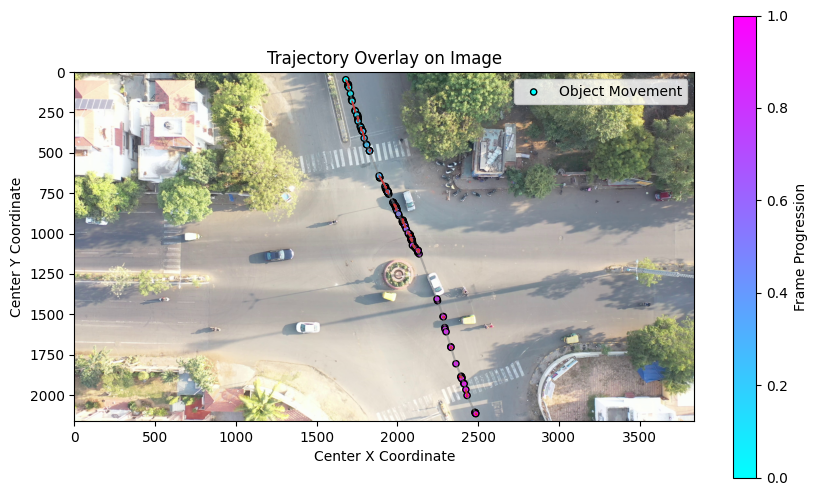

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Load the CSV file
file_path = "10/332_340_350_388_389_402_410_467_481_515_542_.csv"  # Update this path if needed
df = pd.read_csv(file_path)

# Load the background image
image_path = "sample10.jpg"  # Ensure the image is in the correct directory
background = cv2.imread(image_path)
img_height, img_width, _ = background.shape  # Get image dimensions

# Compute the center of the bounding box
df["center_x"] = df["left"] + df["w"] / 2
df["center_y"] = df["top"] + df["h"] / 2

# Extract center coordinates
center_x = df["center_x"].values
center_y = df["center_y"].values

# Ensure coordinates are within image boundaries
center_x = np.clip(center_x, 0, img_width)
center_y = np.clip(center_y, 0, img_height)

# Create a color gradient based on time/frame number
frames = df["frameNo"].values
colors = np.linspace(0, 1, len(frames))  # Normalize values for color mapping

# Plot the trajectory on the image
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(cv2.cvtColor(background, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB

# Plot trajectory points
sc = ax.scatter(center_x, center_y, c=colors, cmap="cool", edgecolors='k', marker='o', s=20, label="Object Movement")

# Draw a line connecting the points for a clear pattern
ax.plot(center_x, center_y, linestyle='-', color='gray', alpha=0.5)

# Add arrows to indicate movement direction
for i in range(0, len(center_x) - 1, 5):  # Adjust step size to reduce clutter
    ax.arrow(center_x[i], center_y[i],
             center_x[i+1] - center_x[i], center_y[i+1] - center_y[i],
             head_width=10, head_length=10, fc='red', ec='red')

# Labels and title
ax.set_title("Trajectory Overlay on Image")
ax.set_xlabel("Center X Coordinate")
ax.set_ylabel("Center Y Coordinate")
ax.set_xlim(0, img_width)
ax.set_ylim(img_height, 0)  # Invert Y-axis for correct visualization
plt.colorbar(sc, label="Frame Progression")
plt.grid(False)
plt.legend()

# Save the output image (optional)
plt.savefig("trajectory_on_image.png", dpi=200, bbox_inches="tight")

plt.show()


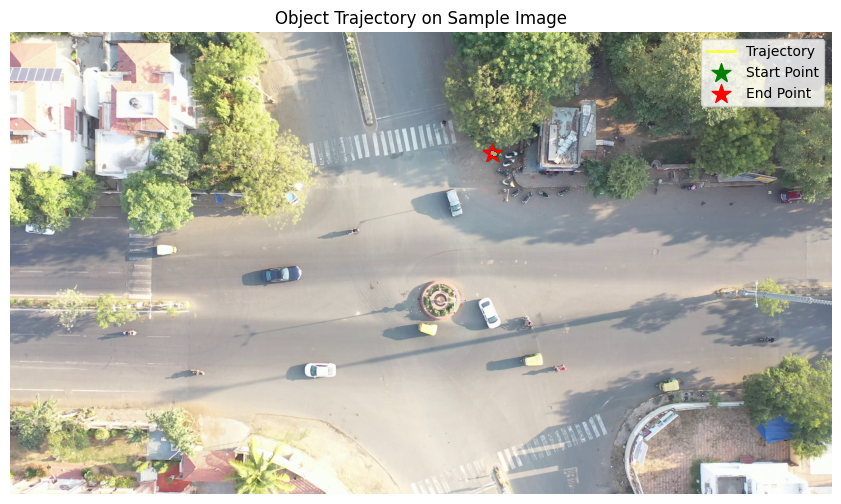

In [31]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the CSV file
file_path = "10/82_.csv"  # Update if needed
df = pd.read_csv(file_path)

# Compute the center of the bounding box
df["center_x"] = df["left"] + df["w"] / 2
df["center_y"] = df["top"] + df["h"] / 2

# Extract center coordinates
center_x = df["center_x"].values
center_y = df["center_y"].values

# Load the background image
image_path = "sample10.jpg"  # Update with the correct path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

# Get image dimensions
img_height, img_width, _ = image.shape

# Ensure coordinates are within image bounds
center_x = np.clip(center_x, 0, img_width - 1)
center_y = np.clip(center_y, 0, img_height - 1)

# Create a figure
plt.figure(figsize=(12, 6))
plt.imshow(image)

# Plot the trajectory
plt.plot(center_x, center_y, linestyle="-", color="yellow", alpha=0.7, linewidth=2, label="Trajectory")

# Mark the start and end points
plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=200, label="Start Point")  # Start point
plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=200, label="End Point")  # End point

# Add movement direction using arrows
for i in range(0, len(center_x) - 1, 5):  # Step to avoid too many arrows
    plt.arrow(center_x[i], center_y[i], 
              center_x[i+1] - center_x[i], center_y[i+1] - center_y[i], 
              head_width=10, head_length=10, fc="blue", ec="blue")

# Customize the plot
plt.title("Object Trajectory on Sample Image")
plt.axis("off")  # Hide axes
plt.legend()
plt.show()


C:\Users\abhis\AppData\Local\Temp\ipykernel_38268\513535613.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(csv_files))


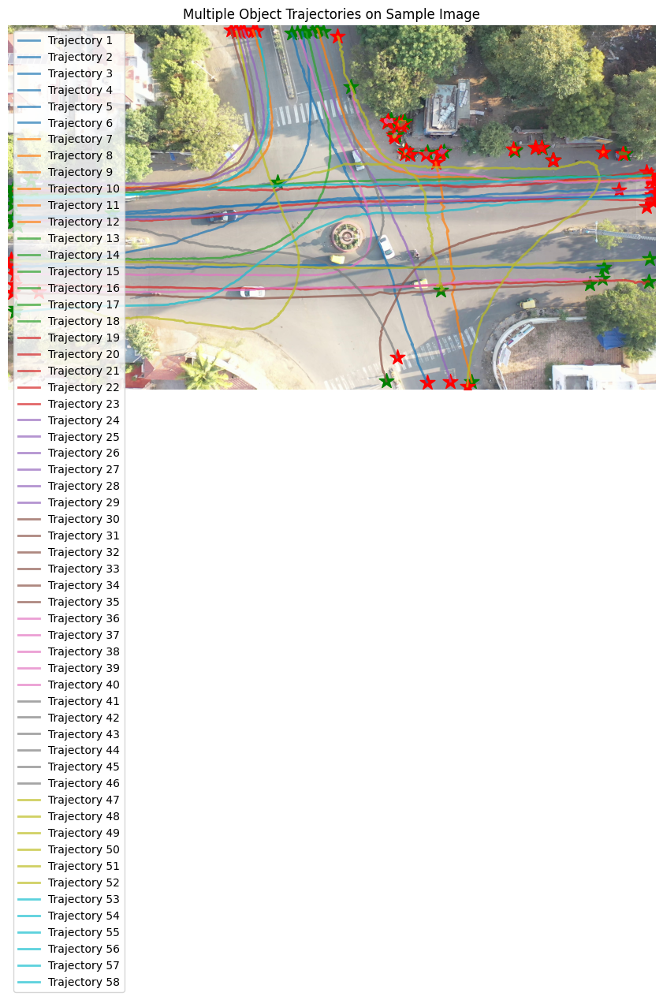

In [32]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the text file containing the list of CSV files
txt_file_path = "AbnormalTracks_10.txt"  # Update this if needed
with open(txt_file_path, "r") as file:
    csv_files = [line.strip() for line in file.readlines() if line.strip()]

# Load the background image
image_path = "sample10.jpg"  # Update if needed
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
img_height, img_width, _ = image.shape

# Create a figure for plotting
plt.figure(figsize=(12, 6))
plt.imshow(image)

# Define a list of colors for different trajectories
colors = plt.cm.get_cmap("tab10", len(csv_files))

# Process each CSV file
for idx, file_path in enumerate(csv_files):
    try:
        df = pd.read_csv("10/"+file_path)
        
        # Compute bounding box center
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2

        # Extract coordinates
        center_x = np.clip(df["center_x"].values, 0, img_width - 1)
        center_y = np.clip(df["center_y"].values, 0, img_height - 1)

        # Plot the trajectory
        plt.plot(center_x, center_y, linestyle="-", color=colors(idx), alpha=0.7, linewidth=2, label=f"Trajectory {idx+1}")

        # Mark the start and end points
        plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=200)  # Start
        plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=200)  # End

    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Customize and show plot
plt.title("Multiple Object Trajectories on Sample Image")
plt.axis("off")  # Hide axes
plt.legend()
plt.show()


C:\Users\abhis\AppData\Local\Temp\ipykernel_38268\277839729.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(csv_files))


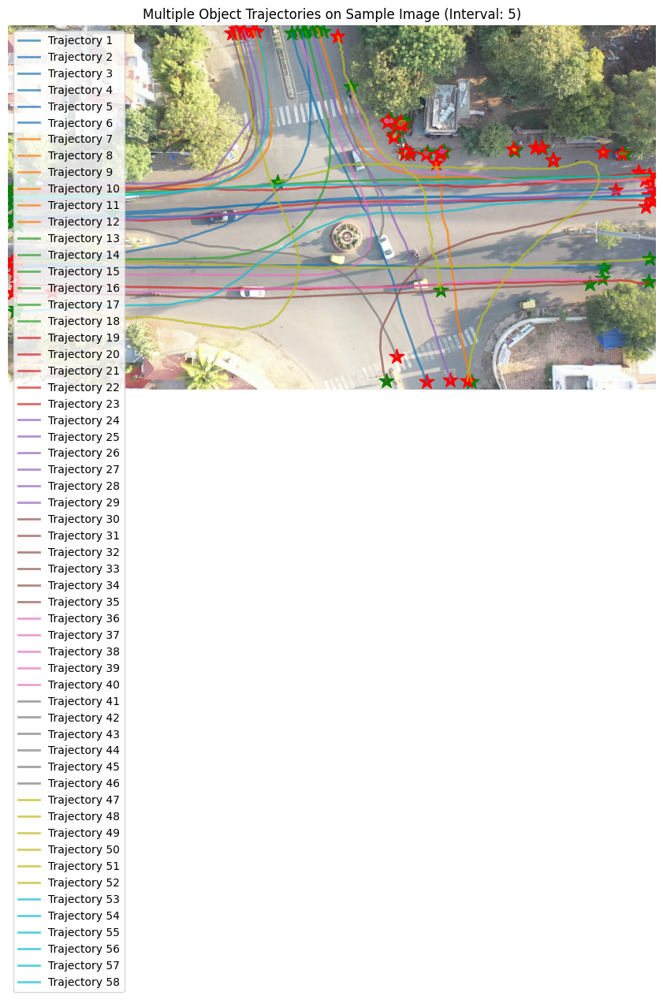

In [33]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the text file containing the list of CSV files
txt_file_path = "AbnormalTracks_10.txt"  # Update if needed
with open(txt_file_path, "r") as file:
    csv_files = [line.strip() for line in file.readlines() if line.strip()]

# Load the background image
image_path = "sample10.jpg"  # Update if needed
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
img_height, img_width, _ = image.shape

# Create a figure for plotting
plt.figure(figsize=(12, 6))
plt.imshow(image)

# Define a colormap for different trajectories
colors = plt.cm.get_cmap("tab10", len(csv_files))

# Process each CSV file
for idx, file_path in enumerate(csv_files):
    try:
        df = pd.read_csv("10/"+file_path)

        # Compute bounding box center
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2

        # Extract coordinates with interval of 5
        center_x = np.clip(df["center_x"].values[::5], 0, img_width - 1)
        center_y = np.clip(df["center_y"].values[::5], 0, img_height - 1)

        # Plot the trajectory with interval
        plt.plot(center_x, center_y, linestyle="-", color=colors(idx), alpha=0.7, linewidth=2, label=f"Trajectory {idx+1}")

        # Mark the start and end points
        plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=200)  # Start
        plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=200)  # End

    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Customize and show plot
plt.title("Multiple Object Trajectories on Sample Image (Interval: 5)")
plt.axis("off")  # Hide axes
plt.legend()
plt.show()


C:\Users\abhis\AppData\Local\Temp\ipykernel_38268\1010025742.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(csv_files))


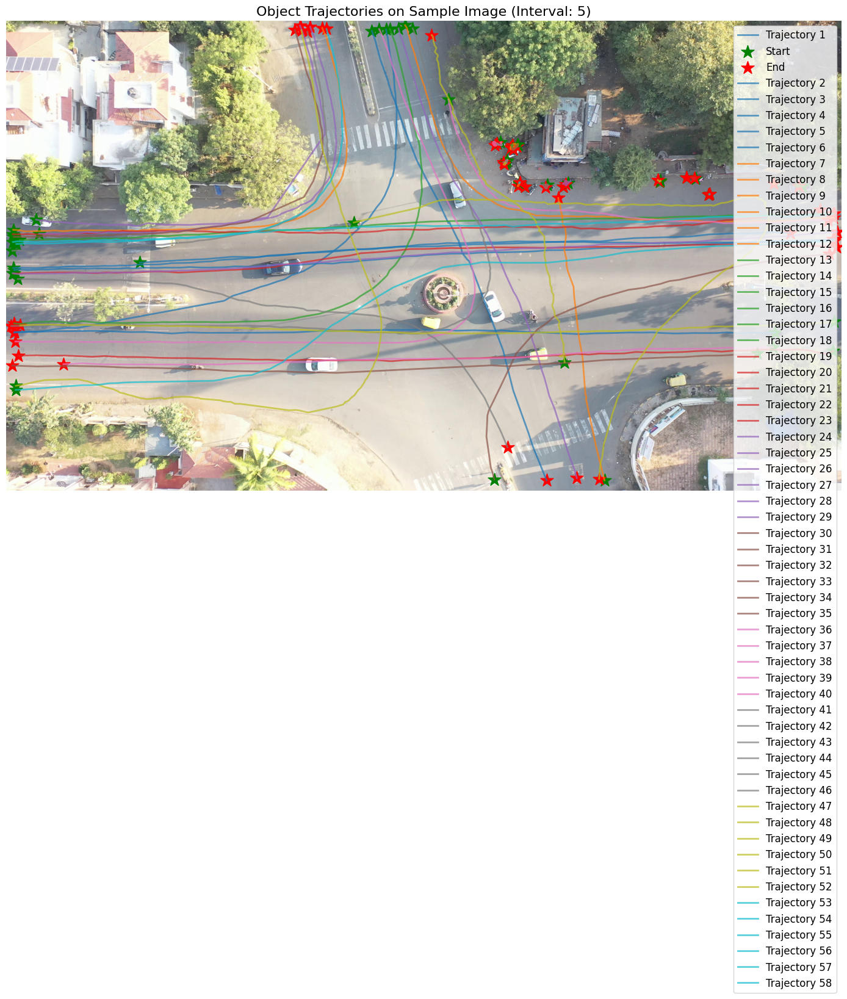

In [ ]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the text file containing the list of CSV files
txt_file_path = "AbnormalTracks_10.txt"  # Update if needed
with open(txt_file_path, "r") as file:
    csv_files = [line.strip() for line in file.readlines() if line.strip()]

# Load the background image
image_path = "sample10.jpg"  # Update if needed
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
img_height, img_width, _ = image.shape

# Set up the figure
plt.figure(figsize=(18, 10))
plt.imshow(image)

# Define a colormap for different trajectories
colors = plt.cm.get_cmap("tab10", len(csv_files))

# Process each CSV file
for idx, file_path in enumerate(csv_files):
    try:
        df = pd.read_csv("10/"+file_path)

        # Compute bounding box center
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2

        # Extract coordinates with interval of 5 frames
        center_x = np.clip(df["center_x"].values[::5], 0, img_width - 1)
        center_y = np.clip(df["center_y"].values[::5], 0, img_height - 1)

        # Plot trajectory with spaced points
        plt.plot(center_x, center_y, linestyle="-", color=colors(idx), alpha=0.7, linewidth=2, label=f"Trajectory {idx+1}")

        # Mark start & end points with larger markers for visibility
        plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=250, label="Start" if idx == 0 else "")
        plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=250, label="End" if idx == 0 else "")

    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Customize and show plot
plt.title("Object Trajectories on Sample Image (Interval: 5)", fontsize=16)
plt.axis("off")  # Hide axes for a clean image overlay
plt.legend(loc="upper right", fontsize=12)
plt.show()


C:\Users\abhis\AppData\Local\Temp\ipykernel_6684\1357464164.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)  # 10 distinct colors


beach_files: ['768_.csv', '225_.csv', '332_340_350_388_389_402_410_467_481_515_542_.csv', '7_37_72_128_.csv', '436_.csv']
beach_files: ['241_281_375_385_.csv', '22_36_54_142_152_164_192_257_258_276_282_301_334_416_455_487_508_588_597_645_745_811_853_882_916_.csv', '894_923_931_962_.csv', '341_501_.csv', '514_549_568_621_704_718_799_820_836_868_878_889_897_899_921_932_946_954_959_.csv']


KeyboardInterrupt: 

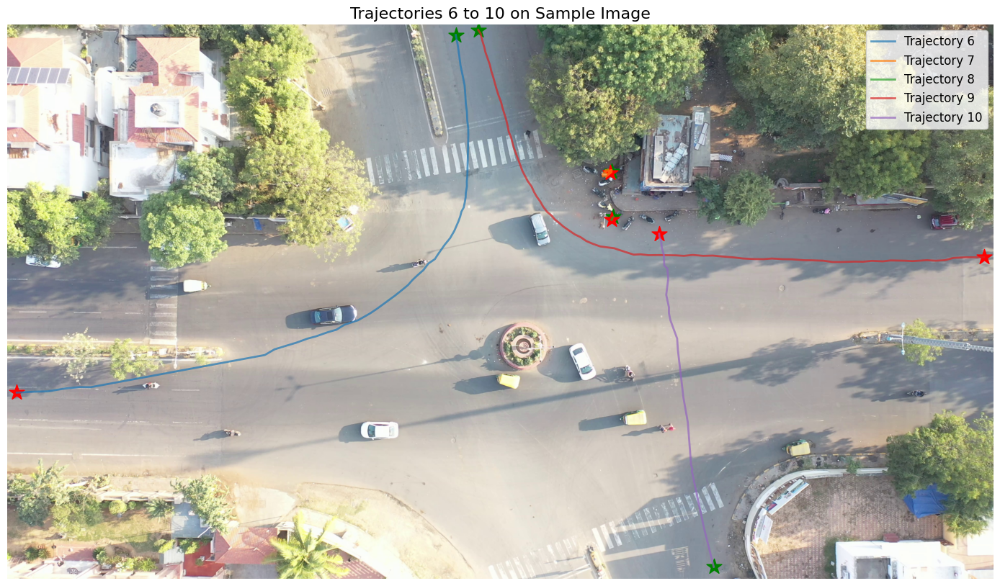

In [1]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Read the text file containing the list of CSV files
txt_file_path = "AbnormalTracks_10.txt"  # Update if needed
with open(txt_file_path, "r") as file:
    csv_files = [line.strip() for line in file.readlines() if line.strip()]

# Load the background image
image_path = "sample10.jpg"  # Update if needed
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
img_height, img_width, _ = image.shape

# Output directory for saving images
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

# Define a colormap for different trajectories
colors = plt.cm.get_cmap("tab10", 10)  # 10 distinct colors

# Process CSV files in groups of 5
for i in range(0, len(csv_files), 5):
    batch_files = csv_files[i:i+5]  # Take 5 files at a time
    plt.figure(figsize=(18, 10))
    plt.imshow(image)

    # Process each trajectory in the batch
    print(f"beach_files: {batch_files}")
    for idx, file_path in enumerate(batch_files):
        try:
            df = pd.read_csv("10/"+file_path)

            # Compute bounding box center
            df["center_x"] = df["left"] + df["w"] / 2
            df["center_y"] = df["top"] + df["h"] / 2

            # Extract coordinates with interval of 5 frames
            center_x = np.clip(df["center_x"].values[::5], 0, img_width - 1)
            center_y = np.clip(df["center_y"].values[::5], 0, img_height - 1)

            # Plot trajectory
            plt.plot(center_x, center_y, linestyle="-", color=colors(idx), alpha=0.7, linewidth=2, label=f"Trajectory {i+idx+1}")

            # Mark start & end points
            plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=250)  # Start
            plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=250)  # End

        except Exception as e:
            print(f"Error processing {file_path}: {e}")

    # Customize and save the plot
    plt.title(f"Trajectories {i+1} to {i+5} on Sample Image", fontsize=16)
    plt.axis("off")
    plt.legend(loc="upper right", fontsize=12)

    output_path = os.path.join(output_dir, f"trajectory_batch_{i//5 + 1}.png")
    plt.savefig(output_path, dpi=300)
    plt.close()

print(f"Images saved in '{output_dir}' directory.")


In [3]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# List of samples to process
samples = ["10", "11", "12"]  # Dataset folders

# Output directory for saving images
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

# Define a colormap for different trajectories
colors = plt.cm.get_cmap("tab10", 10)  # 10 distinct colors

# Process each sample
for sample in samples:
    txt_file_path = f"AbnormalTracks_{sample}.txt"  # Text file containing CSV filenames
    image_path = f"sample{sample}.jpg"  # Corresponding background image
    base_dir = sample  # Base directory containing CSV files
    
    # Read the text file containing the list of abnormal trajectory CSV files
    with open(txt_file_path, "r") as file:
        abnormal_files = [line.strip() for line in file.readlines() if line.strip()]
        abnormal_files_name=[]
        for f in abnormal_files:
            file_name_split=f.split(".")
            abnormal_files_name.append(file_name_split[0])
    
    # Load the background image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found. Skipping sample {sample}.")
        continue
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
    img_height, img_width, _ = image.shape
    
    # Get all CSV files in the folder
    all_csv_files = set(os.listdir(base_dir))
    
    # Filter only the abnormal files that exist in the directory
    valid_abnormal_files = []
    for i in range(len(abnormal_files_name)):
        for csv_file_name in all_csv_files:
            if abnormal_files_name[i] in csv_file_name:
                valid_abnormal_files.append(csv_file_name)
                break
    
    # Check if any valid abnormal files were found
    if not valid_abnormal_files:
        print(f"No valid abnormal trajectories found for sample {sample}.")
        continue
    else:
        print(f"Processing {len(valid_abnormal_files)} abnormal trajectories for sample {sample}...")
    
    
    # Process CSV files in groups of 5
    for i in range(0, len(valid_abnormal_files), 5):
        batch_files = valid_abnormal_files[i:i+5]  # Take 5 files at a time
        plt.figure(figsize=(18, 10))
        plt.imshow(image)
    
        # Process each trajectory in the batch
        for idx, file_path in enumerate(batch_files):
            try:
                df = pd.read_csv(os.path.join(base_dir, file_path))

                # Compute bounding box center
                df["center_x"] = df["left"] + df["w"] / 2
                df["center_y"] = df["top"] + df["h"] / 2

                # Extract coordinates with interval of 5 frames
                center_x = np.clip(df["center_x"].values[::5], 0, img_width - 1)
                center_y = np.clip(df["center_y"].values[::5], 0, img_height - 1)

                # Plot trajectory
                plt.plot(center_x, center_y, linestyle="-", color=colors(idx % 10), alpha=0.7, linewidth=2, label=f"Trajectory {file_path}")

                # Mark start & end points
                plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=250)  # Start
                plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=250)  # End

            except Exception as e:
                print(f"Error processing {file_path} for sample {sample}: {e}")
    
        # Customize and save the plot
        plt.title(f"Sample {sample} - Trajectories {i+1} to {i+5} on Sample Image", fontsize=16)
        plt.axis("off")
        plt.legend(loc="upper right", fontsize=12)
    
        output_path = os.path.join(output_dir, f"sample{sample}_batch_{i//5 + 1}.png")
        plt.savefig(output_path, dpi=300)
        plt.close()
        print(f"Saved: {output_path}")

print(f"Images saved in '{output_dir}' directory.")


C:\Users\abhis\AppData\Local\Temp\ipykernel_36424\3887606290.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)  # 10 distinct colors


Processing 58 abnormal trajectories for sample 10...
Saved: trajectory_images\sample10_batch_1.png
Saved: trajectory_images\sample10_batch_2.png
Saved: trajectory_images\sample10_batch_3.png
Saved: trajectory_images\sample10_batch_4.png
Saved: trajectory_images\sample10_batch_5.png
Saved: trajectory_images\sample10_batch_6.png
Saved: trajectory_images\sample10_batch_7.png
Saved: trajectory_images\sample10_batch_8.png
Saved: trajectory_images\sample10_batch_9.png
Saved: trajectory_images\sample10_batch_10.png
Saved: trajectory_images\sample10_batch_11.png
Saved: trajectory_images\sample10_batch_12.png
Processing 103 abnormal trajectories for sample 11...
Saved: trajectory_images\sample11_batch_1.png
Saved: trajectory_images\sample11_batch_2.png
Saved: trajectory_images\sample11_batch_3.png
Saved: trajectory_images\sample11_batch_4.png
Saved: trajectory_images\sample11_batch_5.png
Saved: trajectory_images\sample11_batch_6.png
Saved: trajectory_images\sample11_batch_7.png
Saved: trajector

In [5]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# List of samples to process
samples = ["10", "11", "12"]  # Dataset folders

# Output directory for saving images and CSV files
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

# Define a colormap for different trajectories
colors = plt.cm.get_cmap("tab10", 10)  # 10 distinct colors

# Process each sample
for sample in samples:
    txt_file_path = f"AbnormalTracks_{sample}.txt"  # Text file containing CSV filenames for abnormal trajectories
    image_path = f"sample{sample}.jpg"  # Corresponding background image
    base_dir = sample  # Base directory containing CSV files
    
    # Read the text file containing the list of abnormal trajectory CSV files
    with open(txt_file_path, "r") as file:
        abnormal_files = [line.strip() for line in file.readlines() if line.strip()]
        abnormal_files_name = []
        for f in abnormal_files:
            file_name_split = f.split(".")
            abnormal_files_name.append(file_name_split[0])
    
    # Load the background image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found. Skipping sample {sample}.")
        continue
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
    img_height, img_width, _ = image.shape
    
    # Get all CSV files in the folder
    all_csv_files = set(os.listdir(base_dir))
    
    # Filter only the abnormal files that exist in the directory
    valid_abnormal_files = []
    for name in abnormal_files_name:
        for csv_file_name in all_csv_files:
            if name in csv_file_name:
                valid_abnormal_files.append(csv_file_name)
                break
    
    # Identify normal files as those CSVs that are not marked as abnormal
    valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]
    
    # Create a CSV file with trajectory labels:
    # Label 1 for normal trajectories, Label 2 for abnormal trajectories
    data = []
    for f in valid_normal_files:
        data.append({"filename": os.path.join(base_dir, f), "label": 0})
    for f in valid_abnormal_files:
        data.append({"filename": os.path.join(base_dir, f), "label": 1})
    
    labels_df = pd.DataFrame(data)
    labels_csv_path = os.path.join(output_dir, f"sample{sample}_labels.csv")
    labels_df.to_csv(labels_csv_path, index=False)
    print(f"Labels CSV saved: {labels_csv_path}")
    
    # Check if any valid abnormal files were found for plotting trajectories
    if not valid_abnormal_files:
        print(f"No valid abnormal trajectories found for sample {sample}.")
        continue
    else:
        print(f"Processing {len(valid_abnormal_files)} abnormal trajectories for sample {sample}...")
    
    # Process CSV files in groups of 5 for plotting
    for i in range(0, len(valid_abnormal_files), 5):
        batch_files = valid_abnormal_files[i:i+5]  # Take 5 files at a time
        plt.figure(figsize=(18, 10))
        plt.imshow(image)
    
        # Process each trajectory in the batch
        for idx, file_path in enumerate(batch_files):
            try:
                df = pd.read_csv(os.path.join(base_dir, file_path))
    
                # Compute bounding box center
                df["center_x"] = df["left"] + df["w"] / 2
                df["center_y"] = df["top"] + df["h"] / 2
    
                # Extract coordinates with interval of 5 frames
                center_x = np.clip(df["center_x"].values[::5], 0, img_width - 1)
                center_y = np.clip(df["center_y"].values[::5], 0, img_height - 1)
    
                # Plot trajectory
                plt.plot(center_x, center_y, linestyle="-", color=colors(idx % 10), alpha=0.7, linewidth=2, label=f"Trajectory {file_path}")
    
                # Mark start & end points
                plt.scatter(center_x[0], center_y[0], color="green", marker="*", s=250)  # Start
                plt.scatter(center_x[-1], center_y[-1], color="red", marker="*", s=250)  # End
    
            except Exception as e:
                print(f"Error processing {file_path} for sample {sample}: {e}")
    
        # Customize and save the plot
        plt.title(f"Sample {sample} - Trajectories {i+1} to {i+5} on Sample Image", fontsize=16)
        plt.axis("off")
        plt.legend(loc="upper right", fontsize=12)
    
        output_path = os.path.join(output_dir, f"sample{sample}_batch_{i//5 + 1}.png")
        plt.savefig(output_path, dpi=300)
        plt.close()
        print(f"Saved: {output_path}")

print(f"Images and label CSV files saved in '{output_dir}' directory.")


C:\Users\abhis\AppData\Local\Temp\ipykernel_36424\780274032.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)  # 10 distinct colors


Labels CSV saved: trajectory_images\sample10_labels.csv
Processing 58 abnormal trajectories for sample 10...
Saved: trajectory_images\sample10_batch_1.png
Saved: trajectory_images\sample10_batch_2.png
Saved: trajectory_images\sample10_batch_3.png
Saved: trajectory_images\sample10_batch_4.png
Saved: trajectory_images\sample10_batch_5.png
Saved: trajectory_images\sample10_batch_6.png
Saved: trajectory_images\sample10_batch_7.png
Saved: trajectory_images\sample10_batch_8.png
Saved: trajectory_images\sample10_batch_9.png
Saved: trajectory_images\sample10_batch_10.png
Saved: trajectory_images\sample10_batch_11.png
Saved: trajectory_images\sample10_batch_12.png
Labels CSV saved: trajectory_images\sample11_labels.csv
Processing 103 abnormal trajectories for sample 11...
Saved: trajectory_images\sample11_batch_1.png
Saved: trajectory_images\sample11_batch_2.png
Saved: trajectory_images\sample11_batch_3.png
Saved: trajectory_images\sample11_batch_4.png
Saved: trajectory_images\sample11_batch_5.

In [ ]:
import os
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

##############################################################################
# 1. COMBINE THE THREE LABEL CSV FILES INTO ONE
##############################################################################
# Suppose each label CSV has lines like:
# 10\96_.csv,0
# 10\99_.csv,0
# 10\768_.csv,1
# etc.

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

# Read each with no header, specifying column names
df_10 = pd.read_csv(label_file_10, header=None, names=["filename", "label"])
df_11 = pd.read_csv(label_file_11, header=None, names=["filename", "label"])
df_12 = pd.read_csv(label_file_12, header=None, names=["filename", "label"])

# Concatenate them
combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)

# Optional: unify backslashes to forward slashes for easier path matching
combined_labels["filename"] = combined_labels["filename"].str.replace("\\", "/")

# Save as a single CSV file
combined_labels_file = "trajectory_images/combined_labels.csv"
combined_labels.to_csv(combined_labels_file, index=False)
print(f"Combined labels saved as '{combined_labels_file}'.")

##############################################################################
# 2. EXTRACT FEATURES FROM ALL TRAJECTORY CSV FILES (FOLDERS 10, 11, 12)
##############################################################################

def extract_track_features(csv_file_path):
    """
    Reads a CSV with columns: frameNo, left, top, w, h
    and extracts bounding-box-based features for clustering.
    """
    df = pd.read_csv(csv_file_path)
    
    # 1) Track length (number of frames)
    track_length = len(df)
    
    # 2) Bounding box center
    center_x = df['left'] + df['w'] / 2
    center_y = df['top'] + df['h'] / 2
    
    # 3) Mean bounding box center
    mean_center_x = center_x.mean()
    mean_center_y = center_y.mean()
    
    # 4) Mean bounding box area
    areas = df['w'] * df['h']
    mean_area = areas.mean()
    
    # 5) Mean velocity in x, y (from consecutive centers)
    dx = center_x.diff().fillna(0)
    dy = center_y.diff().fillna(0)
    mean_vel_x = dx.mean()
    mean_vel_y = dy.mean()
    
    return {
        'track_length': track_length,
        'mean_center_x': mean_center_x,
        'mean_center_y': mean_center_y,
        'mean_area': mean_area,
        'mean_vel_x': mean_vel_x,
        'mean_vel_y': mean_vel_y
    }

# We assume you have 3 folders named "10", "11", and "12", each with CSV tracks
base_dirs = ["10", "11", "12"]
all_features = []

for base_dir in base_dirs:
    for filename in os.listdir(base_dir):
        if filename.endswith(".csv"):
            csv_path = os.path.join(base_dir, filename)
            # Extract features
            feats = extract_track_features(csv_path)
            # Keep track of the filename path in a consistent format (forward slashes)
            feats['filename'] = csv_path.replace("\\", "/")
            all_features.append(feats)

df_features = pd.DataFrame(all_features)
print("\nFirst few rows of extracted features:")
print(df_features.head())

##############################################################################
# 3. MERGE EXTRACTED FEATURES WITH THE COMBINED LABELS
##############################################################################

labels_df = pd.read_csv(combined_labels_file)
# If your combined_labels.csv has columns ["filename","label"] with 0 or 1,
# we can directly merge on 'filename'.

df_merged = pd.merge(df_features, labels_df, on="filename", how="left")

# If you previously had labels (1,2) and want to map them to (0,1), do:
# df_merged['label'] = df_merged['label'].replace({1:0, 2:1})

print("\nMerged DataFrame (features + labels):")
print(df_merged.head())

##############################################################################
# 4. PERFORM CLUSTERING WITH KMEANS
##############################################################################

# Numeric columns to cluster on
feature_cols = [
    'track_length',
    'mean_center_x',
    'mean_center_y',
    'mean_area',
    'mean_vel_x',
    'mean_vel_y'
]

# Drop rows with missing feature values
df_merged.dropna(subset=feature_cols, inplace=True)

# Extract feature matrix
X = df_merged[feature_cols].values

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# KMeans with 5 clusters (arbitrary choice)
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(X_scaled)
df_merged['cluster'] = kmeans.labels_

print("\nCluster assignments (first 20 tracks):")
print(df_merged[['filename', 'label', 'cluster']].head(20))

##############################################################################
# 5. VISUALIZE WITH PCA
##############################################################################

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Plot cluster assignments in PCA space
plt.figure(figsize=(8,6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1],
                      c=df_merged['cluster'], cmap='tab10', alpha=0.7)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('KMeans Clusters (visualized by PCA)')
plt.colorbar(scatter, label='Cluster')
plt.show()

# Plot by label (0=Normal, 1=Abnormal)
# If your data has 0/1, we can map 0->green, 1->red:
label_colors = df_merged['label'].map({0:'green', 1:'red', np.nan:'gray'})
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1],
            c=label_colors, alpha=0.7)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Tracks Colored by Normal(0)/Abnormal(1) Label')
plt.show()

print("\nDone. Combined labels in 'trajectory_images/combined_labels.csv'.")
print("Clustering completed and visualizations displayed.")


FileNotFoundError: [Errno 2] No such file or directory: 'trajectory_images/sample10_labels.csv'

Combined labels saved as 'trajectory_images/combined_labels.csv'.

Sample of extracted features:
   track_length  mean_center_x  mean_center_y    mean_area  mean_vel_x  \
0           147    2707.768707    1428.540816  1996.530612   10.479592   
1             6    2271.000000    2043.250000  1067.333333   -0.166667   
2            34     269.573529    1399.764706  2649.294118  -15.411765   
3            81    2029.302469     530.012346  1296.172840    5.586420   
4           685    2917.927737    1061.864234  2701.432117    1.644526   

   mean_vel_y                          filename  
0   -7.040816           10\106_123_183_207_.csv  
1   -0.333333                       10\108_.csv  
2   -0.250000                        10\10_.csv  
3   16.722222           10\114_157_223_238_.csv  
4    1.768613  10\11_77_97_203_226_237_274_.csv  

K-Means Accuracy (majority-vote): 0.716
DBSCAN Accuracy (majority-vote): 0.716
KShape Accuracy (majority-vote): 0.716


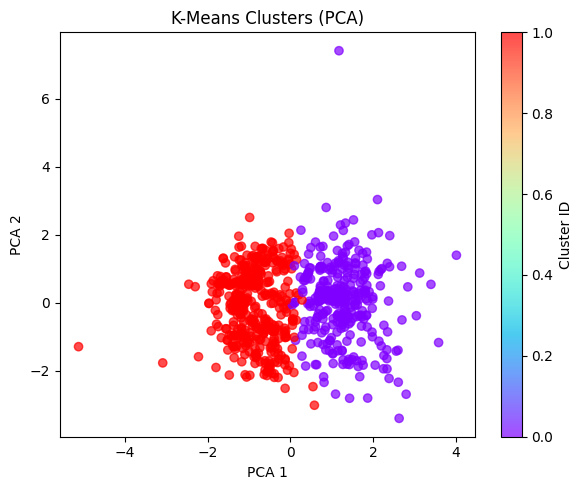

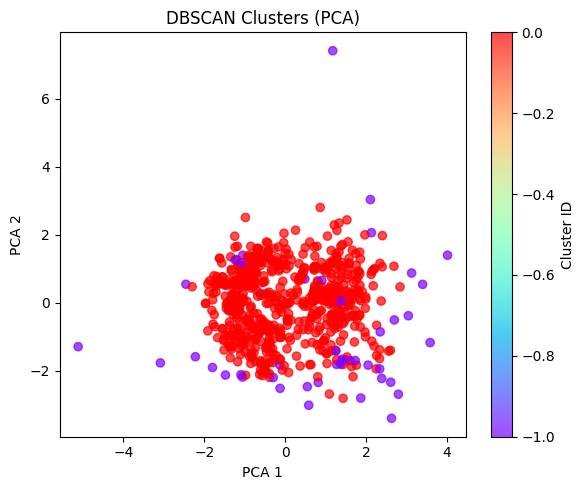

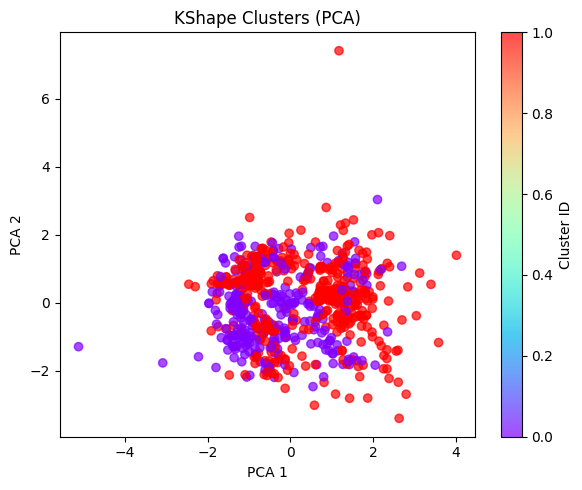


Final Accuracy Results (majority-vote):
  - K-Means: 0.716
  - DBSCAN:  0.716
  - KShape:  0.716

Done.


In [25]:
# import os
# import pandas as pd
# import numpy as np
# import cv2
# import matplotlib.pyplot as plt

# from sklearn.cluster import KMeans, DBSCAN
# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA

# # KShape is part of the tslearn library
# # pip install tslearn
# from tslearn.clustering import KShape

# ##############################################################################
# # 1. COMBINE THE THREE LABEL CSV FILES INTO ONE
# ##############################################################################

# # If you already have them combined, you can skip this step. Otherwise:
# label_file_10 = "trajectory_images/sample10_labels.csv"
# label_file_11 = "trajectory_images/sample11_labels.csv"
# label_file_12 = "trajectory_images/sample12_labels.csv"

# df_10 = pd.read_csv(label_file_10)
# df_11 = pd.read_csv(label_file_11)
# df_12 = pd.read_csv(label_file_12)

# combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
# combined_labels_file = "trajectory_images/combined_labels.csv"
# combined_labels.to_csv(combined_labels_file, index=False)
# print(f"Combined labels saved as '{combined_labels_file}'.")

# ##############################################################################
# # 2. EXTRACT FEATURES FROM ALL TRAJECTORY CSV FILES (FOLDERS 10, 11, 12)
# ##############################################################################

# def extract_track_features(csv_file_path):
#     """
#     Given a CSV with columns: frameNo, left, top, w, h,
#     extract some basic features for clustering.
#     """
#     df = pd.read_csv(csv_file_path)
    
#     # 1) Track length (number of frames)
#     track_length = len(df)
    
#     # 2) Bounding box center
#     center_x = df['left'] + df['w'] / 2
#     center_y = df['top'] + df['h'] / 2
    
#     # 3) Mean bounding box center
#     mean_center_x = center_x.mean()
#     mean_center_y = center_y.mean()
    
#     # 4) Mean bounding box area
#     areas = df['w'] * df['h']
#     mean_area = areas.mean()
    
#     # 5) Mean velocity in x, y (approx from consecutive frames)
#     dx = center_x.diff().fillna(0)
#     dy = center_y.diff().fillna(0)
#     mean_vel_x = dx.mean()
#     mean_vel_y = dy.mean()
    
#     return {
#         'track_length': track_length,
#         'mean_center_x': mean_center_x,
#         'mean_center_y': mean_center_y,
#         'mean_area': mean_area,
#         'mean_vel_x': mean_vel_x,
#         'mean_vel_y': mean_vel_y
#     }

# base_dirs = ["10", "11", "12"]
# all_features = []

# for base_dir in base_dirs:
#     for filename in os.listdir(base_dir):
#         if filename.endswith(".csv"):
#             csv_path = os.path.join(base_dir, filename)
#             feats = extract_track_features(csv_path)
#             feats['filename'] = csv_path  # keep track of which file
#             all_features.append(feats)

# df_features = pd.DataFrame(all_features)
# print("\nSample of extracted features:")
# print(df_features.head())

# ##############################################################################
# # 3. MERGE EXTRACTED FEATURES WITH COMBINED LABELS
# ##############################################################################

# labels_df = pd.read_csv(combined_labels_file)
# df_merged = pd.merge(df_features, labels_df, on="filename", how="left")

# # Filter out rows with missing features
# feature_cols = [
#     'track_length',
#     'mean_center_x',
#     'mean_center_y',
#     'mean_area',
#     'mean_vel_x',
#     'mean_vel_y'
# ]
# df_merged.dropna(subset=feature_cols, inplace=True)

# # Also drop any rows that don't have a label (if that occurs)
# df_merged.dropna(subset=["label"], inplace=True)

# # Convert label to integer if it's not already
# df_merged['label'] = df_merged['label'].astype(int)

# X = df_merged[feature_cols].values
# y_true = df_merged['label'].values  # 1=normal, 2=abnormal

# # Scale features
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# ##############################################################################
# # 4. DEFINE A HELPER FUNCTION TO CALCULATE "CLUSTER ACCURACY"
# ##############################################################################

# def cluster_accuracy(true_labels, cluster_labels):
#     """
#     Map each cluster to the majority label within that cluster,
#     then compute the fraction of correctly assigned samples.
    
#     - true_labels: ground truth label (1 or 2 in your case)
#     - cluster_labels: the cluster ID assigned by the algorithm
#       (e.g. 0,1,2... or -1 for noise in DBSCAN)
#     """
#     unique_clusters = np.unique(cluster_labels)
#     total = len(true_labels)
#     correct = 0
    
#     for c in unique_clusters:
#         # Indices of items in cluster c
#         idx = np.where(cluster_labels == c)[0]
#         if len(idx) == 0:
#             continue
#         # Majority label in this cluster
#         majority_label = np.bincount(true_labels[idx]).argmax()
#         # Count how many in 'idx' match this majority label
#         correct += np.sum(true_labels[idx] == majority_label)
    
#     accuracy = correct / total
#     return accuracy

# ##############################################################################
# # 5. K-MEANS CLUSTERING & ACCURACY
# ##############################################################################

# kmeans = KMeans(n_clusters=2, random_state=42)  # 2 clusters, assuming normal vs. abnormal
# kmeans.fit(X_scaled)
# kmeans_labels = kmeans.labels_

# acc_kmeans = cluster_accuracy(y_true, kmeans_labels)
# print(f"\nK-Means Accuracy (majority-vote approach): {acc_kmeans:.3f}")

# ##############################################################################
# # 6. DBSCAN CLUSTERING & ACCURACY
# ##############################################################################

# # You need to tune eps, min_samples for your dataset
# dbscan = DBSCAN(eps=1.5, min_samples=5)
# dbscan.fit(X_scaled)
# dbscan_labels = dbscan.labels_  # -1 means "noise" or outlier

# acc_dbscan = cluster_accuracy(y_true, dbscan_labels)
# print(f"DBSCAN Accuracy (majority-vote approach): {acc_dbscan:.3f}")

# ##############################################################################
# # 7. KSHAPE CLUSTERING & ACCURACY (from tslearn)
# ##############################################################################
# # KShape is designed for time-series data of equal length. We are using
# # "feature vectors" here, which is not the typical usage for KShape.
# # However, for demonstration, we can treat each row as a 1D "time series"
# # of length = number of features. We'll do a naive approach:
# # We reshape X_scaled into (n_samples, n_timestamps) and feed it to KShape.
# # In reality, you might want to use the *raw bounding box sequence* data.

# # For KShape, we need a 3D array: (n_samples, n_timestamps, 1).
# # We'll treat each feature vector as a "time series" of length feature_cols.
# X_kshape = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

# # We'll cluster into 2 clusters as well
# kshape = KShape(n_clusters=2, n_init=1, verbose=False, random_state=42)
# kshape.fit(X_kshape)
# kshape_labels = kshape.labels_

# acc_kshape = cluster_accuracy(y_true, kshape_labels)
# print(f"KShape Accuracy (majority-vote approach): {acc_kshape:.3f}")

# ##############################################################################
# # 8. OPTIONAL: VISUALIZE WITH PCA
# ##############################################################################

# from sklearn.decomposition import PCA

# pca = PCA(n_components=2, random_state=42)
# X_pca = pca.fit_transform(X_scaled)

# def plot_clusters(X_2d, cluster_labels, title):
#     plt.figure(figsize=(6, 5))
#     scatter = plt.scatter(X_2d[:, 0], X_2d[:, 1],
#                           c=cluster_labels, cmap='rainbow', alpha=0.7)
#     plt.colorbar(scatter, label='Cluster ID')
#     plt.title(title)
#     plt.xlabel('PCA 1')
#     plt.ylabel('PCA 2')
#     plt.tight_layout()
#     plt.show()

# # Plot K-Means
# plot_clusters(X_pca, kmeans_labels, "K-Means Clusters (PCA)")

# # Plot DBSCAN
# plot_clusters(X_pca, dbscan_labels, "DBSCAN Clusters (PCA)")

# # Plot KShape
# plot_clusters(X_pca, kshape_labels, "KShape Clusters (PCA)")

# ##############################################################################
# # 9. PRINT FINAL RESULTS
# ##############################################################################

# print("\nFinal Accuracy Results:")
# print(f"  - K-Means: {acc_kmeans:.3f}")
# print(f"  - DBSCAN: {acc_dbscan:.3f}")
# print(f"  - KShape: {acc_kshape:.3f}")

# print("\nDone.")


import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from tslearn.clustering import KShape

##############################################################################
# 1. COMBINE THE THREE LABEL CSV FILES INTO ONE (0=Normal, 1=Abnormal)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

# Concatenate them into one DataFrame
combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)

# If your label files already have "0" and "1", no need to replace anything.
# But if you had old labels (1,2) => we can map them to (0,1):
# combined_labels['label'] = combined_labels['label'].replace({1:0, 2:1})

combined_labels_file = "trajectory_images/combined_labels.csv"
combined_labels.to_csv(combined_labels_file, index=False)
print(f"Combined labels saved as '{combined_labels_file}'.")

##############################################################################
# 2. EXTRACT FEATURES FROM ALL TRAJECTORY CSV FILES (FOLDERS 10, 11, 12)
##############################################################################

def extract_track_features(csv_file_path):
    """
    Reads a CSV with columns: frameNo, left, top, w, h
    and extracts bounding-box-based features for clustering.
    """
    df = pd.read_csv(csv_file_path)
    
    # 1) Track length (number of frames)
    track_length = len(df)
    
    # 2) Bounding box center
    center_x = df['left'] + df['w'] / 2
    center_y = df['top'] + df['h'] / 2
    
    # 3) Mean bounding box center
    mean_center_x = center_x.mean()
    mean_center_y = center_y.mean()
    
    # 4) Mean bounding box area
    areas = df['w'] * df['h']
    mean_area = areas.mean()
    
    # 5) Mean velocity in x, y (from consecutive centers)
    dx = center_x.diff().fillna(0)
    dy = center_y.diff().fillna(0)
    mean_vel_x = dx.mean()
    mean_vel_y = dy.mean()
    
    return {
        'track_length': track_length,
        'mean_center_x': mean_center_x,
        'mean_center_y': mean_center_y,
        'mean_area': mean_area,
        'mean_vel_x': mean_vel_x,
        'mean_vel_y': mean_vel_y
    }

# Directories containing your CSV files
base_dirs = ["10", "11", "12"]
all_features = []

for base_dir in base_dirs:
    for filename in os.listdir(base_dir):
        if filename.endswith(".csv"):
            csv_path = os.path.join(base_dir, filename)
            feats = extract_track_features(csv_path)
            feats['filename'] = csv_path  # keep track of which file
            all_features.append(feats)

df_features = pd.DataFrame(all_features)
print("\nSample of extracted features:")
print(df_features.head())

##############################################################################
# 3. MERGE EXTRACTED FEATURES WITH COMBINED LABELS
##############################################################################

labels_df = pd.read_csv(combined_labels_file)

df_merged = pd.merge(df_features, labels_df, on="filename", how="left")

# Drop rows missing essential features or labels
feature_cols = [
    'track_length',
    'mean_center_x',
    'mean_center_y',
    'mean_area',
    'mean_vel_x',
    'mean_vel_y'
]
df_merged.dropna(subset=feature_cols, inplace=True)
df_merged.dropna(subset=["label"], inplace=True)

# Ensure label is integer (0 or 1)
df_merged['label'] = df_merged['label'].astype(int)

X = df_merged[feature_cols].values
y_true = df_merged['label'].values  # 0=normal, 1=abnormal

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

##############################################################################
# 4. DEFINE A HELPER FUNCTION TO CALCULATE "CLUSTER ACCURACY"
##############################################################################

def cluster_accuracy(true_labels, cluster_labels):
    """
    Map each cluster to the majority label within that cluster,
    then compute the fraction of correctly assigned samples.

    - true_labels: ground truth label (0 or 1)
    - cluster_labels: cluster ID assigned by the algorithm
    """
    unique_clusters = np.unique(cluster_labels)
    total = len(true_labels)
    correct = 0
    
    for c in unique_clusters:
        idx = np.where(cluster_labels == c)[0]
        if len(idx) == 0:
            continue
        # Majority label in cluster c
        majority_label = np.bincount(true_labels[idx]).argmax()
        correct += np.sum(true_labels[idx] == majority_label)
    
    return correct / total

##############################################################################
# 5. K-MEANS CLUSTERING & ACCURACY
##############################################################################

kmeans = KMeans(n_clusters=2, random_state=42)  # 2 clusters => normal vs. abnormal
kmeans.fit(X_scaled)
kmeans_labels = kmeans.labels_

acc_kmeans = cluster_accuracy(y_true, kmeans_labels)
print(f"\nK-Means Accuracy (majority-vote): {acc_kmeans:.3f}")

##############################################################################
# 6. DBSCAN CLUSTERING & ACCURACY
##############################################################################

# Tune eps, min_samples for your dataset
dbscan = DBSCAN(eps=1.5, min_samples=5)
dbscan.fit(X_scaled)
dbscan_labels = dbscan.labels_  # -1 means outlier/noise

acc_dbscan = cluster_accuracy(y_true, dbscan_labels)
print(f"DBSCAN Accuracy (majority-vote): {acc_dbscan:.3f}")

##############################################################################
# 7. KSHAPE CLUSTERING & ACCURACY (tslearn)
##############################################################################
# KShape is meant for 1D time-series, but we demonstrate a naive approach
# by treating each row's 6 features as a 6-step time-series.

X_kshape = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

kshape = KShape(n_clusters=2, n_init=1, verbose=False, random_state=42)
kshape.fit(X_kshape)
kshape_labels = kshape.labels_

acc_kshape = cluster_accuracy(y_true, kshape_labels)
print(f"KShape Accuracy (majority-vote): {acc_kshape:.3f}")

##############################################################################
# 8. OPTIONAL: VISUALIZE WITH PCA
##############################################################################

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

def plot_clusters(X_2d, cluster_labels, title):
    plt.figure(figsize=(6, 5))
    scatter = plt.scatter(X_2d[:, 0], X_2d[:, 1],
                          c=cluster_labels, cmap='rainbow', alpha=0.7)
    plt.colorbar(scatter, label='Cluster ID')
    plt.title(title)
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.tight_layout()
    plt.show()

# Plot K-Means
plot_clusters(X_pca, kmeans_labels, "K-Means Clusters (PCA)")

# Plot DBSCAN
plot_clusters(X_pca, dbscan_labels, "DBSCAN Clusters (PCA)")

# Plot KShape
plot_clusters(X_pca, kshape_labels, "KShape Clusters (PCA)")

##############################################################################
# 9. PRINT FINAL RESULTS
##############################################################################

print("\nFinal Accuracy Results (majority-vote):")
print(f"  - K-Means: {acc_kmeans:.3f}")
print(f"  - DBSCAN:  {acc_dbscan:.3f}")
print(f"  - KShape:  {acc_kshape:.3f}")

print("\nDone.")


In [27]:
import numpy as np

labels = df_merged['label'].values
unique, counts = np.unique(labels, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Label {u}: {c} samples")
print(f"Proportion of label=1: {counts[0] / sum(counts):.3f}")
print(f"Proportion of label=2: {counts[1] / sum(counts):.3f}")

print("K-Means cluster labels distribution:")
unique, counts = np.unique(kmeans_labels, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  Cluster {u}: {c} samples")

print("DBSCAN cluster labels distribution:")
unique, counts = np.unique(dbscan_labels, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  Cluster {u}: {c} samples")

print("KShape cluster labels distribution:")
unique, counts = np.unique(kshape_labels, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  Cluster {u}: {c} samples")


from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari_kmeans = adjusted_rand_score(y_true, kmeans_labels)
nmi_kmeans = normalized_mutual_info_score(y_true, kmeans_labels)
print(f"K-Means ARI: {ari_kmeans:.3f}, NMI: {nmi_kmeans:.3f}")


Label 0: 581 samples
Label 1: 231 samples
Proportion of label=1: 0.716
Proportion of label=2: 0.284
K-Means cluster labels distribution:
  Cluster 0: 337 samples
  Cluster 1: 475 samples
DBSCAN cluster labels distribution:
  Cluster -1: 46 samples
  Cluster 0: 766 samples
KShape cluster labels distribution:
  Cluster 0: 295 samples
  Cluster 1: 517 samples
K-Means ARI: 0.004, NMI: 0.032


Extracted pixel-based features for 786 tracks.
X shape: (812, 3072) y_true shape: (812,)
K-Means accuracy (pixel-based approach): 0.716
DBSCAN accuracy (pixel-based approach): 0.716


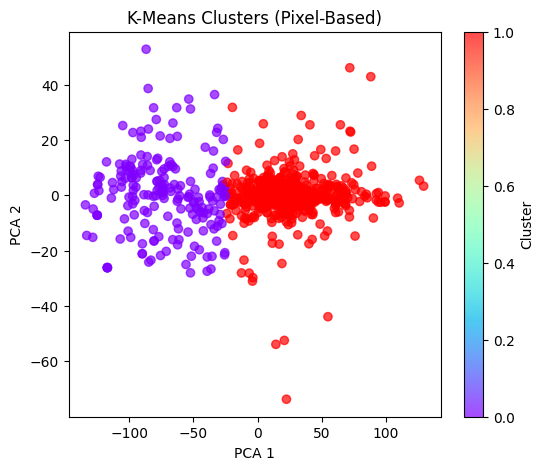

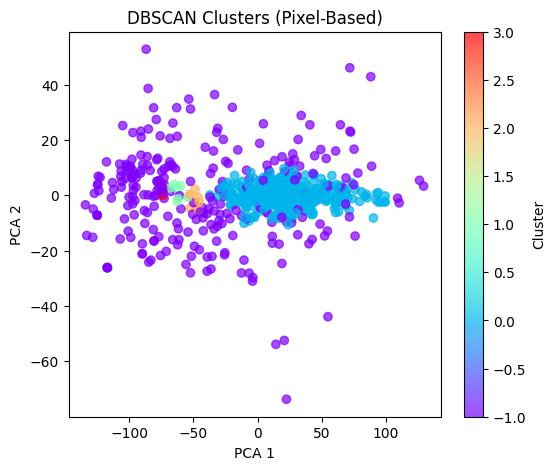

Done.


In [17]:
import os
import pandas as pd
import numpy as np
import cv2
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 1) Folders for each sample and label files
samples = ["10", "11", "12"]
label_files = [
    "trajectory_images/sample10_labels.csv",
    "trajectory_images/sample11_labels.csv",
    "trajectory_images/sample12_labels.csv"
]

# 2) Combine label files if you haven't already
dfs = []
for lf in label_files:
    dfs.append(pd.read_csv(lf))
df_labels = pd.concat(dfs, ignore_index=True)

# 3) A function to extract a single "average patch" for each track
# def extract_pixel_features(csv_file_path, image_path, target_size=(32, 32)):
#     """
#     - csv_file_path: path to the CSV with columns [frameNo, left, top, w, h].
#     - image_path: path to the background image (for demonstration).
#     - target_size: (width, height) to resize each patch.
    
#     Returns: a 1D numpy array of shape (target_size_x * target_size_y * 3,)
#     representing the average patch across all frames for this track.
#     """
#     # Read bounding box CSV
#     df = pd.read_csv(csv_file_path)
    
#     # Load background image
#     image_bgr = cv2.imread(image_path)
#     if image_bgr is None:
#         # If image not found, return None
#         return None
    
#     # Convert to RGB if desired
#     image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    
#     # We'll accumulate all patches, then average them
#     patches = []
    
#     for _, row in df.iterrows():
#         left, top, w, h = int(row["left"]), int(row["top"]), int(row["w"]), int(row["h"])
        
#         # Clip bounding box if it goes outside the image
#         # (Sometimes left+ w might exceed image width, etc.)
#         img_height, img_width, _ = image.shape
#         x1 = max(0, left)
#         y1 = max(0, top)
#         x2 = min(img_width, x1 + w)
#         y2 = min(img_height, y1 + h)
        
#         if x2 <= x1 or y2 <= y1:
#             # Invalid bounding box, skip
#             continue
        
#         # Extract patch
#         patch = image[y1:y2, x1:x2]
        
#         # Resize to target_size
#         patch_resized = cv2.resize(patch, target_size)
        
#         patches.append(patch_resized)
    
#     if len(patches) == 0:
#         # No valid bounding boxes
#         return None
    
#     # Convert to float, average across all frames
#     patches_array = np.array(patches, dtype=np.float32)
#     avg_patch = np.mean(patches_array, axis=0)  # shape = (height, width, 3)
    
#     # Flatten to 1D
#     feature_vector = avg_patch.flatten()
    
#     return feature_vector


def extract_pixel_features_with_smoothing(csv_file_path, image_path, 
                                          box_window=5, patch_method="gaussian", 
                                          patch_ksize=3, target_size=(32, 32)):
    """
    1) Smooth bounding-box coordinates with a rolling window.
    2) For each smoothed bounding box, extract & resize the patch.
    3) Optionally smooth each patch with a Gaussian or median filter.
    4) Average patches across frames and flatten to a feature vector.
    """
    df = pd.read_csv(csv_file_path)
    # Sort by frameNo
    df.sort_values(by="frameNo", inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # Smooth bounding boxes
    df["left"] = df["left"].rolling(window=box_window, center=True, min_periods=1).mean()
    df["top"] = df["top"].rolling(window=box_window, center=True, min_periods=1).mean()
    df["w"] = df["w"].rolling(window=box_window, center=True, min_periods=1).mean()
    df["h"] = df["h"].rolling(window=box_window, center=True, min_periods=1).mean()
    
    # Load image
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        return None
    image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    img_height, img_width, _ = image.shape
    
    patches = []
    for _, row in df.iterrows():
        left = int(row["left"])
        top = int(row["top"])
        w = int(row["w"])
        h = int(row["h"])
        
        x1 = max(0, left)
        y1 = max(0, top)
        x2 = min(img_width, x1 + w)
        y2 = min(img_height, y1 + h)
        
        if x2 <= x1 or y2 <= y1:
            continue
        
        patch = image[y1:y2, x1:x2]
        patch_resized = cv2.resize(patch, target_size)
        
        # Smooth the patch
        if patch_method == "gaussian":
            patch_smoothed = cv2.GaussianBlur(patch_resized, (patch_ksize, patch_ksize), 0)
        elif patch_method == "median":
            patch_smoothed = cv2.medianBlur(patch_resized, patch_ksize)
        else:
            patch_smoothed = patch_resized
        
        patches.append(patch_smoothed)
    
    if not patches:
        return None
    
    patches_array = np.array(patches, dtype=np.float32)
    avg_patch = np.mean(patches_array, axis=0)
    return avg_patch.flatten()  # shape = (target_size_x * target_size_y * 3,)


# 4) Build a DataFrame of pixel-based features
rows = []
for sample in samples:
    # Background image path, e.g., "sample10.jpg"
    image_path = f"sample{sample}.jpg"
    
    # Directory containing the track CSVs, e.g., "10"
    csv_dir = sample
    
    # List all CSVs
    for filename in os.listdir(csv_dir):
        if filename.endswith(".csv"):
            csv_path = os.path.join(csv_dir, filename)
            
            # Extract features
            # feat = extract_pixel_features(csv_path, image_path, target_size=(32,32))
            feat = extract_pixel_features_with_smoothing(csv_path, image_path, target_size=(32,32))
            if feat is not None:
                rows.append({
                    "filename": os.path.join(csv_dir, filename),
                    "pixel_features": feat
                })

df_features = pd.DataFrame(rows)
print("Extracted pixel-based features for", len(df_features), "tracks.")

# 5) Merge with labels
df_merged = pd.merge(df_features, df_labels, on="filename", how="left")
df_merged.dropna(subset=["pixel_features", "label"], inplace=True)

# Convert label to int
df_merged["label"] = df_merged["label"].astype(int)

# 6) Prepare data for clustering
# Each row's "pixel_features" is a numpy array of shape (32*32*3,) = (3072,)
# We can stack them into a 2D array
X_list = df_merged["pixel_features"].tolist()
X = np.vstack(X_list)  # shape (n_tracks, 3072)
y_true = df_merged["label"].values  # shape (n_tracks,)

print("X shape:", X.shape, "y_true shape:", y_true.shape)

# Scale the pixel intensities (0-255) to something standard
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 7) Cluster with K-Means (2 clusters for normal vs. abnormal)
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_scaled)
kmeans_labels = kmeans.labels_

# 8) Evaluate "accuracy" with majority-vote approach
def cluster_accuracy(true_labels, cluster_labels):
    unique_clusters = np.unique(cluster_labels)
    total = len(true_labels)
    correct = 0
    
    for c in unique_clusters:
        idx = np.where(cluster_labels == c)[0]
        if len(idx) == 0:
            continue
        # Majority label in this cluster
        majority_label = np.bincount(true_labels[idx]).argmax()
        correct += np.sum(true_labels[idx] == majority_label)
    return correct / total

acc_kmeans = cluster_accuracy(y_true, kmeans_labels)
print(f"K-Means accuracy (pixel-based approach): {acc_kmeans:.3f}")

# 9) (Optional) Evaluate with DBSCAN, KShape, etc.
# But be mindful that 3072-dim might be large for DBSCAN or KShape.

# Example with DBSCAN
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=10.0, min_samples=5)  # you must tune these
dbscan_labels = dbscan.fit_predict(X_scaled)
acc_dbscan = cluster_accuracy(y_true, dbscan_labels)
print(f"DBSCAN accuracy (pixel-based approach): {acc_dbscan:.3f}")

# 10) Visualize with PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

import matplotlib.pyplot as plt
def plot_clusters(X_2d, cluster_labels, title):
    plt.figure(figsize=(6,5))
    scatter = plt.scatter(X_2d[:,0], X_2d[:,1], c=cluster_labels, cmap='rainbow', alpha=0.7)
    plt.colorbar(scatter, label="Cluster")
    plt.title(title)
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.show()

plot_clusters(X_pca, kmeans_labels, "K-Means Clusters (Pixel-Based)")
plot_clusters(X_pca, dbscan_labels, "DBSCAN Clusters (Pixel-Based)")

print("Done.")


In [ ]:
import os
import pandas as pd
import numpy as np

# Clustering imports
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from tslearn.clustering import KShape

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)  # tslearn sometimes raises these

##############################################################################
# 1. COMBINE THE THREE LABEL CSV FILES INTO ONE
##############################################################################

# label_file_10 = "trajectory_images/sample10_labels.csv"
# label_file_11 = "trajectory_images/sample11_labels.csv"
# label_file_12 = "trajectory_images/sample12_labels.csv"

# df_10 = pd.read_csv(label_file_10)
# df_11 = pd.read_csv(label_file_11)
# df_12 = pd.read_csv(label_file_12)

# combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
# combined_labels_file = "trajectory_images/combined_labels.csv"
# combined_labels.to_csv(combined_labels_file, index=False)
# print(f"Combined labels saved as '{combined_labels_file}'.")

# 1) Combine label files
label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)

# Normalize all backslashes to forward slashes in 'filename'
combined_labels["filename"] = combined_labels["filename"].str.replace("\\", "/")

combined_labels_file = "trajectory_images/combined_labels.csv"
combined_labels.to_csv(combined_labels_file, index=False)

# 2) Read them back
df_labels = pd.read_csv(combined_labels_file)

# Also ensure the code that constructs csv_path_for_label does the same
csv_path_for_label = csv_path.replace("\\", "/")

print(f"Combined labels saved as '{combined_labels_file}'.")

##############################################################################
# 2. DEFINE A FUNCTION TO GET A FIXED-LENGTH (center_x, center_y) TIME-SERIES
##############################################################################

def get_xy_time_series(csv_path, target_length=100):
    """
    Reads bounding-box data from csv_path:
        columns: [frameNo, left, top, w, h]
    Sorts by frameNo, computes center_x, center_y,
    and interpolates to a fixed length = target_length.
    
    Returns: a NumPy array of shape (target_length, 2).
    If there's insufficient data, returns zeros or similar.
    """
    df = pd.read_csv(csv_path)
    if df.empty:
        # No data
        return np.zeros((target_length, 2), dtype=np.float32)
    
    # Sort by frameNo
    df.sort_values(by="frameNo", inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # Compute center_x, center_y
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    
    original_length = len(df)
    if original_length < 2:
        # Not enough points to interpolate
        return np.zeros((target_length, 2), dtype=np.float32)
    
    # We'll normalize frame indices to [0..1] for interpolation
    x_original = np.linspace(0, 1, original_length)
    x_target = np.linspace(0, 1, target_length)
    
    cx_interp = np.interp(x_target, x_original, df["center_x"])
    cy_interp = np.interp(x_target, x_original, df["center_y"])
    
    series = np.vstack([cx_interp, cy_interp]).T  # shape (target_length, 2)
    return series.astype(np.float32)

##############################################################################
# 3. COLLECT ALL TRAJECTORIES & MERGE WITH LABELS
##############################################################################

# Base directories containing CSV files
base_dirs = ["10", "11", "12"]

# Read the combined labels
df_labels = pd.read_csv(combined_labels_file)

# We'll store each trajectory as:
# {
#   "filename": "10/xxxx.csv",
#   "series_2d": array of shape (target_length, 2),
#   "label": ...
# }
all_data = []

for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            
            # Check if this CSV is in our label DataFrame
            # Because the label file might have a path like "10\xxx.csv" or "10/xxx.csv"
            # We can unify the slash style or just do an exact match if we know it matches.
            # For simplicity, let's assume it matches "10/xxx.csv" exactly in df_labels.
            
            # Convert backslashes to forward slashes if needed
            csv_path_for_label = csv_path.replace("\\", "/")
            
            # See if we have a matching label row
            row_labels = df_labels[df_labels["filename"] == csv_path_for_label]
            if row_labels.empty:
                # Possibly no label or mismatch in naming
                continue
            # We'll take the first matching row
            label = int(row_labels.iloc[0]["label"])
            
            # Get time-series data
            series_2d = get_xy_time_series(csv_path, target_length=100)  # shape = (100, 2)
            
            all_data.append({
                "filename": csv_path_for_label,
                "series_2d": series_2d,
                "label": label
            })

# Convert to DataFrame
df_trajectories = pd.DataFrame(all_data)
print(f"\nCollected {len(df_trajectories)} labeled trajectories.")

##############################################################################
# 4. PREPARE DATA FOR K-SHAPE (1D) AND DBSCAN (FLATTENED)
##############################################################################

# K-Shape in tslearn is for 1D time-series, shape (n_samples, n_timestamps)
# We'll pick center_x only for demonstration
all_series_kshape = []
labels_kshape = []

# For DBSCAN, let's flatten (center_x, center_y) into shape (n_timestamps*2,)
all_series_dbscan = []
labels_dbscan = []

for idx, row in df_trajectories.iterrows():
    series_2d = row["series_2d"]  # shape (100, 2)
    label = row["label"]
    
    # 1) K-Shape (1D)
    # We'll take only center_x
    center_x = series_2d[:, 0]  # shape (100,)
    all_series_kshape.append(center_x)
    labels_kshape.append(label)
    
    # 2) DBSCAN (flatten x,y)
    flattened_xy = series_2d.flatten()  # shape (200,)
    all_series_dbscan.append(flattened_xy)
    labels_dbscan.append(label)

all_series_kshape = np.array(all_series_kshape)  # shape (n_samples, 100)
labels_kshape = np.array(labels_kshape)

all_series_dbscan = np.array(all_series_dbscan)  # shape (n_samples, 200)
labels_dbscan = np.array(labels_dbscan)

##############################################################################
# 5. CLUSTERING: K-SHAPE
##############################################################################

kshape = KShape(n_clusters=2, n_init=1, random_state=42, verbose=False)
kshape.fit(all_series_kshape)
kshape_labels = kshape.labels_

##############################################################################
# 6. CLUSTERING: DBSCAN
##############################################################################

from sklearn.preprocessing import StandardScaler

# We'll scale the flattened data for DBSCAN
scaler = StandardScaler()
X_dbscan_scaled = scaler.fit_transform(all_series_dbscan)

dbscan = DBSCAN(eps=5.0, min_samples=5, metric="")
dbscan_labels = dbscan.fit_predict(X_dbscan_scaled)

##############################################################################
# 7. EVALUATE CLUSTERS WITH MAJORITY-VOTE ACCURACY, ARI, AND NMI
##############################################################################

def majority_vote_accuracy(true_labels, cluster_labels):
    unique_clusters = np.unique(cluster_labels)
    total = len(true_labels)
    correct = 0
    for c in unique_clusters:
        idx = np.where(cluster_labels == c)[0]
        if len(idx) == 0:
            continue
        # Majority label in this cluster
        majority_label = np.bincount(true_labels[idx]).argmax()
        correct += np.sum(true_labels[idx] == majority_label)
    return correct / total

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# K-Shape metrics
acc_kshape = majority_vote_accuracy(labels_kshape, kshape_labels)
ari_kshape = adjusted_rand_score(labels_kshape, kshape_labels)
nmi_kshape = normalized_mutual_info_score(labels_kshape, kshape_labels)

# DBSCAN metrics
acc_dbscan = majority_vote_accuracy(labels_dbscan, dbscan_labels)
ari_dbscan = adjusted_rand_score(labels_dbscan, dbscan_labels)
nmi_dbscan = normalized_mutual_info_score(labels_dbscan, dbscan_labels)

##############################################################################
# 8. PRINT RESULTS
##############################################################################

print("\nK-SHAPE RESULTS:")
print(f"  Majority-vote accuracy: {acc_kshape:.3f}")
print(f"  Adjusted Rand Index:    {ari_kshape:.3f}")
print(f"  Normalized MI:          {nmi_kshape:.3f}")

print("\nDBSCAN RESULTS:")
print(f"  Majority-vote accuracy: {acc_dbscan:.3f}")
print(f"  Adjusted Rand Index:    {ari_dbscan:.3f}")
print(f"  Normalized MI:          {nmi_dbscan:.3f}")

print("\nDone.")


Combined labels saved as 'trajectory_images/combined_labels.csv'.

Collected 786 labeled trajectories.

K-SHAPE RESULTS:
  Majority-vote accuracy: 0.739
  Adjusted Rand Index:    -0.016
  Normalized MI:          0.003

DBSCAN RESULTS:
  Majority-vote accuracy: 0.739
  Adjusted Rand Index:    0.018
  Normalized MI:          0.017

Done.


In [20]:
import os
import pandas as pd
import numpy as np

# Clustering & metrics
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from tslearn.metrics import dtw

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

##############################################################################
# 1. COMBINE LABEL FILES (IF NEEDED)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
# Normalize paths if needed (replace backslashes with forward slashes)
combined_labels["filename"] = combined_labels["filename"].str.replace("\\", "/")

combined_labels_file = "trajectory_images/combined_labels.csv"
combined_labels.to_csv(combined_labels_file, index=False)
print(f"Combined labels saved as '{combined_labels_file}'.")

##############################################################################
# 2. FUNCTION TO EXTRACT FIXED-LENGTH TIME-SERIES (CENTER_X, CENTER_Y)
##############################################################################

def get_xy_time_series(csv_path, target_length=100):
    """
    Reads bounding-box data from csv_path (frameNo, left, top, w, h).
    Sorts by frameNo, computes (center_x, center_y),
    and interpolates to fixed length = target_length.
    Returns a NumPy array of shape (target_length, 2).
    """
    df = pd.read_csv(csv_path)
    if df.empty:
        return np.zeros((target_length, 2), dtype=np.float32)
    
    df.sort_values(by="frameNo", inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    
    original_length = len(df)
    if original_length < 2:
        # Not enough points to interpolate meaningfully
        return np.zeros((target_length, 2), dtype=np.float32)
    
    # Interpolate to fixed length
    x_original = np.linspace(0, 1, original_length)
    x_target = np.linspace(0, 1, target_length)
    
    cx_interp = np.interp(x_target, x_original, df["center_x"])
    cy_interp = np.interp(x_target, x_original, df["center_y"])
    
    series = np.vstack([cx_interp, cy_interp]).T  # shape = (target_length, 2)
    return series.astype(np.float32)

##############################################################################
# 3. COLLECT ALL TRAJECTORIES AND MERGE WITH LABELS
##############################################################################

base_dirs = ["10", "11", "12"]
df_labels = pd.read_csv(combined_labels_file)

all_data = []
for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            csv_path_for_label = csv_path.replace("\\", "/")  # unify slashes
            row_label = df_labels[df_labels["filename"] == csv_path_for_label]
            if row_label.empty:
                continue
            label = int(row_label.iloc[0]["label"])
            
            series_2d = get_xy_time_series(csv_path, target_length=100)
            all_data.append({
                "filename": csv_path_for_label,
                "series_2d": series_2d,   # shape = (100, 2)
                "label": label
            })

df_trajectories = pd.DataFrame(all_data)
print(f"Collected {len(df_trajectories)} labeled trajectories.")

##############################################################################
# 4. BUILD A PAIRWISE DTW DISTANCE MATRIX
##############################################################################
# We'll do a simple approach: 
# distance(i,j) = DTW(center_x_i, center_x_j) + DTW(center_y_i, center_y_j)

all_series_2d = df_trajectories["series_2d"].tolist()  # list of arrays, each (100,2)
labels = df_trajectories["label"].values               # 1=normal, 2=abnormal

N = len(all_series_2d)
D = np.zeros((N, N), dtype=np.float32)

print("Computing pairwise DTW distances (this can be slow for large N)...")
for i in range(N):
    for j in range(i+1, N):
        series_i = all_series_2d[i]
        series_j = all_series_2d[j]
        # separate x and y
        x_i = series_i[:, 0]
        y_i = series_i[:, 1]
        x_j = series_j[:, 0]
        y_j = series_j[:, 1]
        
        dtw_x = dtw(x_i, x_j)
        dtw_y = dtw(y_i, y_j)
        distance = dtw_x + dtw_y
        
        D[i, j] = distance
        D[j, i] = distance

print("Pairwise DTW distance matrix shape:", D.shape)

##############################################################################
# 5. DBSCAN WITH DTW (metric='precomputed')
##############################################################################

eps_value = 10.0  # You must tune this for your dataset
min_samples_value = 5

dbscan_dtw = DBSCAN(eps=eps_value, min_samples=min_samples_value, metric="precomputed")
cluster_labels = dbscan_dtw.fit_predict(D)

##############################################################################
# 6. EVALUATE CLUSTERS (MAJORITY-VOTE ACCURACY, ARI, NMI)
##############################################################################

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

def majority_vote_accuracy(true_labels, cluster_labels):
    unique_clusters = np.unique(cluster_labels)
    total = len(true_labels)
    correct = 0
    for c in unique_clusters:
        idx = np.where(cluster_labels == c)[0]
        if len(idx) == 0:
            continue
        # majority label in this cluster
        majority_label = np.bincount(true_labels[idx]).argmax()
        correct += np.sum(true_labels[idx] == majority_label)
    return correct / total

acc_dbscan_dtw = majority_vote_accuracy(labels, cluster_labels)
ari_dbscan_dtw = adjusted_rand_score(labels, cluster_labels)
nmi_dbscan_dtw = normalized_mutual_info_score(labels, cluster_labels)

print("\nDBSCAN with DTW Results:")
print(f"  Majority-vote accuracy: {acc_dbscan_dtw:.3f}")
print(f"  Adjusted Rand Index:    {ari_dbscan_dtw:.3f}")
print(f"  Normalized MI:          {nmi_dbscan_dtw:.3f}")

print("\nDone.")


Combined labels saved as 'trajectory_images/combined_labels.csv'.
Collected 786 labeled trajectories.
Computing pairwise DTW distances (this can be slow for large N)...
Pairwise DTW distance matrix shape: (786, 786)

DBSCAN with DTW Results:
  Majority-vote accuracy: 0.739
  Adjusted Rand Index:    -0.018
  Normalized MI:          0.004

Done.


In [35]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

##############################################################################
# 1. COMBINE LABEL FILES (IF NOT ALREADY COMBINED)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

df_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
df_labels["filename"] = df_labels["filename"].str.replace("\\", "/")
df_labels_file = "trajectory_images/combined_labels.csv"
df_labels.to_csv(df_labels_file, index=False)
print(f"Combined labels saved to {df_labels_file}.")

##############################################################################
# 2. FEATURE EXTRACTION FUNCTION
##############################################################################

def extract_track_features(csv_file_path):
    df = pd.read_csv(csv_file_path)
    track_length = len(df)
    center_x = df["left"] + df["w"] / 2
    center_y = df["top"] + df["h"] / 2
    
    mean_center_x = center_x.mean()
    mean_center_y = center_y.mean()
    
    areas = df["w"] * df["h"]
    mean_area = areas.mean()
    
    dx = center_x.diff().fillna(0)
    dy = center_y.diff().fillna(0)
    mean_vel_x = dx.mean()
    mean_vel_y = dy.mean()
    
    return {
        "track_length": track_length,
        "mean_center_x": mean_center_x,
        "mean_center_y": mean_center_y,
        "mean_area": mean_area,
        "mean_vel_x": mean_vel_x,
        "mean_vel_y": mean_vel_y
    }

##############################################################################
# 3. BUILD A DATAFRAME OF FEATURES
##############################################################################

base_dirs = ["10", "11", "12"]
all_features = []

for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            feats = extract_track_features(csv_path)
            feats["filename"] = csv_path.replace("\\", "/")
            all_features.append(feats)

df_features = pd.DataFrame(all_features)
print("Extracted features shape:", df_features.shape)

##############################################################################
# 4. MERGE WITH LABELS
##############################################################################

df_labels = pd.read_csv(df_labels_file)
df_merged = pd.merge(df_features, df_labels, on="filename", how="left")

# Drop rows missing features or labels
feature_cols = [
    "track_length",
    "mean_center_x",
    "mean_center_y",
    "mean_area",
    "mean_vel_x",
    "mean_vel_y"
]
df_merged.dropna(subset=feature_cols + ["label"], inplace=True)
df_merged["label"] = df_merged["label"].astype(int)

X = df_merged[feature_cols].values
y = df_merged["label"].values

##############################################################################
# 5. TRAIN/TEST SPLIT
##############################################################################

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
print("Train set size:", X_train.shape, "Test set size:", X_test.shape)

##############################################################################
# 6. SCALE FEATURES
##############################################################################

# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

##############################################################################
# 7. TRAIN A CLASSIFIER (RANDOM FOREST)
##############################################################################

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

##############################################################################
# 8. EVALUATE
##############################################################################

y_pred = clf.predict(X_test)

acc = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=["Normal(0)", "Abnormal(1)"])

print(f"\nTest Accuracy: {acc:.3f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(report)


Combined labels saved to trajectory_images/combined_labels.csv.
Extracted features shape: (786, 7)
Train set size: (609, 6) Test set size: (203, 6)

Test Accuracy: 0.818
Confusion Matrix:
[[137   8]
 [ 29  29]]
Classification Report:
              precision    recall  f1-score   support

   Normal(0)       0.83      0.94      0.88       145
 Abnormal(1)       0.78      0.50      0.61        58

    accuracy                           0.82       203
   macro avg       0.80      0.72      0.75       203
weighted avg       0.81      0.82      0.80       203



In [36]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

##############################################################################
# 1. COMBINE LABEL FILES (IF NOT ALREADY COMBINED)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

df_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
# Normalize path slashes for matching
df_labels["filename"] = df_labels["filename"].str.replace("\\", "/")
df_labels_file = "trajectory_images/combined_labels.csv"
df_labels.to_csv(df_labels_file, index=False)
print(f"Combined labels saved to {df_labels_file}.")

##############################################################################
# 2. READ ALL CSV FILES POINT-BY-POINT
##############################################################################

base_dirs = ["10", "11", "12"]
all_rows = []  # will collect data from every frame in every CSV

for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            
            # Read the CSV
            df_temp = pd.read_csv(csv_path)
            
            # Add 'filename' column so we can merge with labels
            df_temp["filename"] = csv_path.replace("\\", "/")
            
            # Optionally derive center_x, center_y
            df_temp["center_x"] = df_temp["left"] + df_temp["w"] / 2
            df_temp["center_y"] = df_temp["top"] + df_temp["h"] / 2
            
            # Append to our big list
            all_rows.append(df_temp)

# Combine all frames into one DataFrame
df_points = pd.concat(all_rows, ignore_index=True)
print("Total frames (rows) loaded:", len(df_points))

##############################################################################
# 3. MERGE POINT-LEVEL DATA WITH TRACK LABELS
##############################################################################

df_labels = pd.read_csv(df_labels_file)
df_merged = pd.merge(df_points, df_labels, on="filename", how="left")

# Ensure we have a label for each row
df_merged.dropna(subset=["label"], inplace=True)
df_merged["label"] = df_merged["label"].astype(int)

##############################################################################
# 4. SELECT FEATURES
##############################################################################

# For each row (frame), we can use columns like left, top, w, h, center_x, center_y
# as features. You can add more if desired.
feature_cols = ["left", "top", "w", "h", "center_x", "center_y"]

# Drop rows missing these columns
df_merged.dropna(subset=feature_cols, inplace=True)

X = df_merged[feature_cols].values
y = df_merged["label"].values

print("Feature matrix shape:", X.shape, "Labels shape:", y.shape)

##############################################################################
# 5. TRAIN/TEST SPLIT (ROW-LEVEL)
##############################################################################

from sklearn.model_selection import train_test_split

# We'll do a 25% test set
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
print("Train set size:", X_train.shape, "Test set size:", X_test.shape)

##############################################################################
# 6. (Optional) SCALE FEATURES
##############################################################################
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)
# We'll skip scaling in this example, but you can uncomment if needed.

##############################################################################
# 7. TRAIN A CLASSIFIER (RANDOM FOREST)
##############################################################################

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

##############################################################################
# 8. EVALUATE
##############################################################################

y_pred = clf.predict(X_test)

acc = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=["Normal(0)", "Abnormal(1)"])

print(f"\nTest Accuracy: {acc:.3f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(report)


Combined labels saved to trajectory_images/combined_labels.csv.
Total frames (rows) loaded: 212160
Feature matrix shape: (226670, 6) Labels shape: (226670,)
Train set size: (170002, 6) Test set size: (56668, 6)

Test Accuracy: 0.969
Confusion Matrix:
[[35749   659]
 [ 1079 19181]]
Classification Report:
              precision    recall  f1-score   support

   Normal(0)       0.97      0.98      0.98     36408
 Abnormal(1)       0.97      0.95      0.96     20260

    accuracy                           0.97     56668
   macro avg       0.97      0.96      0.97     56668
weighted avg       0.97      0.97      0.97     56668



In [28]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# 1) If you haven't already combined label files:
label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

df_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
df_labels["filename"] = df_labels["filename"].str.replace("\\", "/")
df_labels_file = "trajectory_images/combined_labels.csv"
df_labels.to_csv(df_labels_file, index=False)
print(f"Combined labels saved to {df_labels_file}.")

##############################################################################
# 2. FEATURE EXTRACTION FUNCTION
##############################################################################

def extract_track_features(csv_file_path):
    """
    Reads bounding-box CSV (frameNo, left, top, w, h)
    and returns a dictionary of simple features.
    """
    df = pd.read_csv(csv_file_path)
    track_length = len(df)
    
    center_x = df["left"] + df["w"] / 2
    center_y = df["top"] + df["h"] / 2
    
    mean_center_x = center_x.mean()
    mean_center_y = center_y.mean()
    
    areas = df["w"] * df["h"]
    mean_area = areas.mean()
    
    dx = center_x.diff().fillna(0)
    dy = center_y.diff().fillna(0)
    mean_vel_x = dx.mean()
    mean_vel_y = dy.mean()
    
    return {
        "track_length": track_length,
        "mean_center_x": mean_center_x,
        "mean_center_y": mean_center_y,
        "mean_area": mean_area,
        "mean_vel_x": mean_vel_x,
        "mean_vel_y": mean_vel_y
    }

##############################################################################
# 3. BUILD A DATAFRAME OF FEATURES
##############################################################################

base_dirs = ["10", "11", "12"]
all_features = []

for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            feats = extract_track_features(csv_path)
            # unify slashes to match label file
            feats["filename"] = csv_path.replace("\\", "/")
            all_features.append(feats)

df_features = pd.DataFrame(all_features)
print("Extracted features shape:", df_features.shape)

##############################################################################
# 4. MERGE WITH LABELS
##############################################################################

df_labels = pd.read_csv(df_labels_file)
df_merged = pd.merge(df_features, df_labels, on="filename", how="left")

feature_cols = [
    "track_length",
    "mean_center_x",
    "mean_center_y",
    "mean_area",
    "mean_vel_x",
    "mean_vel_y"
]
df_merged.dropna(subset=feature_cols + ["label"], inplace=True)

# Convert label to int if needed
df_merged["label"] = df_merged["label"].astype(int)

X = df_merged[feature_cols].values
y = df_merged["label"].values

##############################################################################
# 5. TRAIN/TEST SPLIT
##############################################################################

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
print("Train set size:", X_train.shape, "Test set size:", X_test.shape)

##############################################################################
# 6. SCALE FEATURES
##############################################################################

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##############################################################################
# 7. TRAIN AN XGBOOST CLASSIFIER
##############################################################################
# Make sure: pip install xgboost

from xgboost import XGBClassifier

# Basic XGBoost model
xgb_clf = XGBClassifier(n_estimators=100, random_state=42)
xgb_clf.fit(X_train_scaled, y_train)

##############################################################################
# 8. EVALUATE
##############################################################################

y_pred = xgb_clf.predict(X_test_scaled)

acc = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=["Normal(0)", "Abnormal(1)"])

print(f"\nTest Accuracy: {acc:.3f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(report)


Combined labels saved to trajectory_images/combined_labels.csv.
Extracted features shape: (786, 7)
Train set size: (609, 6) Test set size: (203, 6)

Test Accuracy: 0.803
Confusion Matrix:
[[134  11]
 [ 29  29]]
Classification Report:
              precision    recall  f1-score   support

   Normal(0)       0.82      0.92      0.87       145
 Abnormal(1)       0.72      0.50      0.59        58

    accuracy                           0.80       203
   macro avg       0.77      0.71      0.73       203
weighted avg       0.79      0.80      0.79       203



In [29]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

##############################################################################
# 1. COMBINE LABEL FILES (IF NOT ALREADY COMBINED)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

df_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
# Convert any backslashes to forward slashes for consistency
df_labels["filename"] = df_labels["filename"].str.replace("\\", "/")

combined_labels_file = "trajectory_images/combined_labels.csv"
df_labels.to_csv(combined_labels_file, index=False)
print(f"Combined labels saved to {combined_labels_file}.")

##############################################################################
# 2. FEATURE EXTRACTION FUNCTION
##############################################################################

def extract_track_features(csv_file_path):
    """
    Reads bounding-box CSV with columns: frameNo, left, top, w, h
    and extracts bounding-box-based features.
    """
    df = pd.read_csv(csv_file_path)
    track_length = len(df)
    
    center_x = df["left"] + df["w"] / 2
    center_y = df["top"] + df["h"] / 2
    
    mean_center_x = center_x.mean()
    mean_center_y = center_y.mean()
    
    areas = df["w"] * df["h"]
    mean_area = areas.mean()
    
    dx = center_x.diff().fillna(0)
    dy = center_y.diff().fillna(0)
    mean_vel_x = dx.mean()
    mean_vel_y = dy.mean()
    
    return {
        "track_length": track_length,
        "mean_center_x": mean_center_x,
        "mean_center_y": mean_center_y,
        "mean_area": mean_area,
        "mean_vel_x": mean_vel_x,
        "mean_vel_y": mean_vel_y
    }

##############################################################################
# 3. BUILD A DATAFRAME OF FEATURES
##############################################################################

base_dirs = ["10", "11", "12"]
all_features = []

for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            feats = extract_track_features(csv_path)
            # unify path format
            feats["filename"] = csv_path.replace("\\", "/")
            all_features.append(feats)

df_features = pd.DataFrame(all_features)
print("Extracted features shape:", df_features.shape)

##############################################################################
# 4. MERGE WITH LABELS
##############################################################################

df_labels = pd.read_csv(combined_labels_file)
df_merged = pd.merge(df_features, df_labels, on="filename", how="left")

feature_cols = [
    "track_length",
    "mean_center_x",
    "mean_center_y",
    "mean_area",
    "mean_vel_x",
    "mean_vel_y"
]
df_merged.dropna(subset=feature_cols + ["label"], inplace=True)

# Ensure label is int (e.g., 0=normal, 1=abnormal)
df_merged["label"] = df_merged["label"].astype(int)

X = df_merged[feature_cols].values
y = df_merged["label"].values

##############################################################################
# 5. TRAIN/TEST SPLIT
##############################################################################

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
print("Train set size:", X_train.shape, "Test set size:", X_test.shape)

##############################################################################
# 6. SCALE FEATURES
##############################################################################

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##############################################################################
# 7. TRAIN AN SVM CLASSIFIER
##############################################################################
# You can tune kernel, C, gamma, etc.

clf = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
clf.fit(X_train_scaled, y_train)

##############################################################################
# 8. EVALUATE
##############################################################################

y_pred = clf.predict(X_test_scaled)

acc = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=["Normal(0)", "Abnormal(1)"])

print(f"\nTest Accuracy: {acc:.3f}")
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(report)


Combined labels saved to trajectory_images/combined_labels.csv.
Extracted features shape: (786, 7)
Train set size: (609, 6) Test set size: (203, 6)

Test Accuracy: 0.734
Confusion Matrix:
[[142   3]
 [ 51   7]]
Classification Report:
              precision    recall  f1-score   support

   Normal(0)       0.74      0.98      0.84       145
 Abnormal(1)       0.70      0.12      0.21        58

    accuracy                           0.73       203
   macro avg       0.72      0.55      0.52       203
weighted avg       0.73      0.73      0.66       203



In [3]:
import os
import numpy as np
import pandas as pd
import math

# Function to compute turning angles
def compute_turning_angles(trajectory):
    angles = []
    for i in range(1, len(trajectory) - 1):
        v1 = trajectory[i] - trajectory[i - 1]
        v2 = trajectory[i + 1] - trajectory[i]
        dot_product = np.dot(v1, v2)
        mag_v1 = np.linalg.norm(v1)
        mag_v2 = np.linalg.norm(v2)
        
        if mag_v1 == 0 or mag_v2 == 0:
            angles.append(0)
        else:
            angle = np.arccos(np.clip(dot_product / (mag_v1 * mag_v2), -1.0, 1.0))
            angles.append(np.degrees(angle))
    return np.mean(angles) if angles else 0

# Function to compute deviation from normal path
def compute_deviation(trajectory, normal_path):
    if normal_path.size == 0:
        return 0  # No normal path to compare with
    
    normal_path = np.array(normal_path)  # Ensure it's an array
    if normal_path.ndim == 1:  # If it's a 1D array, reshape it
        normal_path = normal_path.reshape(-1, 2)

    distances = []
    for point in trajectory:
        min_distance = np.min(np.linalg.norm(normal_path - point, axis=1))
        distances.append(min_distance)
    
    return np.mean(distances)


# Base directories
folders = ['10', '11', '12']

# Extract features from trajectories
features = []

for folder in folders:
    abnormal_file = f'AbnormalTracks_{folder}.txt'
    with open(abnormal_file, 'r') as file:
        abnormal_trajectories = [line.strip().split('.')[0] for line in file.readlines()]
    
    normal_trajectories = []
    all_files = os.listdir(folder)
    for file in all_files:
        if file.endswith('.csv') and file.split('.')[0] not in abnormal_trajectories:
            normal_trajectories.append(file)
    
    # Compute normal path
    normal_paths = []
    for csv_file in normal_trajectories:
        df = pd.read_csv(os.path.join(folder, csv_file))
        df['center_x'] = df['left'] + df['w'] / 2
        df['center_y'] = df['top'] + df['h'] / 2
        normal_paths.append(df[['center_x', 'center_y']].values)
    normal_path_avg = np.mean(np.vstack(normal_paths), axis=0) if normal_paths else []
    
    # Process abnormal trajectories
    for csv_file in abnormal_trajectories:
        csv_path = os.path.join(folder, csv_file + '.csv')
        if not os.path.exists(csv_path):
            continue
        df = pd.read_csv(csv_path)
        df['center_x'] = df['left'] + df['w'] / 2
        df['center_y'] = df['top'] + df['h'] / 2
        trajectory = df[['center_x', 'center_y']].values
        
        turning_angle = compute_turning_angles(trajectory)
        deviation = compute_deviation(trajectory, normal_path_avg) if normal_path_avg.size else 0
        
        features.append([csv_file, turning_angle, deviation, 1])  # Label 1 for abnormal

# Save extracted features
df_features = pd.DataFrame(features, columns=['Trajectory', 'Turning_Angle', 'Deviation', 'Label'])
df_features.to_csv('trajectory_features.csv', index=False)
print("Feature extraction complete. Saved to 'trajectory_features.csv'")


Feature extraction complete. Saved to 'trajectory_features.csv'


In [15]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
from sklearn.model_selection import train_test_split

# List of samples to process
samples = ["10", "11", "12"]  # Dataset folders

# Output directory for saving dataset
dataset_dir = "trajectory_dataset"
os.makedirs(dataset_dir, exist_ok=True)

# Define dataset storage
X = []  # Features (trajectory points)
y = []  # Labels (0 for normal, 1 for abnormal)

# Process each sample
for sample in samples:
    txt_file_path = f"AbnormalTracks_{sample}.txt"  # Text file containing abnormal CSV filenames
    base_dir = sample  # Base directory containing CSV files
    
    # Read abnormal trajectory filenames
    with open(txt_file_path, "r") as file:
        abnormal_files = {line.strip() for line in file.readlines() if line.strip()}
    
    # Get all CSV files in the folder
    all_csv_files = os.listdir(base_dir)
    
    # Process each CSV file
    for csv_file in all_csv_files:
        label = 1 if csv_file in abnormal_files else 0  # 1 for abnormal, 0 for normal
        df = pd.read_csv(os.path.join(base_dir, csv_file))
        
        if df.empty:
            continue  # Skip empty files
        
        # Compute bounding box center
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2
        
        # Store trajectory as feature vector
        trajectory_points = list(zip(df["center_x"].values, df["center_y"].values))
        if trajectory_points:
            X.append(trajectory_points)
            y.append(label)

# Split dataset into train, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Save dataset using pickle
dataset = {
    "train": {"X": X_train, "y": y_train},
    "val": {"X": X_val, "y": y_val},
    "test": {"X": X_test, "y": y_test}
}

with open(os.path.join(dataset_dir, "dataset.pkl"), "wb") as f:
    pickle.dump(dataset, f)

# Print dataset summary
def count_labels(y):
    return y.count(0), y.count(1)

train_normal, train_abnormal = count_labels(y_train)
val_normal, val_abnormal = count_labels(y_val)
test_normal, test_abnormal = count_labels(y_test)

print(f"Dataset saved in '{dataset_dir}/dataset.pkl'")
print(f"Train set: {len(X_train)} samples (Normal: {train_normal}, Abnormal: {train_abnormal})")
print(f"Validation set: {len(X_val)} samples (Normal: {val_normal}, Abnormal: {val_abnormal})")
print(f"Test set: {len(X_test)} samples (Normal: {test_normal}, Abnormal: {test_abnormal})")

# Show samples from each set
def print_sample_set(name, X, y):
    print(f"\n{name} Set Samples:")
    normal_samples = [X[i] for i in range(len(y)) if y[i] == 0][:3]
    abnormal_samples = [X[i] for i in range(len(y)) if y[i] == 1][:3]
    
    for i, sample in enumerate(normal_samples):
        print(f"Normal {i+1}: {sample[:5]} ... (Total {len(sample)} points)")
    for i, sample in enumerate(abnormal_samples):
        print(f"Abnormal {i+1}: {sample[:5]} ... (Total {len(sample)} points)")

print_sample_set("Train", X_train, y_train)
print_sample_set("Validation", X_val, y_val)
print_sample_set("Test", X_test, y_test)


Dataset saved in 'trajectory_dataset/dataset.pkl'
Train set: 502 samples (Normal: 463, Abnormal: 39)
Validation set: 126 samples (Normal: 120, Abnormal: 6)
Test set: 158 samples (Normal: 145, Abnormal: 13)

Train Set Samples:
Normal 1: [(np.float64(700.0), np.float64(917.0)), (np.float64(705.0), np.float64(916.0)), (np.float64(710.0), np.float64(916.0)), (np.float64(751.0), np.float64(914.5)), (np.float64(755.5), np.float64(914.0))] ... (Total 25 points)
Normal 2: [(np.float64(2301.5), np.float64(1253.5)), (np.float64(1990.5), np.float64(1252.5)), (np.float64(1979.5), np.float64(1253.0)), (np.float64(1967.5), np.float64(1253.5)), (np.float64(1956.0), np.float64(1254.5))] ... (Total 68 points)
Normal 3: [(np.float64(1699.0), np.float64(1191.5)), (np.float64(1697.5), np.float64(1187.5)), (np.float64(1694.0), np.float64(1181.0)), (np.float64(1693.5), np.float64(1177.0)), (np.float64(1693.0), np.float64(1173.5))] ... (Total 129 points)
Abnormal 1: [(np.float64(2302.0), np.float64(643.0)), 

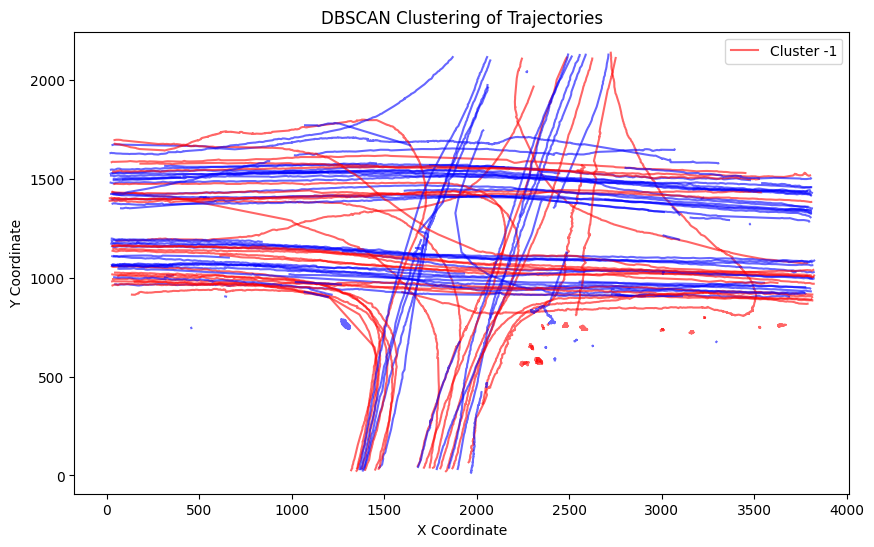

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Define paths
folder_path = "10"
abnormal_file_path = "AbnormalTracks_10.txt"

# Read abnormal file names
with open(abnormal_file_path, "r") as f:
    abnormal_files = set(f.read().splitlines())

# Function to calculate trajectory from bounding box
def extract_trajectory(csv_path):
    df = pd.read_csv(csv_path)
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["center_x", "center_y"]].values

# Read all trajectories
trajectories = []
labels = []
file_names = []

for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)
        trajectory = extract_trajectory(file_path)
        
        if len(trajectory) > 1:  # Ensure valid trajectories
            trajectories.append(trajectory)
            labels.append(1 if file_name in abnormal_files else 0)
            file_names.append(file_name)

# Convert to fixed-length feature vectors using resampling
def resample_trajectory(traj, n_points=50):
    indices = np.linspace(0, len(traj) - 1, n_points).astype(int)
    return traj[indices].flatten()

X = np.array([resample_trajectory(traj) for traj in trajectories])

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=5, min_samples=2, metric="euclidean")
clusters = dbscan.fit_predict(X)

# Plot the results
plt.figure(figsize=(10, 6))
for i, traj in enumerate(trajectories):
    cluster_label = clusters[i]
    color = "red" if labels[i] == 1 else "blue"  # Red for abnormal, blue for normal
    plt.plot(traj[:, 0], traj[:, 1], color=color, alpha=0.6, label=f"Cluster {cluster_label}" if i == 0 else "")

plt.title("DBSCAN Clustering of Trajectories")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend()
plt.show()


Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '230_285_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '615_706_.csv', '119_145_243_.csv', '280_330_352_.csv',

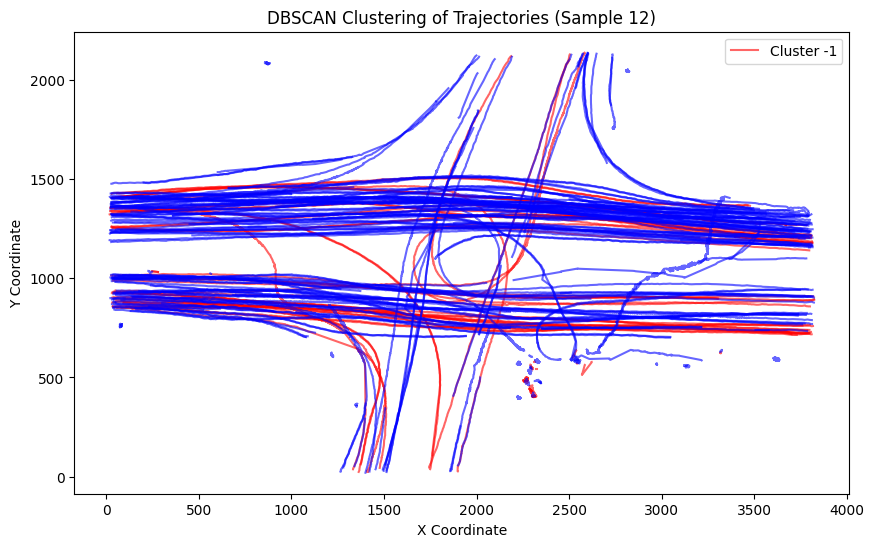

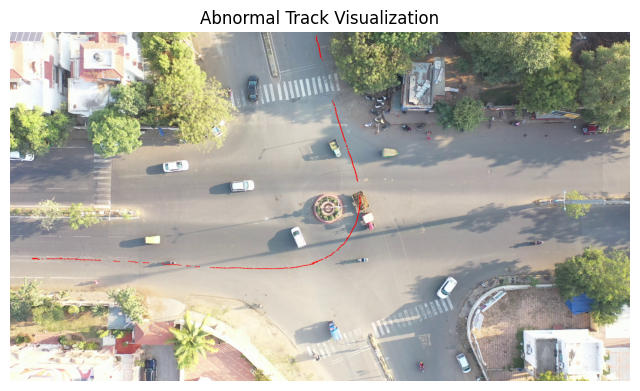


DBSCAN Clustering Results:
Accuracy: 0.007168458781362007


In [5]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import DBSCAN

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # Text file with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image for visualization (optional)

# Create output directory if needed (for saving images/CSV, if desired)
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
# Read the abnormal track IDs from the text file.
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = []
    for f in abnormal_lines:
        # Remove any extension if provided; we work with the ID prefix.
        file_name_split = f.split(".")
        abnormal_files_names.append(file_name_split[0])

# List all CSV files available in the folder.
all_csv_files = set(os.listdir(folder_path))

# For each abnormal track ID, do a prefix match to find a valid CSV file.
valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in all_csv_files:
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            break  # Use first match found

# Normal files are those CSVs in the folder that are not marked as abnormal.
valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Valid normal files:", valid_normal_files)

###############################################################################
# 2. Define Functions to Extract Trajectories & Resample Them
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (with columns: frameNo, left, top, w, h) and returns the
    trajectory as an array of center points [center_x, center_y].
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    # Calculate center coordinates of bounding boxes.
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["center_x", "center_y"]].values

def resample_trajectory(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points (default 50) using linear spacing.
    Returns a flattened feature vector.
    """
    if len(traj) < n_points:
        # If the trajectory is too short, repeat the last point (or pad as needed)
        indices = np.linspace(0, len(traj) - 1, n_points).astype(int)
    else:
        indices = np.linspace(0, len(traj) - 1, n_points).astype(int)
    return traj[indices].flatten()

###############################################################################
# 3. Load Trajectories & Prepare Labels
###############################################################################
trajectories = []  # List to store trajectory arrays
labels = []        # Label 1 for abnormal, 0 for normal
file_names = []    # Store file names for reference

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:  # Ensure valid trajectory (more than one point)
        trajectories.append(traj)
        labels.append(1)  # Abnormal
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        trajectories.append(traj)
        labels.append(0)  # Normal
        file_names.append(file_name)

# Resample each trajectory to create fixed-length feature vectors.
X = np.array([resample_trajectory(traj) for traj in trajectories])

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Apply DBSCAN for Clustering/Anomaly Detection
###############################################################################
# Here, we use DBSCAN to cluster the fixed-length feature vectors.
dbscan = DBSCAN(eps=5, min_samples=2, metric="euclidean")
clusters = dbscan.fit_predict(X)

print("DBSCAN clusters:", clusters)

###############################################################################
# 5. Plot the Trajectories with DBSCAN and Label Information
###############################################################################
plt.figure(figsize=(10, 6))
for i, traj in enumerate(trajectories):
    cluster_label = clusters[i]
    # Color-code: red for abnormal, blue for normal.
    # color = "red" if labels[i] == 1 else "blue"
    if labels[i] == 1:
        color = "red"
    else:
        color = "blue"
    plt.plot(traj[:, 0], traj[:, 1],
             color=color, alpha=0.6,
             label=f"Cluster {cluster_label}" if i == 0 else "")
plt.title("DBSCAN Clustering of Trajectories (Sample " + sample + ")")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend()
plt.show()

###############################################################################
# 6. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    """
    Visualizes the trajectory by drawing its points on the background image.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    # Convert BGR to RGB for Matplotlib display.
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Draw trajectory points on the image.
    for point in trajectory:
        x, y = int(point[0]), int(point[1])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)  # Blue dot
    
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()  

# Example: Visualize the first abnormal track (if available)
if trajectories and labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")

# Function to calculate majority-vote accuracy
def calculate_accuracy(labels, predictions):
    correct = sum(1 for pred, label in zip(predictions, labels) if pred == label)
    return correct / len(labels)

print("\nDBSCAN Clustering Results:")
print(f"Accuracy: {calculate_accuracy(labels,clusters)}")


159 CSV files found in folder: 10
Valid abnormal files: ['768_.csv', '225_.csv', '332_340_350_388_389_402_410_467_481_515_542_.csv', '7_37_72_128_.csv', '436_.csv', '241_281_375_385_.csv', '22_36_54_142_152_164_192_257_258_276_282_301_334_416_455_487_508_588_597_645_745_811_853_882_916_.csv', '894_923_931_962_.csv', '341_501_.csv', '514_549_568_621_704_718_799_820_836_868_878_889_897_899_921_932_946_954_959_.csv', '232_249_285_304_344_418_.csv', '468_507_529_647_.csv', '823_.csv', '151_.csv', '421_.csv', '442_453_.csv', '378_.csv', '220_263_300_.csv', '835_.csv', '964_.csv', '493_544_.csv', '48_122_132_137_161_172_329_358_408_497_601_755_859_896_940_.csv', '99_.csv', '563_590_651_663_.csv', '370_.csv', '963_.csv', '23_75_119_160_231_245_278_308_321_682_708_769_843_864_.csv', '620_.csv', '14_40_64_.csv', '430_523_550_555_571_.csv', '361_.csv', '382_423_.csv', '106_123_183_207_.csv', '825_.csv', '589_.csv', '526_634_638_658_.csv', '675_723_729_739_761_.csv', '20_47_73_141_229_322_359_420

c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


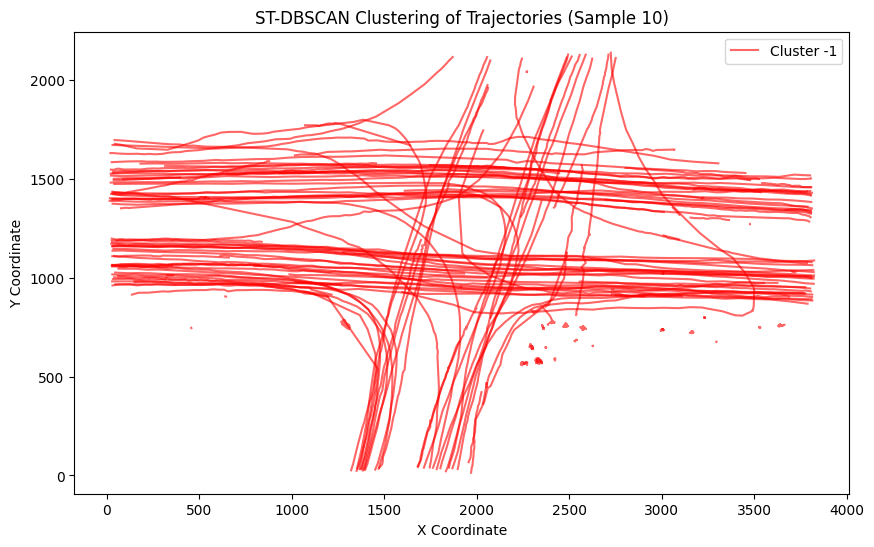

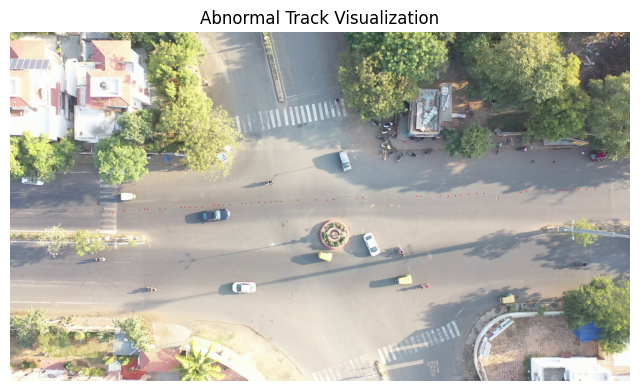

In [26]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix, classification_report

###############################################################################
# Parameters & Paths
###############################################################################
sample = "10"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # Text file with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image for visualization (optional)

# Create output directory if needed (for saving images/CSV, if desired)
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = []
    for f in abnormal_lines:
        # Remove any extension if provided; we work with the ID prefix.
        file_name_split = f.split(".")
        abnormal_files_names.append(file_name_split[0])

# List all CSV files available in the folder.
all_csv_files = set(os.listdir(folder_path))

print(len(all_csv_files), "CSV files found in folder:", folder_path)


# For each abnormal track ID, do a prefix match to find a valid CSV file.
valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in all_csv_files:
        if csv_file_name.endswith(".csv"):
            if name in csv_file_name:
                # print("Found abnormal file:", csv_file_name)
                valid_abnormal_files.append(csv_file_name)
                all_csv_files.remove(csv_file_name)  # Remove from normal files
                break  # Use first match found
            


# Normal files are those CSVs in the folder that are not marked as abnormal.
valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Define Functions to Extract Trajectories & Resample Them
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (with columns: frameNo, left, top, w, h) and returns the
    trajectory as an array of [frameNo, center_x, center_y] values.
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points (default 50) using linear spacing.
    Returns an array of shape (n_points, 3) preserving [frameNo, center_x, center_y].
    """
    if len(traj) < n_points:
        indices = np.linspace(0, len(traj) - 1, n_points).astype(int)
    else:
        indices = np.linspace(0, len(traj) - 1, n_points).astype(int)
    return traj[indices]

###############################################################################
# 3. Load Trajectories & Prepare Labels
###############################################################################
trajectories = []  # List to store trajectory arrays (each with time & spatial info)
labels = []        # Label 1 for abnormal, 0 for normal (based on file designation)
file_names = []    # Store file names for reference

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:  # Ensure valid trajectory (more than one point)
        trajectories.append(resample_trajectory(traj))
        labels.append(1)  # Abnormal
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        trajectories.append(resample_trajectory(traj))
        labels.append(0)  # Normal
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Feature Vectors for ST-DBSCAN
###############################################################################
# For each trajectory, we create a feature vector that consists of:
#   - A temporal feature: the mean frame number
#   - Spatial features: flattened center_x and center_y coordinates from the resampled trajectory
feature_vectors = []
for traj in trajectories:
    temporal = np.mean(traj[:, 0])
    spatial = traj[:, 1:3].flatten()
    combined = np.concatenate(([temporal], spatial))
    feature_vectors.append(combined)
X = np.array(feature_vectors)
print("Feature vector shape:", X.shape)  # Should be (n_samples, 1 + n_points*2)

###############################################################################
# 5. Define Custom Metric for ST-DBSCAN
###############################################################################
def stdbscan_metric(u, v, eps_temporal):
    """
    Custom distance metric for ST-DBSCAN.
    u and v are 1D arrays where:
      - u[0] and v[0] represent the temporal feature (mean frame number).
      - u[1:] and v[1:] represent the spatial features.
    If the absolute difference in temporal features exceeds eps_temporal,
    the distance is set to infinity; otherwise, returns the Euclidean distance
    between the spatial parts.
    """
    t_diff = abs(u[0] - v[0])
    if t_diff > eps_temporal:
        return np.inf
    return np.linalg.norm(u[1:] - v[1:])

eps_temporal = 10  # Temporal threshold (frame difference)
custom_metric = lambda u, v: stdbscan_metric(u, v, eps_temporal)

###############################################################################
# 6. Apply ST-DBSCAN for Clustering/Anomaly Detection
###############################################################################
eps_spatial = 5  # Spatial threshold for our custom metric
stdbscan = DBSCAN(eps=eps_spatial, min_samples=2, metric=custom_metric)
clusters = stdbscan.fit_predict(X)
print("ST-DBSCAN clusters:", clusters)

# Define predicted labels based on ST-DBSCAN:
# Trajectories labeled as noise (cluster == -1) are abnormal (predicted_label = 1)
predicted_labels = [1 if cl == -1 else 0 for cl in clusters]

###############################################################################
# 7. Compare Predicted Labels with Actual Labels from combined_labels.csv
###############################################################################
# Load the actual labels from combined_labels.csv (assumed to be in output_dir)
actual_labels_file = os.path.join(output_dir, "combined_labels.csv")
df_actual = pd.read_csv(actual_labels_file)  # Expected columns: filename, label

# Create a DataFrame for our predictions.
df_pred = pd.DataFrame({
    'filename': file_names,
    'cluster_label': clusters,
    'predicted_label': predicted_labels
})



# Normalize filenames to ensure they match between df_pred and df_actual.
df_pred['filename'] = df_pred['filename'].apply(lambda x: os.path.basename(x))
df_actual['filename'] = df_actual['filename'].apply(lambda x: os.path.basename(x))

# Merge predictions with actual labels on filename.
df_merge = pd.merge(df_pred, df_actual, on='filename', how='inner')
print("Merged label comparison:")
print(df_merge.head())

df_merge.to_csv(os.path.join(output_dir, "merged_labels.csv"), index=False)

# Compute confusion matrix and classification report.
cm = confusion_matrix(df_merge['label'], df_merge['predicted_label'])
cr = classification_report(df_merge['label'], df_merge['predicted_label'])
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 8. Plot the Trajectories with ST-DBSCAN and Label Information
###############################################################################
plt.figure(figsize=(10, 6))
for i, traj in enumerate(trajectories):
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2],
             color=color, alpha=0.6,
             label=f"Cluster {clusters[i]}" if i == 0 else "")
plt.title("ST-DBSCAN Clustering of Trajectories (Sample " + sample + ")")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend()
plt.show()

###############################################################################
# 9. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    """
    Visualizes the trajectory by drawing its points on the background image.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])  # Using center_x and center_y
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '280_330_352_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '369_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '230_285_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '33_68_76_103_121_186_195_216_235_239_241_250_270_471_472_484_485_497_498_511_605_637_665_674_740_793_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv',

c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


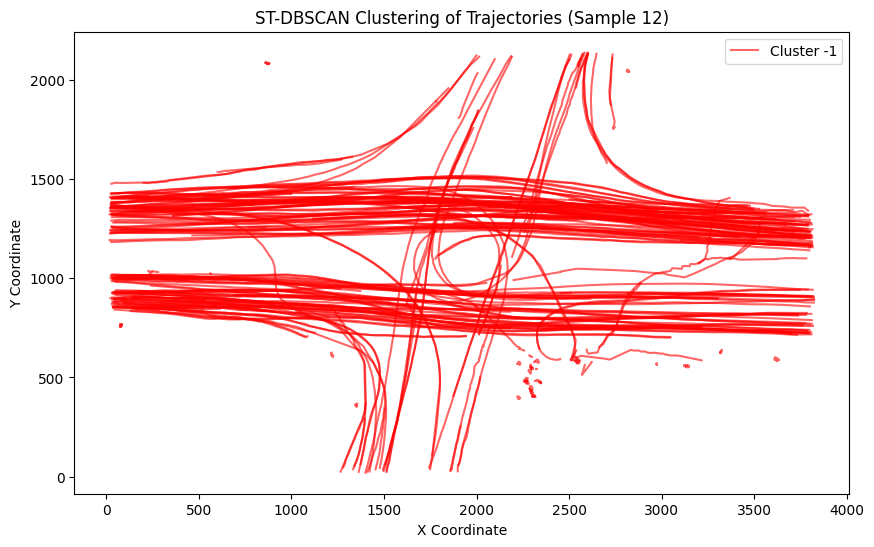

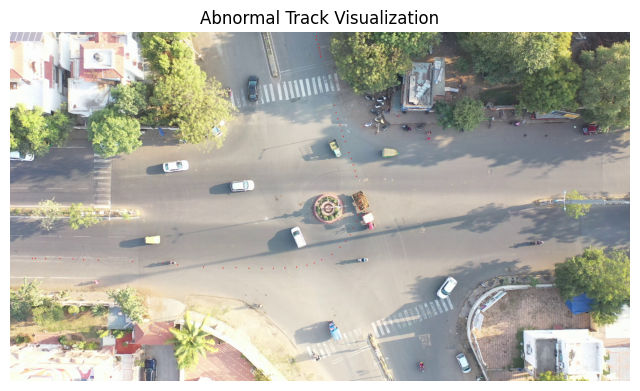

In [28]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix, classification_report
from tslearn.preprocessing import TimeSeriesResampler

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "10"
folder_path = sample            # Folder containing CSV files for sample 10
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # Text file with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image for visualization (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = []
    for f in abnormal_lines:
        # Remove any extension if provided; we work with the ID prefix.
        file_name_split = f.split(".")
        abnormal_files_names.append(file_name_split[0])

# List all CSV files available in the folder.
all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

# For each abnormal track ID, do a prefix match to find a valid CSV file.
valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in all_csv_files.copy():
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)  # Remove from normal files
            break  # Use first match found

# Normal files are those CSVs in the folder that are not marked as abnormal.
valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Define Functions to Extract Trajectories & Resample Them using tslearn
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (with columns: frameNo, left, top, w, h) and returns the
    trajectory as an array of [frameNo, center_x, center_y] values.
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn's TimeSeriesResampler.
    Expects traj as a numpy array of shape (n_steps, features) and returns an array of shape (n_points, features).
    """
    traj = np.array(traj)
    # Reshape to (1, n_steps, features) for tslearn
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]  # Back to shape (n_points, features)

###############################################################################
# 3. Load Trajectories & Prepare Labels
###############################################################################
trajectories = []  # List to store trajectory arrays (each with time & spatial info)
labels = []        # Label 1 for abnormal, 0 for normal (based on file designation)
file_names = []    # Store file names for reference

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:  # Ensure valid trajectory (more than one point)
        trajectories.append(resample_trajectory_ts(traj, n_points=50))
        labels.append(1)  # Abnormal
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        trajectories.append(resample_trajectory_ts(traj, n_points=50))
        labels.append(0)  # Normal
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Feature Vectors for ST-DBSCAN
###############################################################################
# For each trajectory, we create a feature vector that consists of:
#   - A temporal feature: the mean frame number
#   - Spatial features: flattened center_x and center_y coordinates from the resampled trajectory
feature_vectors = []
for traj in trajectories:
    temporal = np.mean(traj[:, 0])
    spatial = traj[:, 1:3].flatten()
    combined = np.concatenate(([temporal], spatial))
    feature_vectors.append(combined)
X = np.array(feature_vectors)
print("Feature vector shape:", X.shape)  # Should be (n_samples, 1 + n_points*2)

###############################################################################
# 5. Define Custom Metric for ST-DBSCAN
###############################################################################
def stdbscan_metric(u, v, eps_temporal):
    """
    Custom distance metric for ST-DBSCAN.
    u and v are 1D arrays where:
      - u[0] and v[0] represent the temporal feature (mean frame number).
      - u[1:] and v[1:] represent the spatial features.
    If the absolute difference in temporal features exceeds eps_temporal,
    the distance is set to infinity; otherwise, returns the Euclidean distance
    between the spatial parts.
    """
    t_diff = abs(u[0] - v[0])
    if t_diff > eps_temporal:
        return np.inf
    return np.linalg.norm(u[1:] - v[1:])

eps_temporal = 5  # Temporal threshold (frame difference)
custom_metric = lambda u, v: stdbscan_metric(u, v, eps_temporal)

###############################################################################
# 6. Apply ST-DBSCAN for Clustering/Anomaly Detection
###############################################################################
eps_spatial = 5  # Spatial threshold for our custom metric
stdbscan = DBSCAN(eps=eps_spatial, min_samples=2, metric=custom_metric)
clusters = stdbscan.fit_predict(X)
print("ST-DBSCAN clusters:", clusters)

# Define predicted labels based on ST-DBSCAN:
# Trajectories labeled as noise (cluster == -1) are abnormal (predicted_label = 1)
predicted_labels = [1 if cl == -1 else 0 for cl in clusters]

###############################################################################
# 7. Compare Predicted Labels with Actual Labels from combined_labels.csv
###############################################################################
# Load the actual labels from combined_labels.csv (assumed to be in output_dir)
actual_labels_file = os.path.join(output_dir, "combined_labels.csv")
df_actual = pd.read_csv(actual_labels_file)  # Expected columns: filename, label

# Create a DataFrame for our predictions.
df_pred = pd.DataFrame({
    'filename': file_names,
    'cluster_label': clusters,
    'predicted_label': predicted_labels
})

# Normalize filenames to ensure they match between df_pred and df_actual.
df_pred['filename'] = df_pred['filename'].apply(lambda x: os.path.basename(x))
df_actual['filename'] = df_actual['filename'].apply(lambda x: os.path.basename(x))

# Merge predictions with actual labels on filename.
df_merge = pd.merge(df_pred, df_actual, on='filename', how='inner')
print("Merged label comparison:")
print(df_merge.head())

df_merge.to_csv(os.path.join(output_dir, "merged_labels.csv"), index=False)

# Compute confusion matrix and classification report.
cm = confusion_matrix(df_merge['label'], df_merge['predicted_label'])
cr = classification_report(df_merge['label'], df_merge['predicted_label'])
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 8. Plot the Trajectories with ST-DBSCAN and Label Information
###############################################################################
plt.figure(figsize=(10, 6))
for i, traj in enumerate(trajectories):
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2],
             color=color, alpha=0.6,
             label=f"Cluster {clusters[i]}" if i == 0 else "")
plt.title("ST-DBSCAN Clustering of Trajectories (Sample " + sample + ")")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend()
plt.show()

###############################################################################
# 9. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    """
    Visualizes the trajectory by drawing its points on the background image.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])  # Using center_x and center_y
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '280_330_352_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '369_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '230_285_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '33_68_76_103_121_186_195_216_235_239_241_250_270_471_472_484_485_497_498_511_605_637_665_674_740_793_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv',

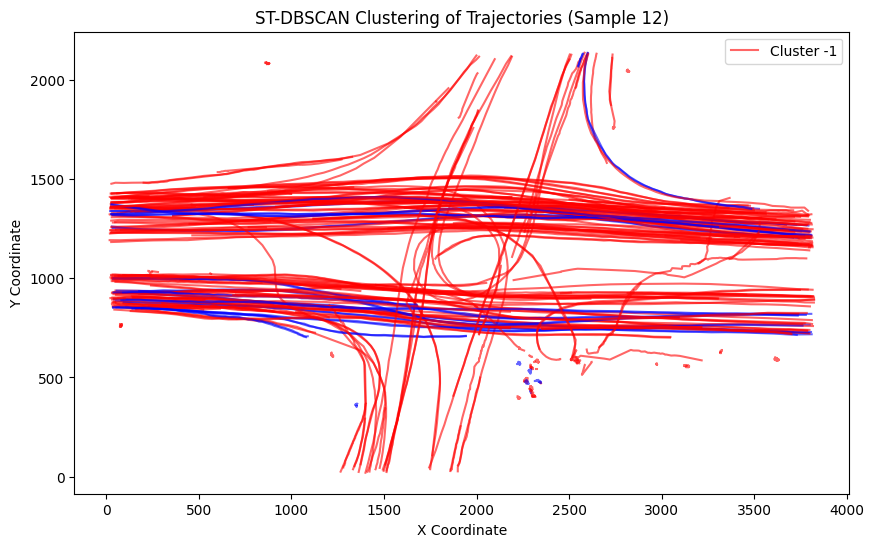

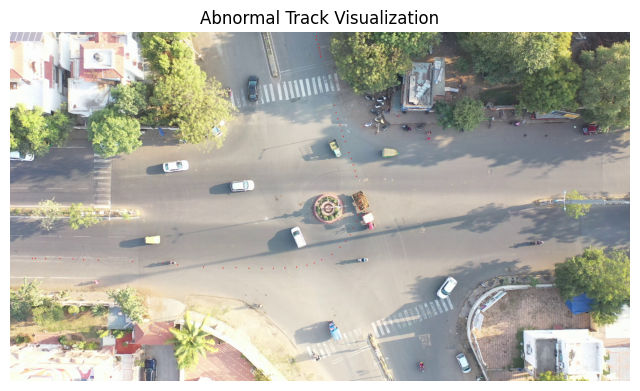

In [29]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from tslearn.preprocessing import TimeSeriesResampler

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # Text file with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image for visualization (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = []
    for f in abnormal_lines:
        # Remove any extension if provided; we work with the ID prefix.
        file_name_split = f.split(".")
        abnormal_files_names.append(file_name_split[0])

# List all CSV files available in the folder.
all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

# For each abnormal track ID, do a prefix match to find a valid CSV file.
valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in all_csv_files.copy():
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)  # Remove from normal files
            break  # Use first match found

# Normal files are those CSVs in the folder that are not marked as abnormal.
valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Define Functions to Extract Trajectories & Resample Them using tslearn
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (with columns: frameNo, left, top, w, h) and returns the
    trajectory as an array of [frameNo, center_x, center_y] values.
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn's TimeSeriesResampler.
    Expects traj as a numpy array of shape (n_steps, features) and returns an array of shape (n_points, features).
    """
    traj = np.array(traj)
    # Reshape to (1, n_steps, features) for tslearn
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]  # Back to shape (n_points, features)

###############################################################################
# 3. Load Trajectories & Prepare Labels
###############################################################################
trajectories = []  # List to store trajectory arrays (each with time & spatial info)
labels = []        # Label 1 for abnormal, 0 for normal (based on file designation)
file_names = []    # Store file names for reference

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:  # Ensure valid trajectory (more than one point)
        trajectories.append(resample_trajectory_ts(traj, n_points=50))
        labels.append(1)  # Abnormal
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        trajectories.append(resample_trajectory_ts(traj, n_points=50))
        labels.append(0)  # Normal
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Feature Vectors for ST-DBSCAN
###############################################################################
# For each trajectory, we create a feature vector that consists of:
#   - A temporal feature: the mean frame number
#   - Spatial features: flattened center_x and center_y coordinates from the resampled trajectory
feature_vectors = []
for traj in trajectories:
    temporal = np.mean(traj[:, 0])
    spatial = traj[:, 1:3].flatten()
    combined = np.concatenate(([temporal], spatial))
    feature_vectors.append(combined)
X = np.array(feature_vectors)
print("Feature vector shape:", X.shape)  # Should be (n_samples, 1 + n_points*2)

###############################################################################
# 4a. Normalize the Spatial Features
###############################################################################
# The spatial features (columns 1:) can have large values. Scaling them helps in comparing distances.
spatial_data = X[:, 1:]
scaler = StandardScaler()
spatial_scaled = scaler.fit_transform(spatial_data)
# Combine the original temporal feature with the scaled spatial features.
X_scaled = np.concatenate([X[:, 0:1], spatial_scaled], axis=1)
print("Scaled feature vector shape:", X_scaled.shape)

###############################################################################
# 5. Define Custom Metric for ST-DBSCAN
###############################################################################
def stdbscan_metric(u, v, eps_temporal):
    """
    Custom distance metric for ST-DBSCAN.
    u and v are 1D arrays where:
      - u[0] and v[0] represent the temporal feature (mean frame number).
      - u[1:] and v[1:] represent the scaled spatial features.
    If the absolute difference in temporal features exceeds eps_temporal,
    the distance is set to infinity; otherwise, returns the Euclidean distance
    between the spatial parts.
    """
    t_diff = abs(u[0] - v[0])
    if t_diff > eps_temporal:
        return np.inf
    return np.linalg.norm(u[1:] - v[1:])

eps_temporal = 5  # Temporal threshold (frame difference)
custom_metric = lambda u, v: stdbscan_metric(u, v, eps_temporal)

###############################################################################
# 6. Apply ST-DBSCAN for Clustering/Anomaly Detection
###############################################################################
# Adjust eps_spatial for the scaled spatial data.
eps_spatial = 1.0  # Try a smaller value now that spatial features are scaled
stdbscan = DBSCAN(eps=eps_spatial, min_samples=2, metric=custom_metric)
clusters = stdbscan.fit_predict(X_scaled)
print("ST-DBSCAN clusters:", clusters)

# Define predicted labels based on ST-DBSCAN:
# Trajectories labeled as noise (cluster == -1) are abnormal (predicted_label = 1)
predicted_labels = [1 if cl == -1 else 0 for cl in clusters]

###############################################################################
# 7. Compare Predicted Labels with Actual Labels from combined_labels.csv
###############################################################################
# Load the actual labels from combined_labels.csv (assumed to be in output_dir)
actual_labels_file = os.path.join(output_dir, "combined_labels.csv")
df_actual = pd.read_csv(actual_labels_file)  # Expected columns: filename, label

# Create a DataFrame for our predictions.
df_pred = pd.DataFrame({
    'filename': file_names,
    'cluster_label': clusters,
    'predicted_label': predicted_labels
})

# Normalize filenames to ensure they match between df_pred and df_actual.
df_pred['filename'] = df_pred['filename'].apply(lambda x: os.path.basename(x))
df_actual['filename'] = df_actual['filename'].apply(lambda x: os.path.basename(x))

# Merge predictions with actual labels on filename.
df_merge = pd.merge(df_pred, df_actual, on='filename', how='inner')
print("Merged label comparison:")
print(df_merge.head())

df_merge.to_csv(os.path.join(output_dir, "merged_labels.csv"), index=False)

# Compute confusion matrix and classification report.
cm = confusion_matrix(df_merge['label'], df_merge['predicted_label'])
cr = classification_report(df_merge['label'], df_merge['predicted_label'])
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 8. Plot the Trajectories with ST-DBSCAN and Label Information
###############################################################################
plt.figure(figsize=(10, 6))
for i, traj in enumerate(trajectories):
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2],
             color=color, alpha=0.6,
             label=f"Cluster {clusters[i]}" if i == 0 else "")
plt.title("ST-DBSCAN Clustering of Trajectories (Sample " + sample + ")")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend()
plt.show()

###############################################################################
# 9. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    """
    Visualizes the trajectory by drawing its points on the background image.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])  # Using center_x and center_y
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '221_223_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '119_145_243_.csv', '

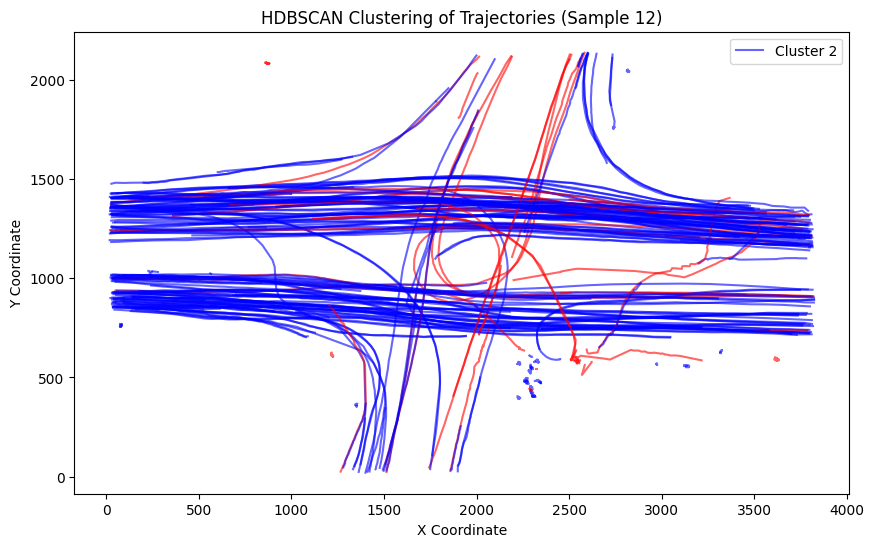

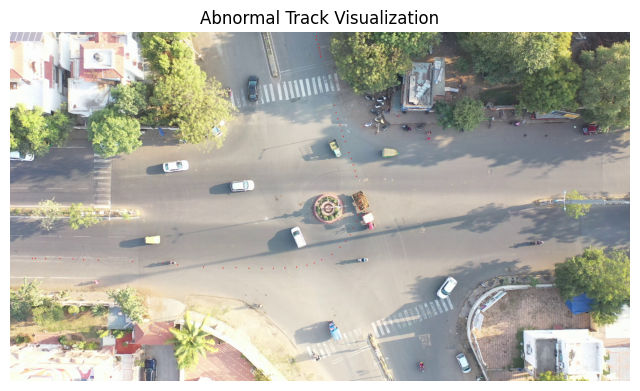

In [31]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
from sklearn.preprocessing import StandardScaler
import hdbscan
from sklearn.metrics import confusion_matrix, classification_report

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # Text file with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image for visualization (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = [line.split(".")[0] for line in abnormal_lines]

# List all CSV files available in the folder.
all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

# For each abnormal track ID, do a prefix match to find a valid CSV file.
valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in list(all_csv_files):
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)  # Remove from normal files
            break  # Use first match found

# Normal files are those CSVs in the folder that are not marked as abnormal.
valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Define Functions to Extract and Process Trajectories
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (with columns: frameNo, left, top, w, h) and returns the
    trajectory as an array of [frameNo, center_x, center_y] values.
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn's TimeSeriesResampler.
    Expects traj as a numpy array of shape (n_steps, features) and returns an array of shape (n_points, features).
    """
    traj = np.array(traj)
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]  # Back to shape (n_points, features)

def compute_additional_features(traj):
    """
    Compute additional features from the trajectory:
      - Average speed: mean Euclidean distance between consecutive points.
      - Average acceleration: mean change in speed between consecutive segments.
      - Average angular change: mean change in direction (radians) between consecutive segments.
    Trajectory format is assumed to be: [frameNo, x, y]
    """
    # Compute differences between consecutive points
    diffs = np.diff(traj[:, 1:3], axis=0)
    # Euclidean distances (speeds, ignoring frame differences)
    speeds = np.linalg.norm(diffs, axis=1)
    avg_speed = np.mean(speeds) if len(speeds) > 0 else 0
    
    # Acceleration: difference in speeds
    if len(speeds) > 1:
        accels = np.diff(speeds)
        avg_accel = np.mean(np.abs(accels))
    else:
        avg_accel = 0

    # Angular change: compute angles between consecutive differences
    angles = np.arctan2(diffs[:, 1], diffs[:, 0])
    if len(angles) > 1:
        angle_diffs = np.diff(angles)
        # Normalize angle differences to the range [-pi, pi]
        angle_diffs = (angle_diffs + np.pi) % (2 * np.pi) - np.pi
        avg_angle_change = np.mean(np.abs(angle_diffs))
    else:
        avg_angle_change = 0

    return avg_speed, avg_accel, avg_angle_change

###############################################################################
# 3. Load Trajectories & Prepare Labels
###############################################################################
trajectories = []  # List of resampled trajectory arrays
labels = []        # 1 for abnormal, 0 for normal (based on file designation)
file_names = []    # Store file names for reference

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:  # Ensure valid trajectory
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        labels.append(1)  # Abnormal
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        labels.append(0)  # Normal
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Feature Vectors with Additional Features
###############################################################################
feature_vectors = []
for traj in trajectories:
    # Temporal feature: mean frame number
    temporal = np.mean(traj[:, 0])
    
    # Spatial feature: flatten resampled (x, y) coordinates
    spatial = traj[:, 1:3].flatten()
    
    # Additional features: average speed, acceleration, and angular change
    avg_speed, avg_accel, avg_angle_change = compute_additional_features(traj)
    
    # Combine all features into a single vector
    combined = np.concatenate(([temporal], spatial, [avg_speed, avg_accel, avg_angle_change]))
    feature_vectors.append(combined)

X = np.array(feature_vectors)
print("Initial feature vector shape:", X.shape)  # (n_samples, 1 + n_points*2 + 3)

###############################################################################
# 4a. Scale All Features
###############################################################################
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled feature vector shape:", X_scaled.shape)

###############################################################################
# 5. Cluster with HDBSCAN
###############################################################################
# Using HDBSCAN often results in better handling of clusters with varying density.
clusterer = hdbscan.HDBSCAN(min_cluster_size=2, metric='euclidean')
clusters = clusterer.fit_predict(X_scaled)
print("HDBSCAN clusters:", clusters)

# Define predicted labels:
# Typically, HDBSCAN labels noise as -1. Here we mark noise (cluster == -1) as abnormal.
predicted_labels = [1 if cl == -1 else 0 for cl in clusters]

###############################################################################
# 6. Compare Predicted Labels with Actual Labels
###############################################################################
# Load actual labels from combined_labels.csv (assumed to be in output_dir)
actual_labels_file = os.path.join(output_dir, "combined_labels.csv")
df_actual = pd.read_csv(actual_labels_file)  # Expected columns: filename, label

# Create a DataFrame for our predictions.
df_pred = pd.DataFrame({
    'filename': file_names,
    'cluster_label': clusters,
    'predicted_label': predicted_labels
})

# Normalize filenames to ensure they match.
df_pred['filename'] = df_pred['filename'].apply(lambda x: os.path.basename(x))
df_actual['filename'] = df_actual['filename'].apply(lambda x: os.path.basename(x))

# Merge predictions with actual labels.
df_merge = pd.merge(df_pred, df_actual, on='filename', how='inner')
print("Merged label comparison:")
print(df_merge.head())

df_merge.to_csv(os.path.join(output_dir, "merged_labels.csv"), index=False)

# Compute confusion matrix and classification report.
cm = confusion_matrix(df_merge['label'], df_merge['predicted_label'])
cr = classification_report(df_merge['label'], df_merge['predicted_label'])
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 7. Plot the Trajectories with Cluster and Label Information
###############################################################################
plt.figure(figsize=(10, 6))
for i, traj in enumerate(trajectories):
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2],
             color=color, alpha=0.6,
             label=f"Cluster {clusters[i]}" if i == 0 else "")
plt.title("HDBSCAN Clustering of Trajectories (Sample " + sample + ")")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend()
plt.show()

###############################################################################
# 8. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    """
    Visualizes the trajectory by drawing its points on the background image.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '221_223_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '119_145_243_.csv', '

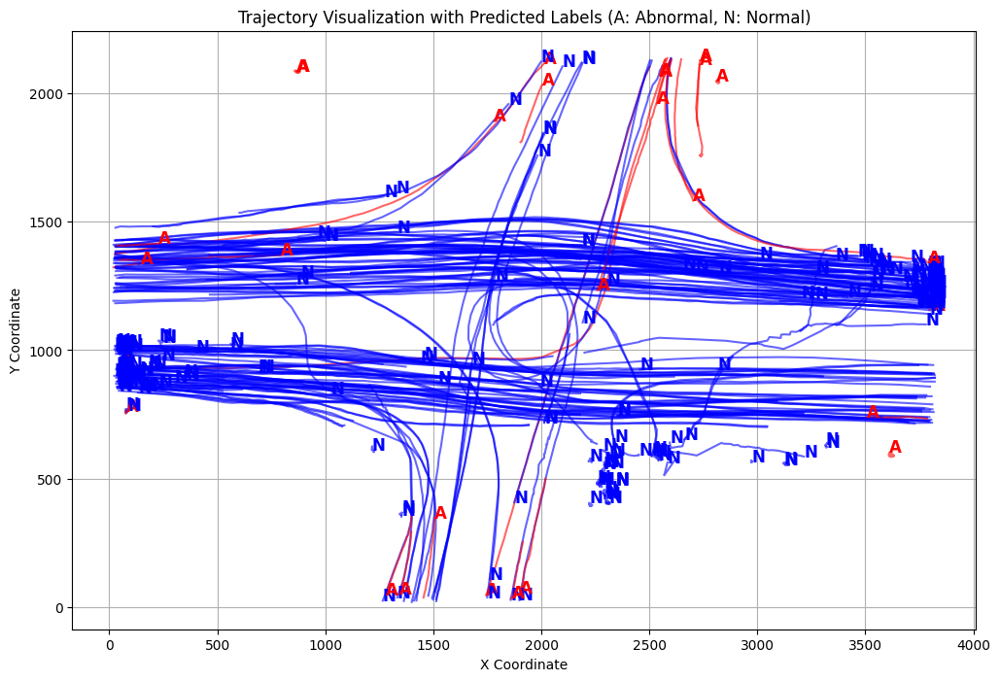

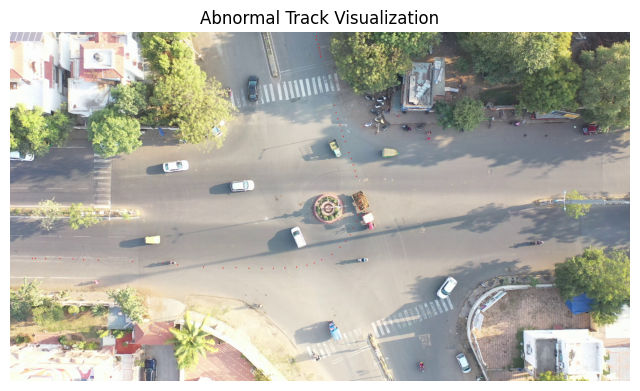

In [32]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.metrics import confusion_matrix, classification_report

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # Text file with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image for visualization (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = [line.split(".")[0] for line in abnormal_lines]

all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in list(all_csv_files):
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)
            break

valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Functions to Extract and Process Trajectories
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (columns: frameNo, left, top, w, h) and returns [frameNo, center_x, center_y].
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples trajectory to a fixed number of points using tslearn.
    """
    traj = np.array(traj)
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]

def compute_additional_features(traj):
    """
    Computes additional features from trajectory:
      - Average speed (mean Euclidean distance between consecutive points)
      - Average acceleration (mean change in speed)
      - Average angular change (mean change in direction in radians)
    """
    diffs = np.diff(traj[:, 1:3], axis=0)
    speeds = np.linalg.norm(diffs, axis=1)
    avg_speed = np.mean(speeds) if len(speeds) > 0 else 0
    
    if len(speeds) > 1:
        accels = np.diff(speeds)
        avg_accel = np.mean(np.abs(accels))
    else:
        avg_accel = 0

    angles = np.arctan2(diffs[:, 1], diffs[:, 0])
    if len(angles) > 1:
        angle_diffs = np.diff(angles)
        angle_diffs = (angle_diffs + np.pi) % (2 * np.pi) - np.pi  # Normalize
        avg_angle_change = np.mean(np.abs(angle_diffs))
    else:
        avg_angle_change = 0

    return avg_speed, avg_accel, avg_angle_change

###############################################################################
# 3. Load Trajectories & Prepare Labels
###############################################################################
trajectories = []  # Store resampled trajectories
true_labels = []   # 1 for abnormal, 0 for normal (for evaluation only)
file_names = []

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(1)  # Abnormal
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(0)  # Normal
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Feature Vectors with Extra Features
###############################################################################
feature_vectors = []
for traj in trajectories:
    temporal = np.mean(traj[:, 0])
    spatial = traj[:, 1:3].flatten()
    avg_speed, avg_accel, avg_angle_change = compute_additional_features(traj)
    combined = np.concatenate(([temporal], spatial, [avg_speed, avg_accel, avg_angle_change]))
    feature_vectors.append(combined)

X = np.array(feature_vectors)
print("Initial feature vector shape:", X.shape)  # (n_samples, 1 + n_points*2 + 3)

###############################################################################
# 4a. Scale All Features
###############################################################################
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled feature vector shape:", X_scaled.shape)

###############################################################################
# 5. Outlier Detection with IsolationForest
###############################################################################
# Fit IsolationForest. Note: it returns 1 for inliers (normal) and -1 for outliers.
isoforest = IsolationForest(contamination=0.1, random_state=42)
pred = isoforest.fit_predict(X_scaled)
# Convert predictions: outliers (-1) as abnormal (1), inliers (1) as normal (0)
predicted_labels = [1 if p == -1 else 0 for p in pred]

print("IsolationForest predicted labels:", predicted_labels)

###############################################################################
# 6. Evaluate the Model (if ground-truth labels are available)
###############################################################################
# Here, true_labels come from your file designations.
cm = confusion_matrix(true_labels, predicted_labels)
cr = classification_report(true_labels, predicted_labels)
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 7. Visualize Trajectories with Annotated Labels
###############################################################################
plt.figure(figsize=(12, 8))
for i, traj in enumerate(trajectories):
    # Choose color based on predicted label: red for abnormal, blue for normal.
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2], color=color, alpha=0.6)
    # Annotate near the starting point of the trajectory.
    label_text = "A" if predicted_labels[i] == 1 else "N"
    plt.text(traj[0, 1], traj[0, 2], label_text, fontsize=12, fontweight="bold", color=color)
plt.title("Trajectory Visualization with Predicted Labels (A: Abnormal, N: Normal)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.grid(True)
plt.show()

###############################################################################
# 8. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and true_labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '221_223_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '119_145_243_.csv', '

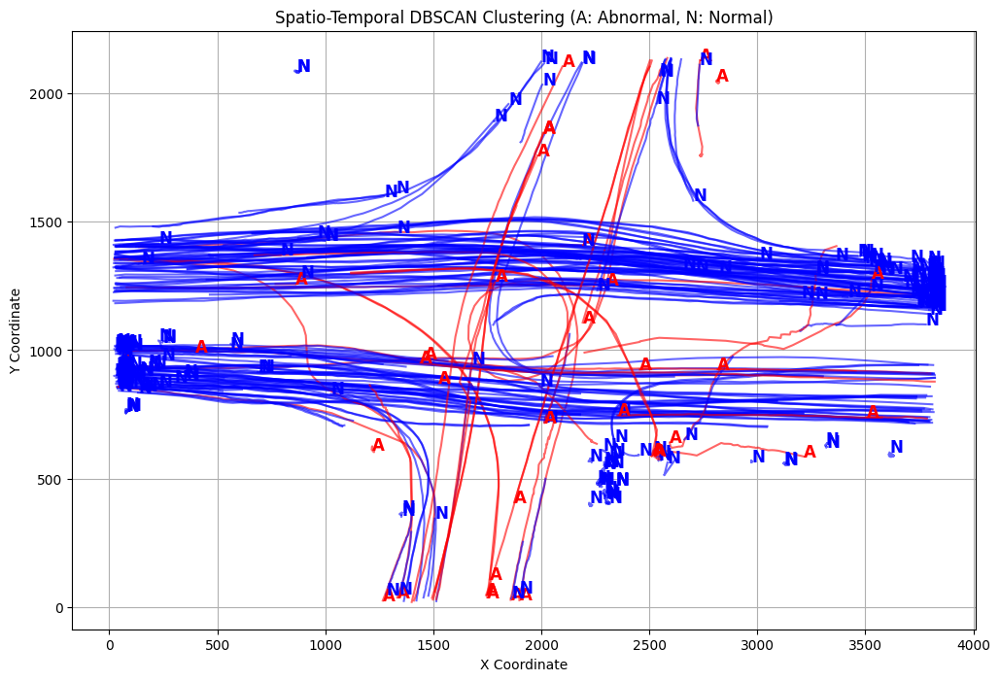

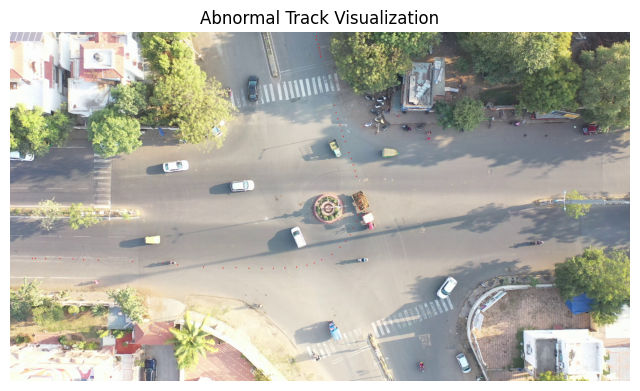

In [34]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix, classification_report

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # File with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = [line.split(".")[0] for line in abnormal_lines]

all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in list(all_csv_files):
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)
            break

valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Functions to Extract and Process Trajectories
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (columns: frameNo, left, top, w, h) and returns [frameNo, center_x, center_y].
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn.
    """
    traj = np.array(traj)
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]

def compute_additional_features(traj):
    """
    Computes additional features:
      - Average speed: mean Euclidean distance between consecutive points.
      - Average acceleration: mean absolute change in speed.
      - Average angular change: mean absolute change in direction (radians).
    """
    diffs = np.diff(traj[:, 1:3], axis=0)
    speeds = np.linalg.norm(diffs, axis=1)
    avg_speed = np.mean(speeds) if len(speeds) > 0 else 0

    if len(speeds) > 1:
        accels = np.diff(speeds)
        avg_accel = np.mean(np.abs(accels))
    else:
        avg_accel = 0

    angles = np.arctan2(diffs[:, 1], diffs[:, 0])
    if len(angles) > 1:
        angle_diffs = np.diff(angles)
        # Normalize angle differences to [-pi, pi]
        angle_diffs = (angle_diffs + np.pi) % (2 * np.pi) - np.pi
        avg_angle_change = np.mean(np.abs(angle_diffs))
    else:
        avg_angle_change = 0

    return avg_speed, avg_accel, avg_angle_change

###############################################################################
# 3. Load Trajectories & Prepare Ground-Truth Labels
###############################################################################
trajectories = []  # Resampled trajectories
true_labels = []   # Ground truth: 1 for abnormal, 0 for normal
file_names = []

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(1)
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(0)
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Spatiotemporal Feature Vectors
###############################################################################
feature_vectors = []
for traj in trajectories:
    # Temporal feature: mean frame number
    temporal = np.mean(traj[:, 0])
    # Spatial features: flattened (x, y) coordinates (n_points*2 values)
    spatial = traj[:, 1:3].flatten()  # e.g., shape = (100,)
    # Additional features: avg speed, acceleration, angular change (3 values)
    avg_speed, avg_accel, avg_angle_change = compute_additional_features(traj)
    combined = np.concatenate(([temporal], spatial, [avg_speed, avg_accel, avg_angle_change]))
    feature_vectors.append(combined)

X = np.array(feature_vectors)
print("Initial feature vector shape:", X.shape)  # Expected shape: (n_samples, 1 + 100 + 3) = (n_samples, 104)

###############################################################################
# 4a. Scale All Features
###############################################################################
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled feature vector shape:", X_scaled.shape)

###############################################################################
# 5. Custom Spatio-Temporal Distance Metric for DBSCAN
###############################################################################
# We assume:
#   - First element: temporal feature.
#   - Next 100 elements: spatial features.
#   - Last 3 elements: extra features.
# We set weights to balance the influence of each block.
temporal_weight = 0.05  # Adjust as needed
spatial_weight = 1.0
extra_weight = 1.0

def spatiotemporal_distance(u, v):
    # Temporal distance
    temp_dist = abs(u[0] - v[0])
    # Spatial distance: next 100 features (50 points * 2 dims)
    spat_dist = np.linalg.norm(u[1:101] - v[1:101])
    # Extra features distance: last 3 features
    extra_dist = np.linalg.norm(u[101:] - v[101:])
    return temporal_weight * temp_dist + spatial_weight * spat_dist + extra_weight * extra_dist

###############################################################################
# 6. Clustering with DBSCAN Using the Custom Metric
###############################################################################
# Tuning DBSCAN eps is critical. Adjust eps and min_samples as needed.
dbscan = DBSCAN(eps=3.5, min_samples=2, metric=spatiotemporal_distance)
clusters = dbscan.fit_predict(X_scaled)
print("DBSCAN cluster labels:", clusters)

# In ST-DBSCAN style, we can label noise (cluster == -1) as abnormal.
predicted_labels = [1 if c == -1 else 0 for c in clusters]

###############################################################################
# 7. Evaluate the Model Against Ground Truth
###############################################################################
cm = confusion_matrix(true_labels, predicted_labels)
cr = classification_report(true_labels, predicted_labels)
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 8. Visualize Trajectories with Annotated Predicted Labels
###############################################################################
plt.figure(figsize=(12, 8))
for i, traj in enumerate(trajectories):
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2], color=color, alpha=0.6)
    label_text = "A" if predicted_labels[i] == 1 else "N"
    plt.text(traj[0, 1], traj[0, 2], label_text, fontsize=12, fontweight="bold", color=color)
plt.title("Spatio-Temporal DBSCAN Clustering (A: Abnormal, N: Normal)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.grid(True)
plt.show()

###############################################################################
# 9. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and true_labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '221_223_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '119_145_243_.csv', '

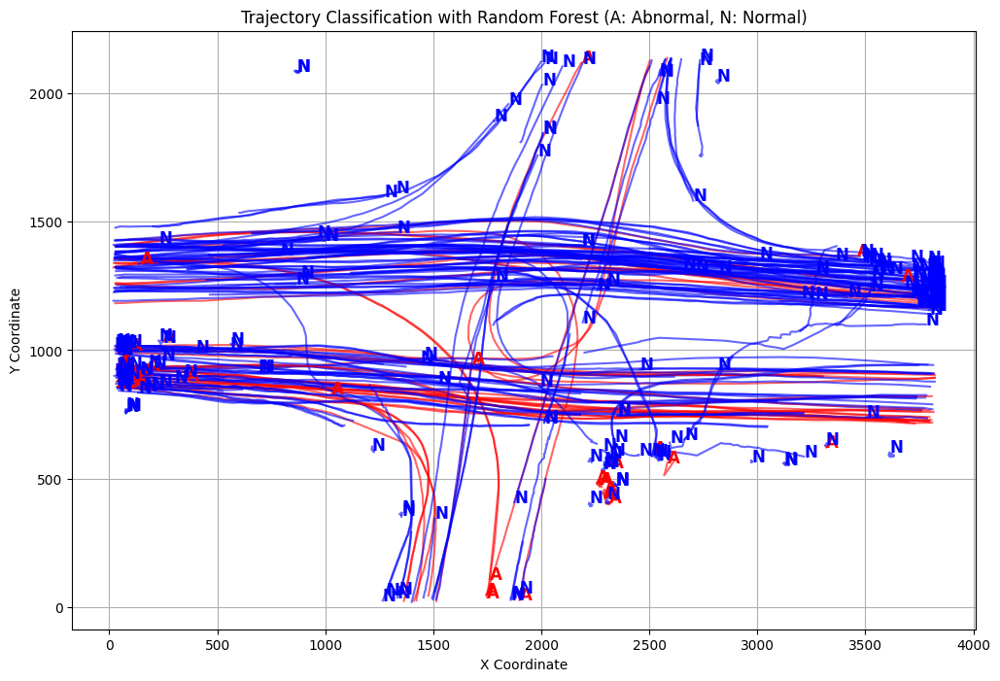

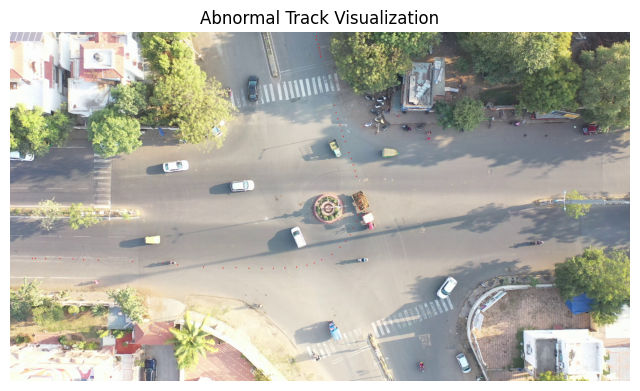

In [37]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # File with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = [line.split(".")[0] for line in abnormal_lines]

all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in list(all_csv_files):
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)
            break

valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Functions to Extract and Process Trajectories
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (columns: frameNo, left, top, w, h) and returns [frameNo, center_x, center_y].
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn.
    """
    traj = np.array(traj)
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]

def compute_additional_features(traj):
    """
    Computes additional features:
      - Average speed: mean Euclidean distance between consecutive points.
      - Average acceleration: mean absolute change in speed.
      - Average angular change: mean absolute change in direction (radians).
    """
    diffs = np.diff(traj[:, 1:3], axis=0)
    speeds = np.linalg.norm(diffs, axis=1)
    avg_speed = np.mean(speeds) if len(speeds) > 0 else 0

    if len(speeds) > 1:
        accels = np.diff(speeds)
        avg_accel = np.mean(np.abs(accels))
    else:
        avg_accel = 0

    angles = np.arctan2(diffs[:, 1], diffs[:, 0])
    if len(angles) > 1:
        angle_diffs = np.diff(angles)
        # Normalize angle differences to [-pi, pi]
        angle_diffs = (angle_diffs + np.pi) % (2 * np.pi) - np.pi
        avg_angle_change = np.mean(np.abs(angle_diffs))
    else:
        avg_angle_change = 0

    return avg_speed, avg_accel, avg_angle_change

###############################################################################
# 3. Load Trajectories & Prepare Ground-Truth Labels
###############################################################################
trajectories = []  # Resampled trajectories (each is a (n_points, 3) array)
true_labels = []   # Ground truth: 1 for abnormal, 0 for normal
file_names = []

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(1)
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(0)
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Spatiotemporal Feature Vectors
###############################################################################
# For each trajectory, we create a feature vector that includes:
#   - Temporal feature: mean frame number.
#   - Spatial features: flattened (x, y) coordinates from the resampled trajectory.
#   - Additional features: avg speed, avg acceleration, and avg angular change.
feature_vectors = []
for traj in trajectories:
    temporal = np.mean(traj[:, 0])
    spatial = traj[:, 1:3].flatten()   # (n_points*2,) vector, e.g., (100,)
    avg_speed, avg_accel, avg_angle_change = compute_additional_features(traj)
    combined = np.concatenate(([temporal], spatial, [avg_speed, avg_accel, avg_angle_change]))
    feature_vectors.append(combined)

X = np.array(feature_vectors)
print("Initial feature vector shape:", X.shape)  # Expected shape: (n_samples, 1 + 100 + 3)

###############################################################################
# 4a. Scale All Features
###############################################################################
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled feature vector shape:", X_scaled.shape)

###############################################################################
# 5. Train-Test Split and Supervised Classification Using Random Forest
###############################################################################
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Convert ground truth labels to numpy array.
y = np.array(true_labels)

# Split the dataset (e.g., 70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42, stratify=y)

# Initialize and train a Random Forest classifier.
clf = RandomForestClassifier(n_estimators=200, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set.
y_pred = clf.predict(X_test)

# Evaluate the classifier.
acc = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
cr = classification_report(y_test, y_pred)
print("Accuracy:", acc)
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 6. (Optional) Visualize Trajectories with Annotated Predicted Labels
###############################################################################
# We now use the trained classifier to predict labels on the entire dataset.
y_all_pred = clf.predict(X_scaled)
plt.figure(figsize=(12, 8))
for i, traj in enumerate(trajectories):
    color = "red" if y_all_pred[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2], color=color, alpha=0.6)
    label_text = "A" if y_all_pred[i] == 1 else "N"
    plt.text(traj[0, 1], traj[0, 2], label_text, fontsize=12, fontweight="bold", color=color)
plt.title("Trajectory Classification with Random Forest (A: Abnormal, N: Normal)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.grid(True)
plt.show()

###############################################################################
# 7. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and true_labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '221_223_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '119_145_243_.csv', '

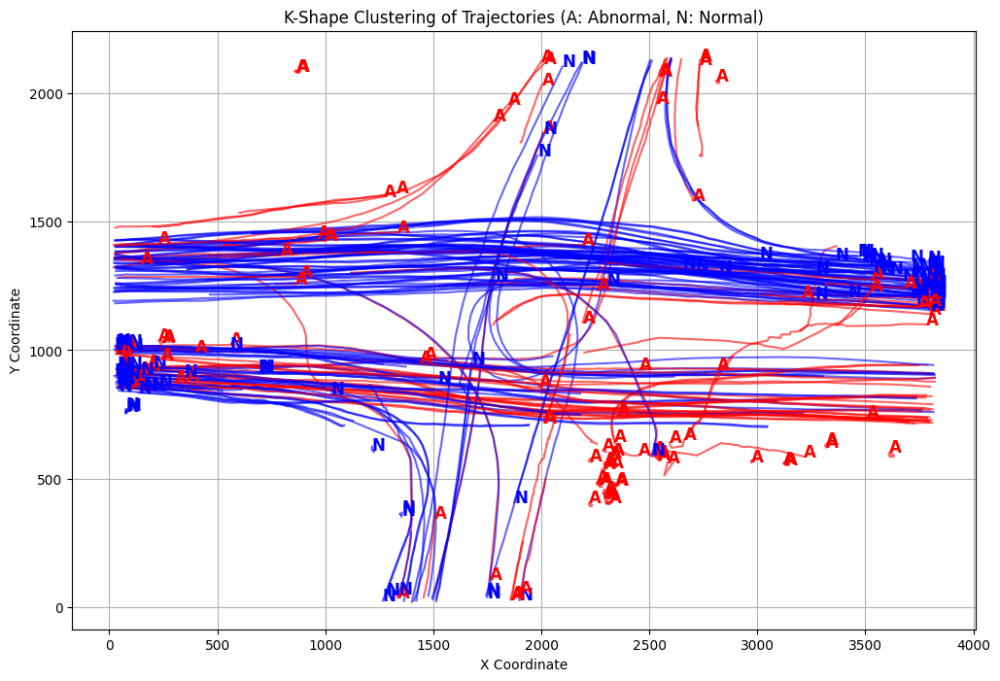

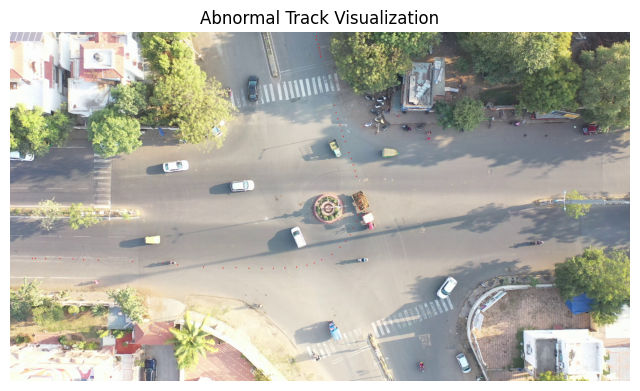

In [35]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
from tslearn.clustering import KShape
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # File with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = [line.split(".")[0] for line in abnormal_lines]

all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in list(all_csv_files):
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)
            break

valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Functions to Extract and Process Trajectories
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (columns: frameNo, left, top, w, h) and returns [frameNo, center_x, center_y].
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn.
    """
    traj = np.array(traj)
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]

###############################################################################
# 3. Load Trajectories & Prepare Ground-Truth Labels
###############################################################################
trajectories = []  # Resampled trajectories
true_labels = []   # Ground truth: 1 for abnormal, 0 for normal
file_names = []

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(1)
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(0)
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Prepare Time Series Data for K-Shape Clustering
###############################################################################
# K-Shape expects a univariate time series per sample.
# Here we combine the spatial (x,y) information into a single vector by flattening.
# Each trajectory's spatial time series (50 time steps, 2 dimensions) becomes a univariate series of length 100.
X_flat = []
for traj in trajectories:
    # Extract only spatial coordinates (columns 1 and 2)
    spatial = traj[:, 1:3]   # shape (50,2)
    # Flatten to shape (100,)
    flat = spatial.flatten()
    X_flat.append(flat)
X_flat = np.array(X_flat)
print("X_flat shape:", X_flat.shape)  # Expected shape: (n_samples, 100)

# Optionally scale the time series (each series separately or overall)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_flat)

###############################################################################
# 5. Cluster Using K-Shape
###############################################################################
# We choose n_clusters=2 (one for normal, one for abnormal).
kshape = KShape(n_clusters=2, n_init=10, random_state=42)
clusters = kshape.fit_predict(X_scaled)
print("K-Shape cluster labels:", clusters)

###############################################################################
# 6. Map Clusters to Predicted Labels Based on Ground-Truth Majority
###############################################################################
# Compute the majority label in each cluster:
clusters = np.array(clusters)
true_labels_arr = np.array(true_labels)
cluster0_abnormal = np.sum(true_labels_arr[clusters == 0])
cluster1_abnormal = np.sum(true_labels_arr[clusters == 1])

if cluster0_abnormal > cluster1_abnormal:
    # Cluster 0 mostly abnormal
    predicted_labels = [1 if c == 0 else 0 for c in clusters]
else:
    predicted_labels = [1 if c == 1 else 0 for c in clusters]

print("Mapped predicted labels:", predicted_labels)

###############################################################################
# 7. Evaluate the Model Against Ground Truth
###############################################################################
cm = confusion_matrix(true_labels, predicted_labels)
cr = classification_report(true_labels, predicted_labels)
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 8. Visualize Trajectories with Annotated Predicted Labels
###############################################################################
plt.figure(figsize=(12, 8))
for i, traj in enumerate(trajectories):
    color = "red" if predicted_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2], color=color, alpha=0.6)
    label_text = "A" if predicted_labels[i] == 1 else "N"
    plt.text(traj[0, 1], traj[0, 2], label_text, fontsize=12, fontweight="bold", color=color)
plt.title("K-Shape Clustering of Trajectories (A: Abnormal, N: Normal)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.grid(True)
plt.show()

###############################################################################
# 9. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

# Example: Visualize the first abnormal track (if available)
if trajectories and true_labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


276 CSV files found in folder: 12
Valid abnormal files: ['666_761_797_807_872_923_929_950_1056_1062_1083_.csv', '800_924_.csv', '614_743_748_836_.csv', '296_396_397_.csv', '576_.csv', '850_884_927_988_990_1019_.csv', '230_285_.csv', '370_541_.csv', '187_198_209_226_.csv', '314_.csv', '258_294_357_391_409_443_462_495_522_540_561_569_585_693_720_784_1033_1059_.csv', '272_393_394_424_481_488_534_.csv', '362_.csv', '910_.csv', '112_.csv', '1041_1067_.csv', '430_.csv', '117_.csv', '276_.csv', '196_.csv', '508_.csv', '376_613_.csv', '581_.csv', '532_555_580_672_.csv', '505_.csv', '224_.csv', '347_.csv', '221_223_.csv', '845_870_.csv', '500_.csv', '166_.csv', '173_180_.csv', '644_709_724_738_760_779_.csv', '369_.csv', '245_247_252_.csv', '746_.csv', '109_.csv', '871_886_.csv', '791_.csv', '615_706_.csv', '280_330_352_.csv', '381_.csv', '1036_.csv', '265_503_.csv', '663_803_840_847_898_906_.csv', '435_.csv', '588_.csv', '834_.csv', '825_1077_.csv', '747_.csv', '502_.csv', '119_145_243_.csv', '

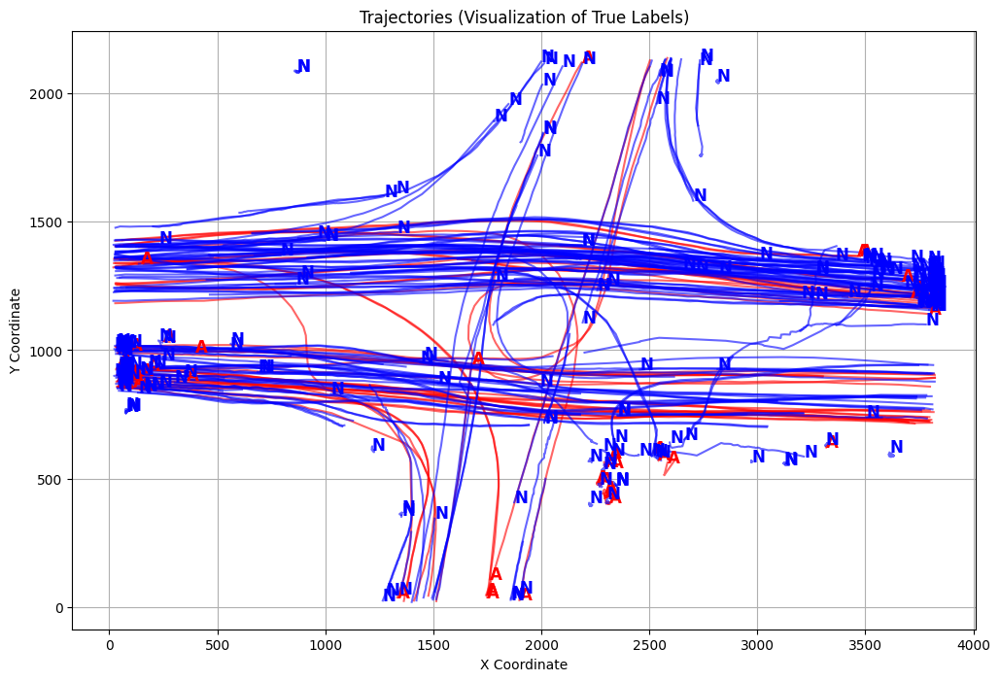

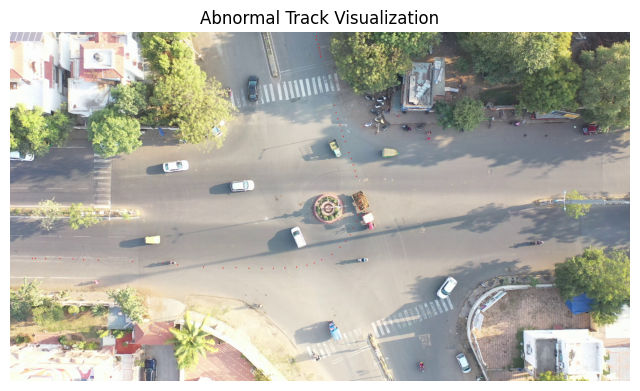

In [43]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tslearn.preprocessing import TimeSeriesResampler
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Import SMOTE from imblearn
from imblearn.over_sampling import SMOTE

###############################################################################
# Parameters & Paths
###############################################################################
sample = "12"  # Process folder "12"
folder_path = sample            # Folder containing CSV files for sample 12
abnormal_txt_file = f"AbnormalTracks_{sample}.txt"  # File with abnormal track IDs
image_path = f"sample{sample}.jpg"  # Background image (optional)

# Create output directory if needed
output_dir = "trajectory_images"
os.makedirs(output_dir, exist_ok=True)

###############################################################################
# 1. Read Abnormal Track IDs and Determine Valid Files
###############################################################################
with open(abnormal_txt_file, "r") as file:
    abnormal_lines = [line.strip() for line in file.readlines() if line.strip()]
    abnormal_files_names = [line.split(".")[0] for line in abnormal_lines]

all_csv_files = set(os.listdir(folder_path))
print(len(all_csv_files), "CSV files found in folder:", folder_path)

valid_abnormal_files = []
for name in abnormal_files_names:
    for csv_file_name in list(all_csv_files):
        if csv_file_name.endswith(".csv") and name in csv_file_name:
            valid_abnormal_files.append(csv_file_name)
            all_csv_files.remove(csv_file_name)
            break

valid_normal_files = [f for f in all_csv_files if f.endswith('.csv') and f not in valid_abnormal_files]

print("Valid abnormal files:", valid_abnormal_files)
print("Number of valid abnormal files:", len(valid_abnormal_files))
print("Valid normal files:", valid_normal_files)
print("Number of valid normal files:", len(valid_normal_files))

###############################################################################
# 2. Functions to Extract and Process Trajectories
###############################################################################
def extract_trajectory(csv_path):
    """
    Reads a CSV file (columns: frameNo, left, top, w, h) and returns the trajectory 
    as an array of [frameNo, center_x, center_y] values.
    """
    df = pd.read_csv(csv_path, usecols=["frameNo", "left", "top", "w", "h"])
    df["center_x"] = df["left"] + df["w"] / 2
    df["center_y"] = df["top"] + df["h"] / 2
    return df[["frameNo", "center_x", "center_y"]].values

def resample_trajectory_ts(traj, n_points=50):
    """
    Resamples the trajectory to a fixed number of points using tslearn's TimeSeriesResampler.
    """
    traj = np.array(traj)
    traj = traj.reshape(1, traj.shape[0], traj.shape[1])
    resampler = TimeSeriesResampler(sz=n_points)
    traj_resampled = resampler.fit_transform(traj)
    return traj_resampled[0]

def compute_additional_features(traj):
    """
    Computes additional features:
      - Average speed: mean Euclidean distance between consecutive points.
      - Average acceleration: mean absolute change in speed.
      - Average angular change: mean absolute change in direction (radians).
    """
    diffs = np.diff(traj[:, 1:3], axis=0)
    speeds = np.linalg.norm(diffs, axis=1)
    avg_speed = np.mean(speeds) if len(speeds) > 0 else 0

    if len(speeds) > 1:
        accels = np.diff(speeds)
        avg_accel = np.mean(np.abs(accels))
    else:
        avg_accel = 0

    angles = np.arctan2(diffs[:, 1], diffs[:, 0])
    if len(angles) > 1:
        angle_diffs = np.diff(angles)
        angle_diffs = (angle_diffs + np.pi) % (2 * np.pi) - np.pi  # Normalize to [-pi, pi]
        avg_angle_change = np.mean(np.abs(angle_diffs))
    else:
        avg_angle_change = 0

    return avg_speed, avg_accel, avg_angle_change

###############################################################################
# 3. Load Trajectories & Prepare Ground-Truth Labels
###############################################################################
trajectories = []  # List of resampled trajectories
true_labels = []   # 1 for abnormal, 0 for normal
file_names = []

# Process abnormal CSV files
for file_name in valid_abnormal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(1)
        file_names.append(file_name)

# Process normal CSV files
for file_name in valid_normal_files:
    file_path = os.path.join(folder_path, file_name)
    traj = extract_trajectory(file_path)
    if len(traj) > 1:
        traj_resampled = resample_trajectory_ts(traj, n_points=50)
        trajectories.append(traj_resampled)
        true_labels.append(0)
        file_names.append(file_name)

print(f"Loaded {len(trajectories)} trajectories from folder {folder_path}.")

###############################################################################
# 4. Create Combined Spatiotemporal Feature Vectors
###############################################################################
feature_vectors = []
for traj in trajectories:
    # Temporal feature: mean frame number
    temporal = np.mean(traj[:, 0])
    # Spatial feature: flatten resampled (x, y) coordinates (50*2 = 100 values)
    spatial = traj[:, 1:3].flatten()
    # Additional features: average speed, acceleration, angular change (3 values)
    avg_speed, avg_accel, avg_angle_change = compute_additional_features(traj)
    combined = np.concatenate(([temporal], spatial, [avg_speed, avg_accel, avg_angle_change]))
    feature_vectors.append(combined)

X = np.array(feature_vectors)
print("Initial feature vector shape:", X.shape)  # Expected shape: (n_samples, 104)

###############################################################################
# 4a. Scale All Features
###############################################################################
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled feature vector shape:", X_scaled.shape)

###############################################################################
# 5. Apply SMOTE to Balance the Data
###############################################################################
# SMOTE is used to oversample the minority class (abnormal) in the feature space.
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X_scaled, np.array(true_labels))
print("After SMOTE, feature shape:", X_smote.shape)
print("After SMOTE, label distribution:", np.bincount(y_smote))

###############################################################################
# 6. Custom Spatio-Temporal Distance Metric for DBSCAN
###############################################################################
# We assume:
#   - First element: temporal feature.
#   - Next 100 elements: spatial features.
#   - Last 3 elements: extra features.
temporal_weight = 0.05  # Adjust as needed
spatial_weight = 1.0
extra_weight = 1.0

def spatiotemporal_distance(u, v):
    temp_dist = abs(u[0] - v[0])
    spat_dist = np.linalg.norm(u[1:101] - v[1:101])
    extra_dist = np.linalg.norm(u[101:] - v[101:])
    return temporal_weight * temp_dist + spatial_weight * spat_dist + extra_weight * extra_dist

###############################################################################
# 7. Clustering with DBSCAN Using the Custom Metric on SMOTE Data
###############################################################################
dbscan = DBSCAN(eps=3.5, min_samples=2, metric=spatiotemporal_distance)
clusters = dbscan.fit_predict(X_smote)
print("DBSCAN cluster labels:", clusters)

# In this mapping, we assume noise (cluster == -1) is abnormal.
predicted_labels = [1 if c == -1 else 0 for c in clusters]

###############################################################################
# 8. Evaluate Clustering Results Against SMOTE Ground Truth
###############################################################################
# Evaluate on the oversampled (balanced) dataset.
acc = accuracy_score(y_smote, predicted_labels)
print("Clustering accuracy after SMOTE:", acc)

cm = confusion_matrix(y_smote, predicted_labels)
cr = classification_report(y_smote, predicted_labels)
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(cr)

###############################################################################
# 9. Visualize Trajectories with Annotated Predicted Labels
###############################################################################
plt.figure(figsize=(12, 8))
# Since SMOTE creates synthetic samples, we visualize only the original trajectories.
# Here, we compare the predicted labels on original data (without SMOTE) for visualization.
# You might want to map the clustering model back to original space.
for i, traj in enumerate(trajectories):
    # Here, use the original predicted label from the clustering on SMOTE 
    # if you saved a mapping, else visualize original true labels.
    color = "red" if true_labels[i] == 1 else "blue"
    plt.plot(traj[:, 1], traj[:, 2], color=color, alpha=0.6)
    label_text = "A" if true_labels[i] == 1 else "N"
    plt.text(traj[0, 1], traj[0, 2], label_text, fontsize=12, fontweight="bold", color=color)
plt.title("Trajectories (Visualization of True Labels)")
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.grid(True)
plt.show()

###############################################################################
# 10. (Optional) Visualize a Track on the Background Image
###############################################################################
def visualize_track_on_image(image_path, trajectory, window_name="Track Visualization"):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Image {image_path} not found.")
        return
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for point in trajectory:
        x, y = int(point[1]), int(point[2])
        cv2.circle(image, (x, y), 3, (255, 0, 0), -1)
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.title(window_name)
    plt.axis("off")
    plt.show()

if trajectories and true_labels[0] == 1:
    visualize_track_on_image(image_path, trajectories[0], window_name="Abnormal Track Visualization")


c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)
C:\Users\abhis\AppData\Local\Temp\ipykernel_66256\549612757.py:71: RuntimeWarning: divide by zero encountered in scalar divide
  plt.plot(resampled_X[i][:, 0], resampled_X[i][:, 1], color=plt.cm.jet(labels[i] / max(labels + 1)))


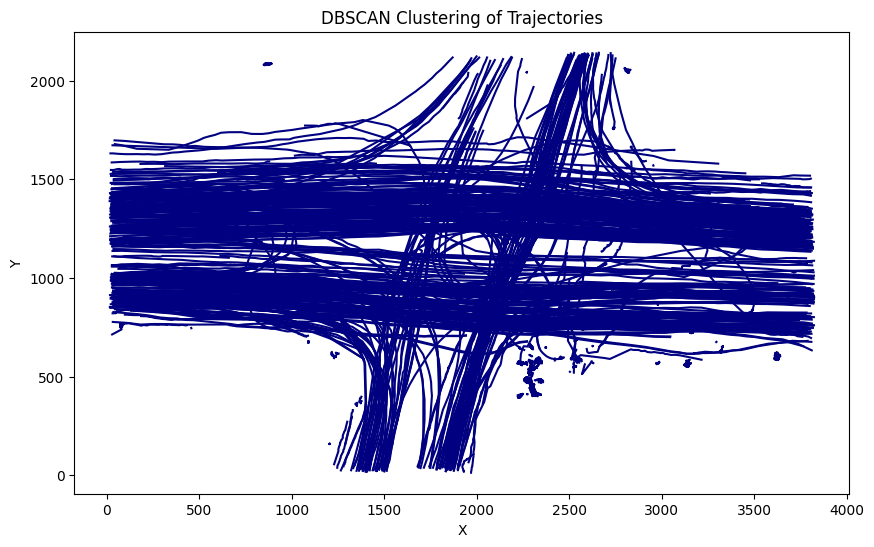

Cluster Counts:
Cluster -1: 758 trajectories
Dataset with DBSCAN clustering saved in 'trajectory_dataset/dataset_dbscan.pkl'


In [17]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN
from scipy.interpolate import interp1d
from tslearn.preprocessing import TimeSeriesResampler

# List of samples to process
samples = ["10", "11", "12"]  # Dataset folders

# Output directory for saving dataset
dataset_dir = "trajectory_dataset"
os.makedirs(dataset_dir, exist_ok=True)

# Define dataset storage
X = []  # Features (trajectory points)
y = []  # Labels (0 for normal, 1 for abnormal)

# Process each sample
for sample in samples:
    txt_file_path = f"AbnormalTracks_{sample}.txt"  # Text file containing abnormal CSV filenames
    base_dir = sample  # Base directory containing CSV files
    
    # Read abnormal trajectory filenames
    with open(txt_file_path, "r") as file:
        abnormal_files = {line.strip() for line in file.readlines() if line.strip()}
    
    # Get all CSV files in the folder
    all_csv_files = os.listdir(base_dir)
    
    # Process each CSV file
    for csv_file in all_csv_files:
        label = 1 if csv_file in abnormal_files else 0  # 1 for abnormal, 0 for normal
        df = pd.read_csv(os.path.join(base_dir, csv_file))
        
        # Compute bounding box center
        df["center_x"] = df["left"] + df["w"] / 2
        df["center_y"] = df["top"] + df["h"] / 2
        
        # Store trajectory as feature vector
        trajectory_points = list(zip(df["center_x"].values, df["center_y"].values))
        X.append(trajectory_points)
        y.append(label)

# Convert trajectories to fixed-length sequences
fixed_length = 50
resampled_X = []
for traj in X:
    traj = np.array(traj)
    if len(traj) < 2:
        continue  # Skip very short trajectories
    interp_func_x = interp1d(np.linspace(0, 1, len(traj)), traj[:, 0], kind='linear')
    interp_func_y = interp1d(np.linspace(0, 1, len(traj)), traj[:, 1], kind='linear')
    new_x = interp_func_x(np.linspace(0, 1, fixed_length))
    new_y = interp_func_y(np.linspace(0, 1, fixed_length))
    resampled_X.append(np.column_stack((new_x, new_y)))

resampled_X = np.array(resampled_X)

# Apply DBSCAN
dbscan = DBSCAN(eps=5, min_samples=5, metric='euclidean')
labels = dbscan.fit_predict(resampled_X.reshape(resampled_X.shape[0], -1))

# Visualize clusters
plt.figure(figsize=(10, 6))
for i in range(len(resampled_X)):
    plt.plot(resampled_X[i][:, 0], resampled_X[i][:, 1], color=plt.cm.jet(labels[i] / max(labels + 1)))
plt.title("DBSCAN Clustering of Trajectories")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

# Print cluster counts
unique_labels, counts = np.unique(labels, return_counts=True)
print("Cluster Counts:")
for lbl, count in zip(unique_labels, counts):
    print(f"Cluster {lbl}: {count} trajectories")

# Save dataset using pickle
dataset = {
    "train": {"X": resampled_X, "y": y},
    "clusters": labels
}

with open(os.path.join(dataset_dir, "dataset_dbscan.pkl"), "wb") as f:
    pickle.dump(dataset, f)

print(f"Dataset with DBSCAN clustering saved in '{dataset_dir}/dataset_dbscan.pkl'")


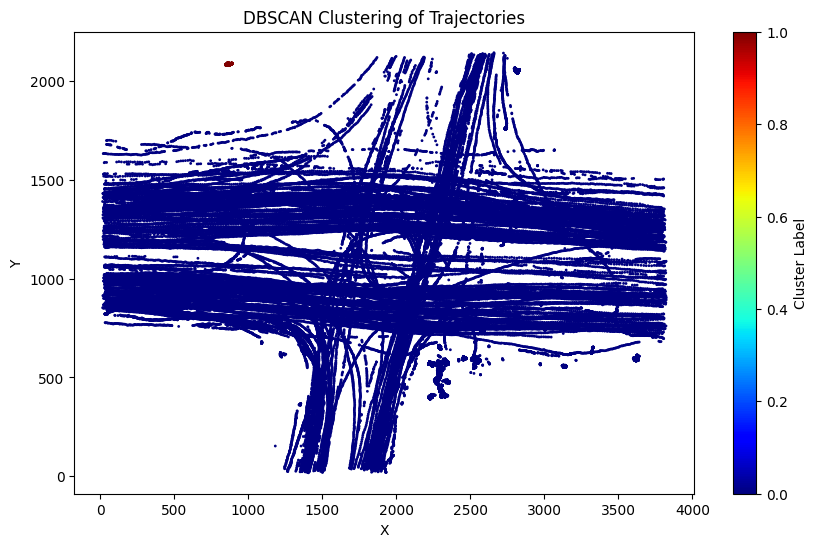

DBSCAN Clustering Accuracy: 0.08


In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Load dataset
with open("trajectory_dataset/dataset.pkl", "rb") as f:
    dataset = pickle.load(f)

X_train, y_train = dataset["train"]["X"], dataset["train"]["y"]
X_val, y_val = dataset["val"]["X"], dataset["val"]["y"]
X_test, y_test = dataset["test"]["X"], dataset["test"]["y"]

# Flatten trajectories for DBSCAN input
X_train_flat = [point for traj in X_train for point in traj]
X_val_flat = [point for traj in X_val for point in traj]
X_test_flat = [point for traj in X_test for point in traj]

# Standardize data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_flat)
X_val_scaled = scaler.transform(X_val_flat)
X_test_scaled = scaler.transform(X_test_flat)

# Apply DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=5)
train_labels = dbscan.fit_predict(X_train_scaled)

# Visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter([x[0] for x in X_train_flat], [x[1] for x in X_train_flat], c=train_labels, cmap='jet', s=1)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("DBSCAN Clustering of Trajectories")
plt.colorbar(label="Cluster Label")
plt.show()

# Compute clustering accuracy
normal_correct = sum((train_labels[i] == -1 and y_train[i] == 0) or (train_labels[i] != -1 and y_train[i] == 1) for i in range(len(y_train)))
accuracy = normal_correct / len(y_train)
print(f"DBSCAN Clustering Accuracy: {accuracy:.2f}")


SVM Accuracy: 0.714
AdaBoost Accuracy: 0.739
Bagging Accuracy: 0.833
[LightGBM] [Info] Number of positive: 173, number of negative: 436
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 609, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.284072 -> initscore=-0.924351
[LightGBM] [Info] Start training from score -0.924351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

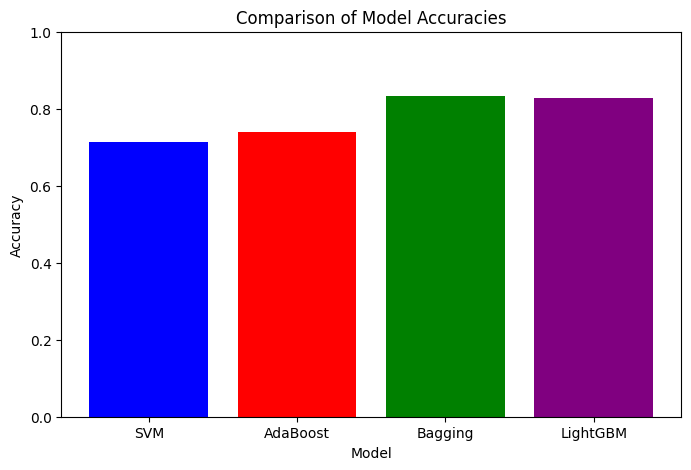

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score

##############################################################################
# 1. COMBINE LABEL FILES (IF NOT ALREADY COMBINED)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

df_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
df_labels["filename"] = df_labels["filename"].str.replace("\\", "/")

combined_labels_file = "trajectory_images/combined_labels.csv"
df_labels.to_csv(combined_labels_file, index=False)

##############################################################################
# 2. FEATURE EXTRACTION FUNCTION
##############################################################################

def extract_track_features(csv_file_path):
    df = pd.read_csv(csv_file_path)
    track_length = len(df)
    
    center_x = df["left"] + df["w"] / 2
    center_y = df["top"] + df["h"] / 2
    
    mean_center_x = center_x.mean()
    mean_center_y = center_y.mean()
    
    areas = df["w"] * df["h"]
    mean_area = areas.mean()
    
    dx = center_x.diff().fillna(0)
    dy = center_y.diff().fillna(0)
    mean_vel_x = dx.mean()
    mean_vel_y = dy.mean()
    
    return {
        "track_length": track_length,
        "mean_center_x": mean_center_x,
        "mean_center_y": mean_center_y,
        "mean_area": mean_area,
        "mean_vel_x": mean_vel_x,
        "mean_vel_y": mean_vel_y
    }

##############################################################################
# 3. BUILD A DATAFRAME OF FEATURES
##############################################################################

base_dirs = ["10", "11", "12"]
all_features = []

for base_dir in base_dirs:
    for fname in os.listdir(base_dir):
        if fname.endswith(".csv"):
            csv_path = os.path.join(base_dir, fname)
            feats = extract_track_features(csv_path)
            feats["filename"] = csv_path.replace("\\", "/")
            all_features.append(feats)

df_features = pd.DataFrame(all_features)

##############################################################################
# 4. MERGE WITH LABELS
##############################################################################

df_labels = pd.read_csv(combined_labels_file)
df_merged = pd.merge(df_features, df_labels, on="filename", how="left")

feature_cols = [
    "track_length",
    "mean_center_x",
    "mean_center_y",
    "mean_area",
    "mean_vel_x",
    "mean_vel_y"
]
df_merged.dropna(subset=feature_cols + ["label"], inplace=True)

df_merged["label"] = df_merged["label"].astype(int)

X = df_merged[feature_cols].values
y = df_merged["label"].values

##############################################################################
# 5. TRAIN/TEST SPLIT
##############################################################################

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

##############################################################################
# 6. SCALE FEATURES
##############################################################################

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##############################################################################
# 7. TRAIN & EVALUATE CLASSIFIERS
##############################################################################

models = {
    "SVM": SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=100, random_state=42),
    "Bagging": BaggingClassifier(n_estimators=100, random_state=42),
    "LightGBM": LGBMClassifier(n_estimators=100, random_state=42)
}

accuracy_results = {}

for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    accuracy_results[model_name] = acc
    print(f"{model_name} Accuracy: {acc:.3f}")

##############################################################################
# 8. PLOT ACCURACY COMPARISON
##############################################################################

plt.figure(figsize=(8, 5))
plt.bar(accuracy_results.keys(), accuracy_results.values(), color=["blue", "red", "green", "purple"])
plt.ylim(0, 1)
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.title("Comparison of Model Accuracies")
plt.show()


In [ ]:
import os
import cv2
import pandas as pd
import numpy as np

# Clustering & metrics
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from tslearn.metrics import dtw

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

##############################################################################
# 1. COMBINE LABEL FILES (IF NEEDED)
##############################################################################

label_file_10 = "trajectory_images/sample10_labels.csv"
label_file_11 = "trajectory_images/sample11_labels.csv"
label_file_12 = "trajectory_images/sample12_labels.csv"

df_10 = pd.read_csv(label_file_10)
df_11 = pd.read_csv(label_file_11)
df_12 = pd.read_csv(label_file_12)

combined_labels = pd.concat([df_10, df_11, df_12], ignore_index=True)
# Normalize paths: replace backslashes with forward slashes and convert to lower-case
combined_labels["filename"] = combined_labels["filename"].str.replace("\\", "/").str.lower()

combined_labels_file = "trajectory_images/combined_labels.csv"
combined_labels.to_csv(combined_labels_file, index=False)
print(f"Combined labels saved as '{combined_labels_file}'.")

##############################################################################
# 2. FUNCTION TO EXTRACT FIXED-LENGTH TIME-SERIES USING OPTICAL FLOW
##############################################################################

def get_optical_flow_series(video_path, target_length=100):
    """
    Computes an optical flow based trajectory from a video file.
    For each consecutive frame pair, calculates the average motion vector.
    The resulting series is interpolated to a fixed length (target_length).
    
    Args:
        video_path (str): Path to the video file.
        target_length (int): Number of time points for the output series.
    
    Returns:
        np.ndarray: Array of shape (target_length, 2) where each row is [mean_flow_x, mean_flow_y].
    """
    cap = cv2.VideoCapture(video_path)
    ret, prev_frame = cap.read()
    if not ret:
        cap.release()
        return np.zeros((target_length, 2), dtype=np.float32)
    
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    flow_vectors = []

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        # Compute dense optical flow using Farneback's method
        flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None,
                                            pyr_scale=0.5, levels=3, winsize=15,
                                            iterations=3, poly_n=5, poly_sigma=1.2, flags=0)
        # Compute average flow vector over the frame
        mean_flow_x = np.mean(flow[..., 0])
        mean_flow_y = np.mean(flow[..., 1])
        flow_vectors.append([mean_flow_x, mean_flow_y])
        prev_gray = gray

    cap.release()

    original_length = len(flow_vectors)
    if original_length < 2:
        return np.zeros((target_length, 2), dtype=np.float32)
    
    flow_vectors = np.array(flow_vectors)
    x_original = np.linspace(0, 1, original_length)
    x_target = np.linspace(0, 1, target_length)
    
    flow_x_interp = np.interp(x_target, x_original, flow_vectors[:, 0])
    flow_y_interp = np.interp(x_target, x_original, flow_vectors[:, 1])
    
    series = np.vstack([flow_x_interp, flow_y_interp]).T  # shape = (target_length, 2)
    return series.astype(np.float32)

##############################################################################
# 3. COLLECT ALL TRAJECTORIES AND MERGE WITH LABELS
##############################################################################

# Assuming video files (e.g., .mp4) are stored in directories "10", "11", "12"
base_dirs = ["10", "11", "12"]
df_labels = pd.read_csv(combined_labels_file)
# Ensure the labels' filenames are lower-case for consistent matching
df_labels["filename"] = df_labels["filename"].str.lower()

all_data = []
for base_dir in base_dirs:
    if not os.path.isdir(base_dir):
        print(f"Directory '{base_dir}' not found. Skipping.")
        continue
    for fname in os.listdir(base_dir):
        # Adjust file extension if needed (e.g., .mp4)
        if fname.lower().endswith(".mp4"):
            video_path = os.path.join(base_dir, fname)
            # Normalize the path: replace backslashes and convert to lower-case
            video_path_for_label = video_path.replace("\\", "/").lower()
            # Debug print: show the file being processed
            print("Processing:", video_path_for_label)
            row_label = df_labels[df_labels["filename"] == video_path_for_label]
            if row_label.empty:
                print("  --> No label found for this file!")
                continue
            label = int(row_label.iloc[0]["label"])
            
            # Extract optical flow time series
            series_2d = get_optical_flow_series(video_path, target_length=100)
            all_data.append({
                "filename": video_path_for_label,
                "series_2d": series_2d,   # shape = (100, 2)
                "label": label
            })

df_trajectories = pd.DataFrame(all_data)
print(f"Collected {len(df_trajectories)} labeled trajectories.")
print("DataFrame columns:", df_trajectories.columns.tolist())

# Check if the expected column exists
if "series_2d" not in df_trajectories.columns:
    print("Error: 'series_2d' column not found. Check your data collection step.")
    exit()

if df_trajectories.empty:
    print("No trajectories collected. Please verify your file paths and labels.")
    exit()

##############################################################################
# 4. BUILD A PAIRWISE DTW DISTANCE MATRIX
##############################################################################
# We'll compute distance as:
# distance(i,j) = DTW(flow_x_i, flow_x_j) + DTW(flow_y_i, flow_y_j)

all_series_2d = df_trajectories["series_2d"].tolist()  # list of arrays, each (100,2)
labels = df_trajectories["label"].values               # 0 and 1

N = len(all_series_2d)
D = np.zeros((N, N), dtype=np.float32)

print("Computing pairwise DTW distances (this can be slow for large N)...")
for i in range(N):
    for j in range(i+1, N):
        series_i = all_series_2d[i]
        series_j = all_series_2d[j]
        # Separate x and y components
        x_i = series_i[:, 0]
        y_i = series_i[:, 1]
        x_j = series_j[:, 0]
        y_j = series_j[:, 1]
        
        dtw_x = dtw(x_i, x_j)
        dtw_y = dtw(y_i, y_j)
        distance = dtw_x + dtw_y
        
        D[i, j] = distance
        D[j, i] = distance

print("Pairwise DTW distance matrix shape:", D.shape)

##############################################################################
# 5. CLUSTERING WITH DBSCAN
##############################################################################

# Option 1: Using precomputed DTW distance matrix
dbscan_dtw = DBSCAN(eps=10.0, min_samples=5, metric="precomputed")
cluster_labels = dbscan_dtw.fit_predict(D)

# Option 2: Alternatively, using Euclidean metric on flattened trajectories.
# Flatten the 100x2 trajectory into a 200-dim feature vector.
X = np.array([traj.flatten() for traj in all_series_2d])
if X.shape[0] == 0:
    print("No feature vectors collected for clustering. Exiting.")
    exit()

dbscan_euc = DBSCAN(eps=5.0, min_samples=10, metric="euclidean")
cluster_labels_euc = dbscan_euc.fit_predict(X)

##############################################################################
# 6. EVALUATE CLUSTERS (MAJORITY-VOTE ACCURACY, ARI, NMI)
##############################################################################

def majority_vote_accuracy(true_labels, cluster_labels):
    unique_clusters = np.unique(cluster_labels)
    total = len(true_labels)
    correct = 0
    for c in unique_clusters:
        idx = np.where(cluster_labels == c)[0]
        if len(idx) == 0:
            continue
        # Majority label in this cluster
        majority_label = np.bincount(true_labels[idx]).argmax()
        correct += np.sum(true_labels[idx] == majority_label)
    return correct / total

print("\nDBSCAN with Precomputed DTW Results:")
acc_dtw = majority_vote_accuracy(labels, cluster_labels)
ari_dtw = adjusted_rand_score(labels, cluster_labels)
nmi_dtw = normalized_mutual_info_score(labels, cluster_labels)
print(f"  Majority-vote accuracy: {acc_dtw:.3f}")
print(f"  Adjusted Rand Index:    {ari_dtw:.3f}")
print(f"  Normalized MI:          {nmi_dtw:.3f}")

print("\nDBSCAN with Euclidean (flattened trajectory) Results:")
acc_euc = majority_vote_accuracy(labels, cluster_labels_euc)
ari_euc = adjusted_rand_score(labels, cluster_labels_euc)
nmi_euc = normalized_mutual_info_score(labels, cluster_labels_euc)
print(f"  Majority-vote accuracy: {acc_euc:.3f}")
print(f"  Adjusted Rand Index:    {ari_euc:.3f}")
print(f"  Normalized MI:          {nmi_euc:.3f}")

print("\nDone.")


c:\Users\abhis\anaconda3\envs\test\Lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


Combined labels saved as 'trajectory_images/combined_labels.csv'.
Collected 0 labeled trajectories.
DataFrame columns: []
Error: 'series_2d' column not found. Check your data collection step.
No trajectories collected. Please verify your file paths and labels.


KeyError: 'series_2d'

: 